## Predicting Menu Item and Item quantity using Linear Regression and LSTM

## Data  
**Restaurent.csv**
- The dataset is for restaurant sales for Friday and Saturday, both lunch and dinner time. There are few instances of 'To-Go' orders like Uber Eats in this dataset.
- The columns are self-explanatory
- typical lunch hour is 11:30AM-2:00PM, and dinner hour is 6:30PM-10:00PM
- `item_qty` is the target fields and `shift`, `party_size`, `menu_category`, `menu_item`, `item_price` are Features fields.

We need to predict the menu item and item quantity in the duration: July 1st, 2019 to July 7th, 2019. 

In [261]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, Dropout
from tensorflow.keras.models import load_model

import time

%matplotlib inline

In [262]:
import pandas as pd
df = pd.read_csv('Restaurent.csv')
df

,StoreCode,DTS,Shift,Day Type,Day,Month,Date,Year,Time,TicketCode,PartySize,MenuCateogry,MenuItem,ItemPrice,ItemQty
0,YALEV6B6K3,01/01/2019 11:30AM,Lunch,Weekday,Tuesday,1,1,2019,11:30AM,YALE0001,4,Starter,GOBI MANCHURIAN,14.00,1
1,YALEV6B6K3,01/01/2019 11:30AM,Lunch,Weekday,Tuesday,1,1,2019,11:30AM,YALE0001,4,Starter,TASTY FLATBREAD,11.00,1
2,YALEV6B6K3,01/01/2019 11:30AM,Lunch,Weekday,Tuesday,1,1,2019,11:30AM,YALE0001,4,VEGETABLE SPECIALS,SARSON DA SAAG,15.00,1
3,YALEV6B6K3,01/01/2019 11:30AM,Lunch,Weekday,Tuesday,1,1,2019,11:30AM,YALE0001,4,VEGETABLE SPECIALS,PANEER VINDALOO,16.00,1
4,YALEV6B6K3,01/01/2019 11:30AM,Lunch,Weekday,Tuesday,1,1,2019,11:30AM,YALE0001,4,BREADS,GARLIC NAAN,3.50,2
5,YALEV6B6K3,01/01/2019 11:30AM,Lunch,Weekday,Tuesday,1,1,2019,11:30AM,YALE0001,4,BREADS,NAAN,2.75,2
6,YALEV6B6K3,01/01/2019 11:40AM,Lunch,Weekday,Tuesday,1,1,2019,11:40AM,YALE0002,3,Starter,MASALA CHICKEN WINGS,14.00,1
7,YALEV6B6K3,01/01/2019 11:40AM,Lunch,Weekday,Tuesday,1,1,2019,11:40AM,YALE0002,3,Starter,COCKTAIL CHICKEN SAMOSAS,14.00,1
8,YALEV6B6K3,01/01/2019 11:40AM,Lunch,Weekday,Tuesday,1,1,2019,11:40AM,YALE0002,3,CHICKEN SPECIALS,CHICKEN KORMA,18.00,1
9,YALEV6B6K3,01/01/2019 11:40AM,Lunch,Weekday,Tuesday,1,1,2019,11:40AM,YALE0002,3,RICE SPECIALS,CHICKEN BIRYANI,19.00,1


In [263]:
df.groupby(df['Day Type']).sum()[0:50]

,Month,Date,Year,ItemPrice,ItemQty
Day Type,,,,,
Weekday,100,100,201900,1058.75,143
Weekend,100,181,201900,1058.75,143


In [264]:
df.dtypes

StoreCode        object
DTS              object
Shift            object
Day Type         object
Day              object
Month             int64
Date              int64
Year              int64
Time             object
TicketCode       object
PartySize        object
MenuCateogry     object
MenuItem         object
ItemPrice       float64
ItemQty           int64
dtype: object

## Data cleaning¶
The raw data had the following issues:

- column names not proper
- Missing data
- Expansion and Randomization of data

To get the data into usable form, I did the following steps:

- Rename the column fields to get easy access of the dataframe
- Replace the missing values like `na` with `1` as we are going to categorize it. 
- I am going to form the randomize data using `df_TC_to_IQTY1` dataframe which contains 200 rows of data, randomized means we are going to take random row form 200 rows of data at each time, with an expansion of rows by a time difference of 5 min for lunch and dinner both, like 11:30,11:35.... and 6:30,6:35 ... etc 

**Rename** the field names of a dataframe to lower case for easy access to it. 

In [265]:
cols = df.columns
print(cols)

Index(['StoreCode', 'DTS', 'Shift', 'Day Type', 'Day', 'Month', 'Date', 'Year',
       'Time', 'TicketCode', 'PartySize', 'MenuCateogry', 'MenuItem',
       'ItemPrice', 'ItemQty'],
      dtype='object')


In [266]:
df = df.rename(columns={'StoreCode':'store_code','TicketCode': 'ticket_code', 'PartySize': 'party_size', 'MenuCateogry': 'menu_category','MenuItem':'menu_item',
                        'ItemPrice':'item_price', 'ItemQty':'item_qty','DTS':'dts','Shift':'shift','Day Type':'day_type','Day':'day','Month':'month','year':'year','Time':'time','Date':'date'})

In [267]:
cat_cols = ['store_code', 'ticket_code', 'party_size', 'menu_category', 'menu_item', 'shift']
print(cat_cols)

['store_code', 'ticket_code', 'party_size', 'menu_category', 'menu_item', 'shift']


In [268]:
for col in cat_cols:
    print(df[col].value_counts())

YALEV6B6K4    177
YALEV6B6K3     23
Name: store_code, dtype: int64
YALE0019    19
YALE0009    19
YALE0004    10
YALE0014    10
YALE0007    10
YALE0017    10
YALE0018     9
YALE0008     9
GRHUB002     8
YALE0006     7
YALE0016     7
YALE0011     6
YALE0010     6
YALE0020     6
UBER003      6
YALE0001     6
UBER005      6
UBER002      5
UBER004      5
YALE0012     5
YALE0015     5
YALE0002     5
YALE0005     5
YALE0013     4
UBER001      4
GRHUB001     4
YALE0003     4
Name: ticket_code, dtype: int64
5     68
3     43
na    38
4     30
2     21
Name: party_size, dtype: int64
BREADS                 54
Starter                34
DESSERTS               30
VEGETABLE SPECIALS     28
CHICKEN SPECIALS       26
RICE SPECIALS          18
SEAFOOD SPECIALTIES     8
LAMB SPECIALTIES        2
Name: menu_category, dtype: int64
GARLIC NAAN                           20
RICE                                  12
BUTTER CHICKEN                        10
NAAN                                  10
GULABJAMUN    

Above analysis of categorical columns of a data frame shows that there are many categorical values `menu_items` and `menu_category` on the data.

In [269]:
df.groupby(df['day_type']).sum()[0:50]

,month,date,Year,item_price,item_qty
day_type,,,,,
Weekday,100,100,201900,1058.75,143
Weekend,100,181,201900,1058.75,143


The `df_TC_to_IQTY1` Dataframe is used to prepare Resultant dataset we want to predict by random sampling of dataset `df`

In [270]:
df_TC_to_IQTY1 = df[['ticket_code','party_size','menu_category','menu_item', 'item_price', 'item_qty']]
df_TC_to_IQTY1

,ticket_code,party_size,menu_category,menu_item,item_price,item_qty
0,YALE0001,4,Starter,GOBI MANCHURIAN,14.00,1
1,YALE0001,4,Starter,TASTY FLATBREAD,11.00,1
2,YALE0001,4,VEGETABLE SPECIALS,SARSON DA SAAG,15.00,1
3,YALE0001,4,VEGETABLE SPECIALS,PANEER VINDALOO,16.00,1
4,YALE0001,4,BREADS,GARLIC NAAN,3.50,2
5,YALE0001,4,BREADS,NAAN,2.75,2
6,YALE0002,3,Starter,MASALA CHICKEN WINGS,14.00,1
7,YALE0002,3,Starter,COCKTAIL CHICKEN SAMOSAS,14.00,1
8,YALE0002,3,CHICKEN SPECIALS,CHICKEN KORMA,18.00,1
9,YALE0002,3,RICE SPECIALS,CHICKEN BIRYANI,19.00,1


In [271]:
df_TC_to_IQTY1.shape

(200, 6)

In [272]:
df['dts'] = pd.to_datetime(df['dts'])
df['dts']

0     2019-01-01 11:30:00
1     2019-01-01 11:30:00
2     2019-01-01 11:30:00
3     2019-01-01 11:30:00
4     2019-01-01 11:30:00
5     2019-01-01 11:30:00
6     2019-01-01 11:40:00
7     2019-01-01 11:40:00
8     2019-01-01 11:40:00
9     2019-01-01 11:40:00
10    2019-01-01 11:40:00
11    2019-01-01 11:50:00
12    2019-01-01 11:50:00
13    2019-01-01 11:50:00
14    2019-01-01 11:50:00
15    2019-01-01 11:50:00
16    2019-01-01 11:50:00
17    2019-01-01 11:50:00
18    2019-01-01 11:50:00
19    2019-01-01 12:05:00
20    2019-01-01 12:05:00
21    2019-01-01 12:05:00
22    2019-01-01 12:05:00
23    2019-01-01 12:05:00
24    2019-01-01 12:05:00
25    2019-01-01 12:05:00
26    2019-01-01 12:05:00
27    2019-01-01 12:05:00
28    2019-01-01 12:05:00
29    2019-01-01 12:10:00
30    2019-01-01 12:10:00
31    2019-01-01 12:10:00
32    2019-01-01 12:10:00
33    2019-01-01 12:10:00
34    2019-01-01 12:10:00
35    2019-01-01 12:10:00
36    2019-01-01 12:10:00
37    2019-01-01 12:10:00
38    2019-0

In [273]:
from datetime import datetime  
from datetime import timedelta 
k = df['dts'].loc[0] + timedelta(minutes = 5)
k

Timestamp('2019-01-01 11:35:00')

In [274]:
k.strftime("%A")

'Tuesday'

Create a function to return weekday and weekend for certain conditions as shown below

In [275]:
def Week_day_end(date):
    if date.weekday() >= 0 and date.weekday() <=3:
        return 'Weekday'
    elif date.weekday() == 4:
        return 'Fri'
    else:
        return 'Weekend'
# Week_day_end(df['dts'].loc[0])

## Expansion and Randomization of data for initial 6 months of 2019 i.e Jan-2019 to Jun-2019 

In [276]:
import random
random.seed(2020)

def expansion_randomize_data(start_date, end_date, date, df_TC_to_IQTY):

    rows_list = []
    while date >= start_date and date <= end_date:
        row_list = []
        count = 0

        a = datetime(date.year, date.month, date.day, 11,30,0)
        b = datetime(date.year, date.month, date.day, 14,0,0)
        c = datetime(date.year, date.month, date.day, 18,30,0)
        d = datetime(date.year, date.month, date.day, 22,0,0)

        if Week_day_end(date) == 'Weekday':
            count = random.choice(range(1,6))
        elif Week_day_end(date) == 'Fri' and date <=b:
            count = random.choice(range(1,6))
        elif Week_day_end(date) == 'Fri' and date <=d:
            count = random.choice(range(5,10))
        if Week_day_end(date) == 'Weekend':
            count = random.choice(range(5,10))

    #     print(count)
        for i in range(count):
            row_list = []
            if (date >= a and date <= b):
    #             print('shubham')
                row_list.append(date)
                row_list.append('lunch')
                row_list.append(date.weekday()+1)
                row_list += list(df_TC_to_IQTY.iloc[random.choice(range(200))])
                print(row_list)
                rows_list.append(row_list)
            elif (date >= c and date <=d):
    #               print('shubham')
                row_list.append(date)
                row_list.append('dinner')
                row_list.append(date.weekday()+1)
                row_list += list(df_TC_to_IQTY.iloc[random.choice(range(200))])
                print(row_list)
                rows_list.append(row_list)


    #         date += timedelta(minutes=5)

        date += timedelta(minutes=5)    
    #     print(date)
    return rows_list

start_date = datetime.strptime('2019-01-01 00:00:00', '%Y-%m-%d %H:%M:%S')
end_date = datetime.strptime('2019-06-30 23:00:00', '%Y-%m-%d %H:%M:%S')
date = datetime.strptime('2019-01-01 00:00:00', '%Y-%m-%d %H:%M:%S')
rows_list = expansion_randomize_data(start_date, end_date, date, df_TC_to_IQTY1)

[datetime.datetime(2019, 1, 1, 11, 30), 'lunch', 2, 'YALE0008', '3', 'RICE SPECIALS', 'RICE', 5.0, 1]
[datetime.datetime(2019, 1, 1, 11, 30), 'lunch', 2, 'YALE0006', '3', 'VEGETABLE SPECIALS', 'YELLOW DAL FRY', 15.0, 1]
[datetime.datetime(2019, 1, 1, 11, 30), 'lunch', 2, 'UBER005', 'na', 'VEGETABLE SPECIALS', 'KADAHI PANEER', 16.0, 2]
[datetime.datetime(2019, 1, 1, 11, 30), 'lunch', 2, 'YALE0012', '4', 'DESSERTS', 'RASMALAI', 6.0, 2]
[datetime.datetime(2019, 1, 1, 11, 35), 'lunch', 2, 'YALE0001', '4', 'Starter', 'GOBI MANCHURIAN', 14.0, 1]
[datetime.datetime(2019, 1, 1, 11, 35), 'lunch', 2, 'GRHUB002', 'na', 'VEGETABLE SPECIALS', 'MALAI KOFTA', 16.0, 2]
[datetime.datetime(2019, 1, 1, 11, 40), 'lunch', 2, 'YALE0004', '5', 'VEGETABLE SPECIALS', 'MALAI KOFTA', 16.0, 2]
[datetime.datetime(2019, 1, 1, 11, 40), 'lunch', 2, 'GRHUB002', 'na', 'BREADS', 'GARLIC NAAN', 3.5, 2]
[datetime.datetime(2019, 1, 1, 11, 40), 'lunch', 2, 'YALE0017', '5', 'VEGETABLE SPECIALS', 'YELLOW DAL FRY', 15.0, 1]
[d

[datetime.datetime(2019, 1, 3, 13, 55), 'lunch', 4, 'UBER002', 'na', 'BREADS', 'GARLIC NAAN', 3.5, 2]
[datetime.datetime(2019, 1, 3, 14, 0), 'lunch', 4, 'YALE0016', '3', 'CHICKEN SPECIALS', 'COCONUT CHICKEN CURRY', 18.0, 1]
[datetime.datetime(2019, 1, 3, 14, 0), 'lunch', 4, 'YALE0007', '4', 'BREADS', 'LACHA PARATHA', 5.0, 2]
[datetime.datetime(2019, 1, 3, 14, 0), 'lunch', 4, 'YALE0014', '5', 'BREADS', 'NAAN', 2.75, 1]
[datetime.datetime(2019, 1, 3, 14, 0), 'lunch', 4, 'YALE0005', '2', 'BREADS', 'ALOO PARATHA', 5.0, 1]
[datetime.datetime(2019, 1, 3, 18, 30), 'dinner', 4, 'YALE0002', '3', 'BREADS', 'ONION KULCHA', 5.0, 2]
[datetime.datetime(2019, 1, 3, 18, 30), 'dinner', 4, 'YALE0019', '5', 'SEAFOOD SPECIALTIES', 'FISH KORMA', 19.0, 1]
[datetime.datetime(2019, 1, 3, 18, 35), 'dinner', 4, 'YALE0011', '3', 'BREADS', 'ONION KULCHA', 5.0, 1]
[datetime.datetime(2019, 1, 3, 18, 35), 'dinner', 4, 'YALE0006', '3', 'RICE SPECIALS', 'RICE', 5.0, 1]
[datetime.datetime(2019, 1, 3, 18, 35), 'dinner',

[datetime.datetime(2019, 1, 5, 20, 45), 'dinner', 6, 'YALE0008', '3', 'Starter', 'FISH PAKORA', 14.0, 2]
[datetime.datetime(2019, 1, 5, 20, 45), 'dinner', 6, 'YALE0010', '2', 'BREADS', 'NAAN', 2.75, 1]
[datetime.datetime(2019, 1, 5, 20, 45), 'dinner', 6, 'YALE0004', '5', 'Starter', 'CHAAT PAPRI', 11.0, 2]
[datetime.datetime(2019, 1, 5, 20, 45), 'dinner', 6, 'YALE0009', '5', 'DESSERTS', 'RASMALAI', 6.0, 1]
[datetime.datetime(2019, 1, 5, 20, 45), 'dinner', 6, 'YALE0014', '5', 'DESSERTS', 'CARROT HALWA', 7.0, 1]
[datetime.datetime(2019, 1, 5, 20, 50), 'dinner', 6, 'UBER002', 'na', 'BREADS', 'TANDOORI ROTI', 2.75, 1]
[datetime.datetime(2019, 1, 5, 20, 50), 'dinner', 6, 'YALE0016', '3', 'BREADS', 'GARLIC NAAN', 3.5, 1]
[datetime.datetime(2019, 1, 5, 20, 50), 'dinner', 6, 'UBER003', 'na', 'CHICKEN SPECIALS', 'BUTTER CHICKEN', 18.0, 3]
[datetime.datetime(2019, 1, 5, 20, 50), 'dinner', 6, 'YALE0017', '5', 'VEGETABLE SPECIALS', 'YELLOW DAL FRY', 15.0, 1]
[datetime.datetime(2019, 1, 5, 20, 50), 

[datetime.datetime(2019, 1, 6, 20, 10), 'dinner', 7, 'YALE0014', '5', 'VEGETABLE SPECIALS', 'MALAI KOFTA', 16.0, 2]
[datetime.datetime(2019, 1, 6, 20, 10), 'dinner', 7, 'YALE0017', '5', 'BREADS', 'ALOO PARATHA', 5.0, 1]
[datetime.datetime(2019, 1, 6, 20, 15), 'dinner', 7, 'YALE0007', '4', 'VEGETABLE SPECIALS', 'KADAHI PANEER', 16.0, 1]
[datetime.datetime(2019, 1, 6, 20, 15), 'dinner', 7, 'UBER002', 'na', 'RICE SPECIALS', 'RICE', 5.0, 2]
[datetime.datetime(2019, 1, 6, 20, 15), 'dinner', 7, 'YALE0014', '5', 'DESSERTS', 'CARROT HALWA', 7.0, 1]
[datetime.datetime(2019, 1, 6, 20, 15), 'dinner', 7, 'YALE0004', '5', 'BREADS', 'TANDOORI ROTI', 2.75, 2]
[datetime.datetime(2019, 1, 6, 20, 15), 'dinner', 7, 'GRHUB001', 'na', 'CHICKEN SPECIALS', 'BUTTER CHICKEN', 18.0, 2]
[datetime.datetime(2019, 1, 6, 20, 15), 'dinner', 7, 'GRHUB001', 'na', 'CHICKEN SPECIALS', 'BUTTER CHICKEN', 18.0, 2]
[datetime.datetime(2019, 1, 6, 20, 15), 'dinner', 7, 'YALE0009', '5', 'CHICKEN SPECIALS', 'CHICKEN TIKKA MASALA

[datetime.datetime(2019, 1, 10, 12, 5), 'lunch', 4, 'UBER005', 'na', 'BREADS', 'ONION KULCHA', 5.0, 2]
[datetime.datetime(2019, 1, 10, 12, 5), 'lunch', 4, 'YALE0004', '5', 'DESSERTS', 'GULABJAMUN', 6.0, 1]
[datetime.datetime(2019, 1, 10, 12, 5), 'lunch', 4, 'YALE0018', '4', 'BREADS', 'GARLIC NAAN', 3.5, 2]
[datetime.datetime(2019, 1, 10, 12, 5), 'lunch', 4, 'YALE0013', '3', 'VEGETABLE SPECIALS', 'BAINGAN BARTHA', 16.0, 1]
[datetime.datetime(2019, 1, 10, 12, 10), 'lunch', 4, 'GRHUB002', 'na', 'VEGETABLE SPECIALS', 'MALAI KOFTA', 16.0, 2]
[datetime.datetime(2019, 1, 10, 12, 10), 'lunch', 4, 'YALE0012', '4', 'RICE SPECIALS', 'RICE', 5.0, 1]
[datetime.datetime(2019, 1, 10, 12, 15), 'lunch', 4, 'YALE0003', '2', 'CHICKEN SPECIALS', 'CHICKEN TIKKA MASALA', 18.0, 1]
[datetime.datetime(2019, 1, 10, 12, 15), 'lunch', 4, 'YALE0007', '4', 'DESSERTS', 'GULABJAMUN', 6.0, 1]
[datetime.datetime(2019, 1, 10, 12, 15), 'lunch', 4, 'YALE0019', '5', 'BREADS', 'ONION KULCHA', 5.0, 1]
[datetime.datetime(2019

[datetime.datetime(2019, 1, 11, 19, 55), 'dinner', 5, 'YALE0011', '3', 'CHICKEN SPECIALS', 'CHICKEN TIKKA MASALA', 18.0, 1]
[datetime.datetime(2019, 1, 11, 19, 55), 'dinner', 5, 'YALE0009', '5', 'RICE SPECIALS', 'TIKKA RICE BOWL : PANEER | CHICKEN', 18.0, 2]
[datetime.datetime(2019, 1, 11, 19, 55), 'dinner', 5, 'YALE0006', '3', 'RICE SPECIALS', 'RICE', 5.0, 1]
[datetime.datetime(2019, 1, 11, 20, 0), 'dinner', 5, 'YALE0005', '2', 'DESSERTS', 'RASMALAI', 6.0, 1]
[datetime.datetime(2019, 1, 11, 20, 0), 'dinner', 5, 'YALE0009', '5', 'CHICKEN SPECIALS', 'BUTTER CHICKEN', 18.0, 1]
[datetime.datetime(2019, 1, 11, 20, 0), 'dinner', 5, 'YALE0009', '5', 'CHICKEN SPECIALS', 'BUTTER CHICKEN', 18.0, 1]
[datetime.datetime(2019, 1, 11, 20, 0), 'dinner', 5, 'YALE0018', '4', 'VEGETABLE SPECIALS', 'PANEER VINDALOO', 16.0, 1]
[datetime.datetime(2019, 1, 11, 20, 0), 'dinner', 5, 'GRHUB002', 'na', 'RICE SPECIALS', 'CHICKEN BIRYANI', 19.0, 2]
[datetime.datetime(2019, 1, 11, 20, 0), 'dinner', 5, 'YALE0018', 

[datetime.datetime(2019, 1, 12, 20, 15), 'dinner', 6, 'YALE0009', '5', 'CHICKEN SPECIALS', 'CHICKEN TIKKA MASALA', 18.0, 1]
[datetime.datetime(2019, 1, 12, 20, 15), 'dinner', 6, 'YALE0009', '5', 'BREADS', 'GARLIC NAAN', 3.5, 3]
[datetime.datetime(2019, 1, 12, 20, 20), 'dinner', 6, 'YALE0010', '2', 'CHICKEN SPECIALS', 'BUTTER CHICKEN', 18.0, 1]
[datetime.datetime(2019, 1, 12, 20, 20), 'dinner', 6, 'YALE0008', '3', 'SEAFOOD SPECIALTIES', 'FISH CURRY', 19.0, 2]
[datetime.datetime(2019, 1, 12, 20, 20), 'dinner', 6, 'YALE0014', '5', 'SEAFOOD SPECIALTIES', 'FISH CURRY', 19.0, 2]
[datetime.datetime(2019, 1, 12, 20, 20), 'dinner', 6, 'YALE0018', '4', 'BREADS', 'NAAN', 2.75, 2]
[datetime.datetime(2019, 1, 12, 20, 20), 'dinner', 6, 'YALE0019', '5', 'Starter', 'GOBI MANCHURIAN', 14.0, 2]
[datetime.datetime(2019, 1, 12, 20, 25), 'dinner', 6, 'YALE0009', '5', 'VEGETABLE SPECIALS', 'PANEER VINDALOO', 16.0, 1]
[datetime.datetime(2019, 1, 12, 20, 25), 'dinner', 6, 'UBER002', 'na', 'BREADS', 'TANDOORI 

[datetime.datetime(2019, 1, 13, 20, 10), 'dinner', 7, 'YALE0009', '5', 'DESSERTS', 'CARROT HALWA', 7.0, 1]
[datetime.datetime(2019, 1, 13, 20, 10), 'dinner', 7, 'YALE0004', '5', 'Starter', 'VEGETABLE SAMOSA', 11.0, 1]
[datetime.datetime(2019, 1, 13, 20, 10), 'dinner', 7, 'YALE0019', '5', 'CHICKEN SPECIALS', 'BUTTER CHICKEN', 18.0, 1]
[datetime.datetime(2019, 1, 13, 20, 10), 'dinner', 7, 'UBER005', 'na', 'BREADS', 'GARLIC NAAN', 3.5, 2]
[datetime.datetime(2019, 1, 13, 20, 10), 'dinner', 7, 'YALE0009', '5', 'CHICKEN SPECIALS', 'CHICKEN TIKKA MASALA', 18.0, 1]
[datetime.datetime(2019, 1, 13, 20, 15), 'dinner', 7, 'YALE0015', '3', 'BREADS', 'GARLIC NAAN', 3.5, 2]
[datetime.datetime(2019, 1, 13, 20, 15), 'dinner', 7, 'YALE0019', '5', 'DESSERTS', 'MALPURA', 8.0, 1]
[datetime.datetime(2019, 1, 13, 20, 15), 'dinner', 7, 'UBER004', 'na', 'CHICKEN SPECIALS', 'BUTTER CHICKEN', 18.0, 2]
[datetime.datetime(2019, 1, 13, 20, 15), 'dinner', 7, 'YALE0017', '5', 'DESSERTS', 'KHEER', 7.0, 2]
[datetime.da

[datetime.datetime(2019, 1, 15, 20, 10), 'dinner', 2, 'YALE0004', '5', 'Starter', 'CHAAT PAPRI', 11.0, 2]
[datetime.datetime(2019, 1, 15, 20, 15), 'dinner', 2, 'YALE0019', '5', 'DESSERTS', 'GULABJAMUN', 6.0, 2]
[datetime.datetime(2019, 1, 15, 20, 15), 'dinner', 2, 'YALE0016', '3', 'RICE SPECIALS', 'TIKKA RICE BOWL : PANEER | CHICKEN', 18.0, 2]
[datetime.datetime(2019, 1, 15, 20, 15), 'dinner', 2, 'YALE0019', '5', 'DESSERTS', 'MALPURA', 8.0, 1]
[datetime.datetime(2019, 1, 15, 20, 15), 'dinner', 2, 'YALE0014', '5', 'Starter', 'HARA BHARA KABOB', 16.0, 1]
[datetime.datetime(2019, 1, 15, 20, 15), 'dinner', 2, 'YALE0017', '5', 'CHICKEN SPECIALS', 'BUTTER CHICKEN', 18.0, 1]
[datetime.datetime(2019, 1, 15, 20, 20), 'dinner', 2, 'YALE0003', '2', 'DESSERTS', 'MALPURA', 8.0, 1]
[datetime.datetime(2019, 1, 15, 20, 20), 'dinner', 2, 'YALE0009', '5', 'DESSERTS', 'CARROT HALWA', 7.0, 1]
[datetime.datetime(2019, 1, 15, 20, 20), 'dinner', 2, 'YALE0010', '2', 'CHICKEN SPECIALS', 'BUTTER CHICKEN', 18.0,

[datetime.datetime(2019, 1, 18, 21, 30), 'dinner', 5, 'YALE0009', '5', 'DESSERTS', 'GULABJAMUN', 6.0, 2]
[datetime.datetime(2019, 1, 18, 21, 30), 'dinner', 5, 'UBER002', 'na', 'BREADS', 'TANDOORI ROTI', 2.75, 1]
[datetime.datetime(2019, 1, 18, 21, 30), 'dinner', 5, 'YALE0007', '4', 'CHICKEN SPECIALS', 'COCONUT CHICKEN CURRY', 18.0, 1]
[datetime.datetime(2019, 1, 18, 21, 35), 'dinner', 5, 'YALE0012', '4', 'RICE SPECIALS', 'RICE', 5.0, 1]
[datetime.datetime(2019, 1, 18, 21, 35), 'dinner', 5, 'YALE0004', '5', 'BREADS', 'TANDOORI ROTI', 2.75, 2]
[datetime.datetime(2019, 1, 18, 21, 35), 'dinner', 5, 'YALE0004', '5', 'Starter', 'VEGETABLE SAMOSA', 11.0, 1]
[datetime.datetime(2019, 1, 18, 21, 35), 'dinner', 5, 'YALE0013', '3', 'VEGETABLE SPECIALS', 'BAINGAN BARTHA', 16.0, 1]
[datetime.datetime(2019, 1, 18, 21, 35), 'dinner', 5, 'YALE0004', '5', 'Starter', 'CHAAT PAPRI', 11.0, 2]
[datetime.datetime(2019, 1, 18, 21, 35), 'dinner', 5, 'YALE0008', '3', 'DESSERTS', 'MALPURA', 8.0, 1]
[datetime.dat

[datetime.datetime(2019, 1, 20, 12, 10), 'lunch', 7, 'YALE0019', '5', 'DESSERTS', 'GULABJAMUN', 6.0, 2]
[datetime.datetime(2019, 1, 20, 12, 15), 'lunch', 7, 'UBER002', 'na', 'BREADS', 'TANDOORI ROTI', 2.75, 1]
[datetime.datetime(2019, 1, 20, 12, 15), 'lunch', 7, 'GRHUB002', 'na', 'RICE SPECIALS', 'CHICKEN BIRYANI', 19.0, 2]
[datetime.datetime(2019, 1, 20, 12, 15), 'lunch', 7, 'YALE0019', '5', 'SEAFOOD SPECIALTIES', 'FISH KORMA', 19.0, 1]
[datetime.datetime(2019, 1, 20, 12, 15), 'lunch', 7, 'YALE0020', '2', 'VEGETABLE SPECIALS', 'KADAHI PANEER', 16.0, 1]
[datetime.datetime(2019, 1, 20, 12, 15), 'lunch', 7, 'YALE0002', '3', 'RICE SPECIALS', 'CHICKEN BIRYANI', 19.0, 1]
[datetime.datetime(2019, 1, 20, 12, 15), 'lunch', 7, 'YALE0015', '3', 'Starter', 'CHAAT PAPRI', 11.0, 2]
[datetime.datetime(2019, 1, 20, 12, 15), 'lunch', 7, 'YALE0010', '2', 'BREADS', 'NAAN', 2.75, 1]
[datetime.datetime(2019, 1, 20, 12, 20), 'lunch', 7, 'YALE0003', '2', 'DESSERTS', 'GULABJAMUN', 6.0, 1]
[datetime.datetime(

[datetime.datetime(2019, 1, 23, 14, 0), 'lunch', 3, 'YALE0008', '3', 'RICE SPECIALS', 'RICE', 5.0, 1]
[datetime.datetime(2019, 1, 23, 14, 0), 'lunch', 3, 'YALE0019', '5', 'Starter', 'FISH PAKORA', 14.0, 2]
[datetime.datetime(2019, 1, 23, 18, 30), 'dinner', 3, 'YALE0010', '2', 'CHICKEN SPECIALS', 'BUTTER CHICKEN', 18.0, 1]
[datetime.datetime(2019, 1, 23, 18, 30), 'dinner', 3, 'YALE0013', '3', 'VEGETABLE SPECIALS', 'BAINGAN BARTHA', 16.0, 1]
[datetime.datetime(2019, 1, 23, 18, 35), 'dinner', 3, 'YALE0016', '3', 'Starter', 'VEGETABLE PAKORA', 11.0, 1]
[datetime.datetime(2019, 1, 23, 18, 35), 'dinner', 3, 'YALE0007', '4', 'BREADS', 'TANDOORI ROTI', 2.75, 1]
[datetime.datetime(2019, 1, 23, 18, 35), 'dinner', 3, 'YALE0006', '3', 'BREADS', 'ONION KULCHA', 5.0, 1]
[datetime.datetime(2019, 1, 23, 18, 35), 'dinner', 3, 'YALE0010', '2', 'BREADS', 'NAAN', 2.75, 1]
[datetime.datetime(2019, 1, 23, 18, 40), 'dinner', 3, 'YALE0009', '5', 'CHICKEN SPECIALS', 'CHICKEN TIKKA MASALA', 18.0, 1]
[datetime.d

[datetime.datetime(2019, 1, 26, 18, 55), 'dinner', 6, 'YALE0014', '5', 'BREADS', 'LACHA PARATHA', 5.0, 2]
[datetime.datetime(2019, 1, 26, 18, 55), 'dinner', 6, 'YALE0009', '5', 'VEGETABLE SPECIALS', 'BAINGAN BARTHA', 16.0, 1]
[datetime.datetime(2019, 1, 26, 18, 55), 'dinner', 6, 'YALE0007', '4', 'DESSERTS', 'RASMALAI', 6.0, 2]
[datetime.datetime(2019, 1, 26, 19, 0), 'dinner', 6, 'YALE0005', '2', 'DESSERTS', 'RASMALAI', 6.0, 1]
[datetime.datetime(2019, 1, 26, 19, 0), 'dinner', 6, 'YALE0018', '4', 'BREADS', 'ONION KULCHA', 5.0, 2]
[datetime.datetime(2019, 1, 26, 19, 0), 'dinner', 6, 'YALE0017', '5', 'SEAFOOD SPECIALTIES', 'FISH CURRY', 19.0, 1]
[datetime.datetime(2019, 1, 26, 19, 0), 'dinner', 6, 'UBER005', 'na', 'BREADS', 'NAAN', 2.75, 4]
[datetime.datetime(2019, 1, 26, 19, 0), 'dinner', 6, 'GRHUB002', 'na', 'RICE SPECIALS', 'CHICKEN BIRYANI', 19.0, 2]
[datetime.datetime(2019, 1, 26, 19, 0), 'dinner', 6, 'YALE0015', '3', 'VEGETABLE SPECIALS', 'KADAHI PANEER', 16.0, 1]
[datetime.datetime

[datetime.datetime(2019, 1, 29, 21, 50), 'dinner', 2, 'UBER003', 'na', 'RICE SPECIALS', 'RICE', 5.0, 1]
[datetime.datetime(2019, 1, 29, 21, 55), 'dinner', 2, 'YALE0009', '5', 'VEGETABLE SPECIALS', 'BAINGAN BARTHA', 16.0, 1]
[datetime.datetime(2019, 1, 29, 21, 55), 'dinner', 2, 'YALE0008', '3', 'Starter', 'SHRIMP STRIPS', 15.0, 2]
[datetime.datetime(2019, 1, 29, 22, 0), 'dinner', 2, 'UBER001', 'na', 'CHICKEN SPECIALS', 'CHICKEN KORMA', 18.0, 1]
[datetime.datetime(2019, 1, 29, 22, 0), 'dinner', 2, 'YALE0008', '3', 'DESSERTS', 'KHEER', 7.0, 2]
[datetime.datetime(2019, 1, 30, 11, 30), 'lunch', 3, 'YALE0008', '3', 'DESSERTS', 'KHEER', 7.0, 2]
[datetime.datetime(2019, 1, 30, 11, 30), 'lunch', 3, 'YALE0017', '5', 'DESSERTS', 'KHEER', 7.0, 2]
[datetime.datetime(2019, 1, 30, 11, 30), 'lunch', 3, 'YALE0005', '2', 'VEGETABLE SPECIALS', 'KADAHI PANEER', 16.0, 1]
[datetime.datetime(2019, 1, 30, 11, 30), 'lunch', 3, 'YALE0014', '5', 'Starter', 'HARA BHARA KABOB', 16.0, 1]
[datetime.datetime(2019, 1,

[datetime.datetime(2019, 2, 1, 19, 40), 'dinner', 5, 'YALE0017', '5', 'DESSERTS', 'KHEER', 7.0, 2]
[datetime.datetime(2019, 2, 1, 19, 40), 'dinner', 5, 'YALE0014', '5', 'SEAFOOD SPECIALTIES', 'FISH CURRY', 19.0, 2]
[datetime.datetime(2019, 2, 1, 19, 45), 'dinner', 5, 'YALE0014', '5', 'BREADS', 'LACHA PARATHA', 5.0, 2]
[datetime.datetime(2019, 2, 1, 19, 45), 'dinner', 5, 'YALE0004', '5', 'BREADS', 'TANDOORI ROTI', 2.75, 2]
[datetime.datetime(2019, 2, 1, 19, 45), 'dinner', 5, 'YALE0004', '5', 'DESSERTS', 'GULABJAMUN', 6.0, 1]
[datetime.datetime(2019, 2, 1, 19, 45), 'dinner', 5, 'UBER003', 'na', 'Starter', 'VEGETABLE PAKORA', 11.0, 2]
[datetime.datetime(2019, 2, 1, 19, 45), 'dinner', 5, 'UBER003', 'na', 'RICE SPECIALS', 'RICE', 5.0, 1]
[datetime.datetime(2019, 2, 1, 19, 50), 'dinner', 5, 'YALE0009', '5', 'Starter', 'SPICY CHICKEN BITES', 14.0, 1]
[datetime.datetime(2019, 2, 1, 19, 50), 'dinner', 5, 'YALE0016', '3', 'CHICKEN SPECIALS', 'CHICKEN SAAG', 18.0, 1]
[datetime.datetime(2019, 2, 1

[datetime.datetime(2019, 2, 3, 14, 0), 'lunch', 7, 'YALE0009', '5', 'RICE SPECIALS', 'TIKKA RICE BOWL : PANEER | CHICKEN', 18.0, 2]
[datetime.datetime(2019, 2, 3, 14, 0), 'lunch', 7, 'YALE0006', '3', 'VEGETABLE SPECIALS', 'SHAHI PANEER', 16.0, 1]
[datetime.datetime(2019, 2, 3, 14, 0), 'lunch', 7, 'YALE0016', '3', 'CHICKEN SPECIALS', 'COCONUT CHICKEN CURRY', 18.0, 1]
[datetime.datetime(2019, 2, 3, 18, 30), 'dinner', 7, 'YALE0007', '4', 'DESSERTS', 'CARROT HALWA', 7.0, 1]
[datetime.datetime(2019, 2, 3, 18, 30), 'dinner', 7, 'YALE0002', '3', 'BREADS', 'ONION KULCHA', 5.0, 2]
[datetime.datetime(2019, 2, 3, 18, 30), 'dinner', 7, 'YALE0020', '2', 'CHICKEN SPECIALS', 'CHICKEN TIKKA MASALA', 18.0, 1]
[datetime.datetime(2019, 2, 3, 18, 30), 'dinner', 7, 'YALE0011', '3', 'RICE SPECIALS', 'RICE', 5.0, 1]
[datetime.datetime(2019, 2, 3, 18, 30), 'dinner', 7, 'YALE0016', '3', 'Starter', 'VEGETABLE PAKORA', 11.0, 1]
[datetime.datetime(2019, 2, 3, 18, 30), 'dinner', 7, 'YALE0019', '5', 'Starter', 'GOB

[datetime.datetime(2019, 2, 7, 21, 5), 'dinner', 4, 'YALE0002', '3', 'BREADS', 'ONION KULCHA', 5.0, 2]
[datetime.datetime(2019, 2, 7, 21, 5), 'dinner', 4, 'YALE0004', '5', 'VEGETABLE SPECIALS', 'MALAI KOFTA', 16.0, 2]
[datetime.datetime(2019, 2, 7, 21, 5), 'dinner', 4, 'UBER001', 'na', 'RICE SPECIALS', 'CHICKEN BIRYANI', 19.0, 2]
[datetime.datetime(2019, 2, 7, 21, 10), 'dinner', 4, 'UBER004', 'na', 'CHICKEN SPECIALS', 'CHICKEN KORMA', 18.0, 1]
[datetime.datetime(2019, 2, 7, 21, 10), 'dinner', 4, 'GRHUB002', 'na', 'CHICKEN SPECIALS', 'COCONUT CHICKEN CURRY', 18.0, 1]
[datetime.datetime(2019, 2, 7, 21, 10), 'dinner', 4, 'YALE0019', '5', 'CHICKEN SPECIALS', 'BUTTER CHICKEN', 18.0, 1]
[datetime.datetime(2019, 2, 7, 21, 10), 'dinner', 4, 'YALE0009', '5', 'VEGETABLE SPECIALS', 'BAINGAN BARTHA', 16.0, 1]
[datetime.datetime(2019, 2, 7, 21, 10), 'dinner', 4, 'YALE0011', '3', 'CHICKEN SPECIALS', 'CHICKEN TIKKA MASALA', 18.0, 1]
[datetime.datetime(2019, 2, 7, 21, 15), 'dinner', 4, 'YALE0018', '4'

[datetime.datetime(2019, 2, 10, 12, 55), 'lunch', 7, 'UBER005', 'na', 'BREADS', 'GARLIC NAAN', 3.5, 2]
[datetime.datetime(2019, 2, 10, 12, 55), 'lunch', 7, 'YALE0013', '3', 'VEGETABLE SPECIALS', 'BAINGAN BARTHA', 16.0, 1]
[datetime.datetime(2019, 2, 10, 12, 55), 'lunch', 7, 'UBER004', 'na', 'CHICKEN SPECIALS', 'CHICKEN KORMA', 18.0, 1]
[datetime.datetime(2019, 2, 10, 12, 55), 'lunch', 7, 'YALE0016', '3', 'Starter', 'VEGETABLE PAKORA', 11.0, 1]
[datetime.datetime(2019, 2, 10, 12, 55), 'lunch', 7, 'YALE0018', '4', 'BREADS', 'GARLIC NAAN', 3.5, 2]
[datetime.datetime(2019, 2, 10, 12, 55), 'lunch', 7, 'YALE0012', '4', 'VEGETABLE SPECIALS', 'BHINDI DO PIAZZA', 16.0, 1]
[datetime.datetime(2019, 2, 10, 13, 0), 'lunch', 7, 'UBER005', 'na', 'VEGETABLE SPECIALS', 'KADAHI PANEER', 16.0, 2]
[datetime.datetime(2019, 2, 10, 13, 0), 'lunch', 7, 'YALE0004', '5', 'RICE SPECIALS', 'RICE', 5.0, 1]
[datetime.datetime(2019, 2, 10, 13, 0), 'lunch', 7, 'YALE0018', '4', 'BREADS', 'ONION KULCHA', 5.0, 2]
[datet

[datetime.datetime(2019, 2, 12, 12, 15), 'lunch', 2, 'UBER004', 'na', 'Starter', 'VEGETABLE PAKORA', 11.0, 2]
[datetime.datetime(2019, 2, 12, 12, 15), 'lunch', 2, 'YALE0006', '3', 'BREADS', 'ONION KULCHA', 5.0, 1]
[datetime.datetime(2019, 2, 12, 12, 15), 'lunch', 2, 'UBER003', 'na', 'SEAFOOD SPECIALTIES', 'FISH CURRY', 19.0, 2]
[datetime.datetime(2019, 2, 12, 12, 20), 'lunch', 2, 'YALE0004', '5', 'VEGETABLE SPECIALS', 'BAINGAN BARTHA', 16.0, 1]
[datetime.datetime(2019, 2, 12, 12, 20), 'lunch', 2, 'YALE0007', '4', 'DESSERTS', 'GULABJAMUN', 6.0, 1]
[datetime.datetime(2019, 2, 12, 12, 20), 'lunch', 2, 'YALE0019', '5', 'DESSERTS', 'GULABJAMUN', 6.0, 1]
[datetime.datetime(2019, 2, 12, 12, 20), 'lunch', 2, 'UBER002', 'na', 'CHICKEN SPECIALS', 'CHICKEN SAAG', 18.0, 2]
[datetime.datetime(2019, 2, 12, 12, 20), 'lunch', 2, 'YALE0017', '5', 'CHICKEN SPECIALS', 'BUTTER CHICKEN', 18.0, 1]
[datetime.datetime(2019, 2, 12, 12, 25), 'lunch', 2, 'YALE0014', '5', 'BREADS', 'NAAN', 2.75, 1]
[datetime.date

[datetime.datetime(2019, 2, 13, 20, 20), 'dinner', 3, 'YALE0019', '5', 'DESSERTS', 'MALPURA', 8.0, 1]
[datetime.datetime(2019, 2, 13, 20, 25), 'dinner', 3, 'YALE0009', '5', 'DESSERTS', 'GULABJAMUN', 6.0, 2]
[datetime.datetime(2019, 2, 13, 20, 25), 'dinner', 3, 'YALE0008', '3', 'Starter', 'SHRIMP STRIPS', 15.0, 2]
[datetime.datetime(2019, 2, 13, 20, 25), 'dinner', 3, 'YALE0007', '4', 'CHICKEN SPECIALS', 'BUTTER CHICKEN', 18.0, 1]
[datetime.datetime(2019, 2, 13, 20, 25), 'dinner', 3, 'YALE0019', '5', 'VEGETABLE SPECIALS', 'PANEER VINDALOO', 16.0, 1]
[datetime.datetime(2019, 2, 13, 20, 25), 'dinner', 3, 'YALE0008', '3', 'Starter', 'SHRIMP STRIPS', 15.0, 2]
[datetime.datetime(2019, 2, 13, 20, 30), 'dinner', 3, 'YALE0005', '2', 'LAMB SPECIALTIES', 'KADAHI LAMB', 19.0, 1]
[datetime.datetime(2019, 2, 13, 20, 30), 'dinner', 3, 'YALE0007', '4', 'CHICKEN SPECIALS', 'BUTTER CHICKEN', 18.0, 1]
[datetime.datetime(2019, 2, 13, 20, 30), 'dinner', 3, 'YALE0003', '2', 'DESSERTS', 'GULABJAMUN', 6.0, 1]


[datetime.datetime(2019, 2, 16, 19, 30), 'dinner', 6, 'YALE0001', '4', 'BREADS', 'GARLIC NAAN', 3.5, 2]
[datetime.datetime(2019, 2, 16, 19, 30), 'dinner', 6, 'UBER003', 'na', 'SEAFOOD SPECIALTIES', 'FISH CURRY', 19.0, 2]
[datetime.datetime(2019, 2, 16, 19, 30), 'dinner', 6, 'YALE0020', '2', 'VEGETABLE SPECIALS', 'KADAHI PANEER', 16.0, 1]
[datetime.datetime(2019, 2, 16, 19, 30), 'dinner', 6, 'YALE0014', '5', 'Starter', 'HARA BHARA KABOB', 16.0, 1]
[datetime.datetime(2019, 2, 16, 19, 30), 'dinner', 6, 'YALE0009', '5', 'VEGETABLE SPECIALS', 'PANEER VINDALOO', 16.0, 1]
[datetime.datetime(2019, 2, 16, 19, 35), 'dinner', 6, 'YALE0019', '5', 'BREADS', 'GARLIC NAAN', 3.5, 2]
[datetime.datetime(2019, 2, 16, 19, 35), 'dinner', 6, 'YALE0019', '5', 'BREADS', 'SPINACH NAAN', 6.0, 1]
[datetime.datetime(2019, 2, 16, 19, 35), 'dinner', 6, 'YALE0007', '4', 'VEGETABLE SPECIALS', 'BHINDI DO PIAZZA', 16.0, 1]
[datetime.datetime(2019, 2, 16, 19, 35), 'dinner', 6, 'YALE0003', '2', 'BREADS', 'GARLIC NAAN', 3

[datetime.datetime(2019, 2, 19, 18, 50), 'dinner', 2, 'YALE0012', '4', 'RICE SPECIALS', 'RICE', 5.0, 1]
[datetime.datetime(2019, 2, 19, 18, 50), 'dinner', 2, 'YALE0004', '5', 'Starter', 'CHAAT PAPRI', 11.0, 2]
[datetime.datetime(2019, 2, 19, 18, 50), 'dinner', 2, 'YALE0004', '5', 'VEGETABLE SPECIALS', 'MALAI KOFTA', 16.0, 2]
[datetime.datetime(2019, 2, 19, 18, 55), 'dinner', 2, 'YALE0007', '4', 'VEGETABLE SPECIALS', 'KADAHI PANEER', 16.0, 1]
[datetime.datetime(2019, 2, 19, 18, 55), 'dinner', 2, 'YALE0018', '4', 'RICE SPECIALS', 'RICE', 5.0, 1]
[datetime.datetime(2019, 2, 19, 19, 0), 'dinner', 2, 'YALE0012', '4', 'DESSERTS', 'CARROT HALWA', 7.0, 1]
[datetime.datetime(2019, 2, 19, 19, 0), 'dinner', 2, 'YALE0018', '4', 'BREADS', 'GARLIC NAAN', 3.5, 2]
[datetime.datetime(2019, 2, 19, 19, 5), 'dinner', 2, 'YALE0019', '5', 'BREADS', 'NAAN', 2.75, 1]
[datetime.datetime(2019, 2, 19, 19, 10), 'dinner', 2, 'YALE0014', '5', 'DESSERTS', 'GULABJAMUN', 6.0, 1]
[datetime.datetime(2019, 2, 19, 19, 15)

[datetime.datetime(2019, 2, 21, 19, 20), 'dinner', 4, 'YALE0018', '4', 'BREADS', 'ONION KULCHA', 5.0, 2]
[datetime.datetime(2019, 2, 21, 19, 20), 'dinner', 4, 'GRHUB002', 'na', 'CHICKEN SPECIALS', 'COCONUT CHICKEN CURRY', 18.0, 1]
[datetime.datetime(2019, 2, 21, 19, 25), 'dinner', 4, 'UBER002', 'na', 'CHICKEN SPECIALS', 'CHICKEN SAAG', 18.0, 2]
[datetime.datetime(2019, 2, 21, 19, 25), 'dinner', 4, 'YALE0016', '3', 'Starter', 'VEGETABLE PAKORA', 11.0, 1]
[datetime.datetime(2019, 2, 21, 19, 25), 'dinner', 4, 'UBER003', 'na', 'CHICKEN SPECIALS', 'BUTTER CHICKEN', 18.0, 3]
[datetime.datetime(2019, 2, 21, 19, 25), 'dinner', 4, 'YALE0019', '5', 'Starter', 'FISH PAKORA', 14.0, 2]
[datetime.datetime(2019, 2, 21, 19, 25), 'dinner', 4, 'UBER005', 'na', 'BREADS', 'GARLIC NAAN', 3.5, 2]
[datetime.datetime(2019, 2, 21, 19, 30), 'dinner', 4, 'YALE0014', '5', 'DESSERTS', 'CARROT HALWA', 7.0, 1]
[datetime.datetime(2019, 2, 21, 19, 35), 'dinner', 4, 'YALE0019', '5', 'DESSERTS', 'GULABJAMUN', 6.0, 1]
[d

[datetime.datetime(2019, 2, 23, 14, 0), 'lunch', 6, 'YALE0011', '3', 'BREADS', 'ONION KULCHA', 5.0, 1]
[datetime.datetime(2019, 2, 23, 14, 0), 'lunch', 6, 'YALE0008', '3', 'Starter', 'SHRIMP STRIPS', 15.0, 2]
[datetime.datetime(2019, 2, 23, 14, 0), 'lunch', 6, 'YALE0003', '2', 'BREADS', 'GARLIC NAAN', 3.5, 2]
[datetime.datetime(2019, 2, 23, 18, 30), 'dinner', 6, 'YALE0011', '3', 'VEGETABLE SPECIALS', 'SHAHI PANEER', 16.0, 1]
[datetime.datetime(2019, 2, 23, 18, 30), 'dinner', 6, 'YALE0018', '4', 'Starter', 'TASTY SLIDERS : CHICKEN PANEER', 15.0, 1]
[datetime.datetime(2019, 2, 23, 18, 30), 'dinner', 6, 'YALE0019', '5', 'BREADS', 'ONION KULCHA', 5.0, 1]
[datetime.datetime(2019, 2, 23, 18, 30), 'dinner', 6, 'YALE0011', '3', 'BREADS', 'ONION KULCHA', 5.0, 1]
[datetime.datetime(2019, 2, 23, 18, 30), 'dinner', 6, 'YALE0016', '3', 'CHICKEN SPECIALS', 'CHICKEN SAAG', 18.0, 1]
[datetime.datetime(2019, 2, 23, 18, 30), 'dinner', 6, 'YALE0009', '5', 'Starter', 'TASTY FLATBREAD', 11.0, 2]
[datetime.

[datetime.datetime(2019, 2, 25, 21, 15), 'dinner', 1, 'YALE0006', '3', 'Starter', 'VEGETABLE PAKORA', 11.0, 1]
[datetime.datetime(2019, 2, 25, 21, 20), 'dinner', 1, 'UBER004', 'na', 'RICE SPECIALS', 'RICE', 5.0, 2]
[datetime.datetime(2019, 2, 25, 21, 20), 'dinner', 1, 'YALE0009', '5', 'VEGETABLE SPECIALS', 'BAINGAN BARTHA', 16.0, 1]
[datetime.datetime(2019, 2, 25, 21, 20), 'dinner', 1, 'UBER002', 'na', 'VEGETABLE SPECIALS', 'MALAI KOFTA', 16.0, 2]
[datetime.datetime(2019, 2, 25, 21, 25), 'dinner', 1, 'YALE0005', '2', 'BREADS', 'ALOO PARATHA', 5.0, 1]
[datetime.datetime(2019, 2, 25, 21, 25), 'dinner', 1, 'GRHUB002', 'na', 'BREADS', 'GARLIC NAAN', 3.5, 2]
[datetime.datetime(2019, 2, 25, 21, 25), 'dinner', 1, 'GRHUB001', 'na', 'CHICKEN SPECIALS', 'COCONUT CHICKEN CURRY', 18.0, 1]
[datetime.datetime(2019, 2, 25, 21, 30), 'dinner', 1, 'UBER004', 'na', 'Starter', 'COCKTAIL CHICKEN SAMOSAS', 14.0, 2]
[datetime.datetime(2019, 2, 25, 21, 35), 'dinner', 1, 'UBER002', 'na', 'RICE SPECIALS', 'RICE

[datetime.datetime(2019, 3, 1, 19, 45), 'dinner', 5, 'YALE0012', '4', 'Starter', 'VEGETABLE PAKORA', 11.0, 1]
[datetime.datetime(2019, 3, 1, 19, 45), 'dinner', 5, 'UBER004', 'na', 'RICE SPECIALS', 'RICE', 5.0, 2]
[datetime.datetime(2019, 3, 1, 19, 45), 'dinner', 5, 'YALE0019', '5', 'BREADS', 'NAAN', 2.75, 1]
[datetime.datetime(2019, 3, 1, 19, 50), 'dinner', 5, 'YALE0009', '5', 'BREADS', 'TANDOORI ROTI', 2.75, 2]
[datetime.datetime(2019, 3, 1, 19, 50), 'dinner', 5, 'YALE0004', '5', 'Starter', 'CHAAT PAPRI', 11.0, 2]
[datetime.datetime(2019, 3, 1, 19, 50), 'dinner', 5, 'YALE0001', '4', 'Starter', 'GOBI MANCHURIAN', 14.0, 1]
[datetime.datetime(2019, 3, 1, 19, 50), 'dinner', 5, 'YALE0015', '3', 'VEGETABLE SPECIALS', 'KADAHI PANEER', 16.0, 1]
[datetime.datetime(2019, 3, 1, 19, 50), 'dinner', 5, 'YALE0001', '4', 'BREADS', 'GARLIC NAAN', 3.5, 2]
[datetime.datetime(2019, 3, 1, 19, 50), 'dinner', 5, 'YALE0007', '4', 'VEGETABLE SPECIALS', 'KADAHI PANEER', 16.0, 1]
[datetime.datetime(2019, 3, 1, 

[datetime.datetime(2019, 3, 2, 20, 5), 'dinner', 6, 'YALE0009', '5', 'VEGETABLE SPECIALS', 'BAINGAN BARTHA', 16.0, 1]
[datetime.datetime(2019, 3, 2, 20, 5), 'dinner', 6, 'YALE0006', '3', 'BREADS', 'ONION KULCHA', 5.0, 1]
[datetime.datetime(2019, 3, 2, 20, 5), 'dinner', 6, 'UBER001', 'na', 'CHICKEN SPECIALS', 'CHICKEN KORMA', 18.0, 1]
[datetime.datetime(2019, 3, 2, 20, 5), 'dinner', 6, 'YALE0006', '3', 'VEGETABLE SPECIALS', 'YELLOW DAL FRY', 15.0, 1]
[datetime.datetime(2019, 3, 2, 20, 10), 'dinner', 6, 'GRHUB002', 'na', 'RICE SPECIALS', 'CHICKEN BIRYANI', 19.0, 2]
[datetime.datetime(2019, 3, 2, 20, 10), 'dinner', 6, 'YALE0014', '5', 'VEGETABLE SPECIALS', 'MALAI KOFTA', 16.0, 2]
[datetime.datetime(2019, 3, 2, 20, 10), 'dinner', 6, 'YALE0005', '2', 'LAMB SPECIALTIES', 'KADAHI LAMB', 19.0, 1]
[datetime.datetime(2019, 3, 2, 20, 10), 'dinner', 6, 'YALE0008', '3', 'Starter', 'FISH PAKORA', 14.0, 2]
[datetime.datetime(2019, 3, 2, 20, 10), 'dinner', 6, 'YALE0020', '2', 'CHICKEN SPECIALS', 'CHIC

[datetime.datetime(2019, 3, 3, 19, 35), 'dinner', 7, 'YALE0019', '5', 'CHICKEN SPECIALS', 'CHICKEN KORMA', 18.0, 1]
[datetime.datetime(2019, 3, 3, 19, 35), 'dinner', 7, 'YALE0001', '4', 'Starter', 'GOBI MANCHURIAN', 14.0, 1]
[datetime.datetime(2019, 3, 3, 19, 35), 'dinner', 7, 'YALE0009', '5', 'CHICKEN SPECIALS', 'BUTTER CHICKEN', 18.0, 1]
[datetime.datetime(2019, 3, 3, 19, 35), 'dinner', 7, 'YALE0019', '5', 'BREADS', 'SPINACH NAAN', 6.0, 1]
[datetime.datetime(2019, 3, 3, 19, 35), 'dinner', 7, 'YALE0017', '5', 'DESSERTS', 'KHEER', 7.0, 2]
[datetime.datetime(2019, 3, 3, 19, 35), 'dinner', 7, 'YALE0010', '2', 'CHICKEN SPECIALS', 'BUTTER CHICKEN', 18.0, 1]
[datetime.datetime(2019, 3, 3, 19, 40), 'dinner', 7, 'YALE0014', '5', 'DESSERTS', 'GULABJAMUN', 6.0, 1]
[datetime.datetime(2019, 3, 3, 19, 40), 'dinner', 7, 'UBER005', 'na', 'BREADS', 'TANDOORI ROTI', 2.75, 1]
[datetime.datetime(2019, 3, 3, 19, 40), 'dinner', 7, 'YALE0012', '4', 'DESSERTS', 'RASMALAI', 6.0, 2]
[datetime.datetime(2019, 3

[datetime.datetime(2019, 3, 5, 13, 50), 'lunch', 2, 'YALE0006', '3', 'VEGETABLE SPECIALS', 'YELLOW DAL FRY', 15.0, 1]
[datetime.datetime(2019, 3, 5, 13, 55), 'lunch', 2, 'UBER002', 'na', 'VEGETABLE SPECIALS', 'MALAI KOFTA', 16.0, 2]
[datetime.datetime(2019, 3, 5, 13, 55), 'lunch', 2, 'YALE0013', '3', 'BREADS', 'NAAN', 2.75, 2]
[datetime.datetime(2019, 3, 5, 14, 0), 'lunch', 2, 'UBER001', 'na', 'CHICKEN SPECIALS', 'CHICKEN KORMA', 18.0, 1]
[datetime.datetime(2019, 3, 5, 14, 0), 'lunch', 2, 'YALE0007', '4', 'VEGETABLE SPECIALS', 'BHINDI DO PIAZZA', 16.0, 1]
[datetime.datetime(2019, 3, 5, 14, 0), 'lunch', 2, 'GRHUB002', 'na', 'RICE SPECIALS', 'CHICKEN BIRYANI', 19.0, 2]
[datetime.datetime(2019, 3, 5, 14, 0), 'lunch', 2, 'UBER003', 'na', 'BREADS', 'NAAN', 2.75, 4]
[datetime.datetime(2019, 3, 5, 18, 30), 'dinner', 2, 'UBER002', 'na', 'RICE SPECIALS', 'RICE', 5.0, 2]
[datetime.datetime(2019, 3, 5, 18, 30), 'dinner', 2, 'YALE0002', '3', 'Starter', 'COCKTAIL CHICKEN SAMOSAS', 14.0, 1]
[datetim

[datetime.datetime(2019, 3, 8, 20, 30), 'dinner', 5, 'YALE0009', '5', 'RICE SPECIALS', 'TIKKA RICE BOWL : PANEER | CHICKEN', 18.0, 2]
[datetime.datetime(2019, 3, 8, 20, 30), 'dinner', 5, 'YALE0011', '3', 'CHICKEN SPECIALS', 'CHICKEN TIKKA MASALA', 18.0, 1]
[datetime.datetime(2019, 3, 8, 20, 30), 'dinner', 5, 'YALE0008', '3', 'Starter', 'FISH PAKORA', 14.0, 2]
[datetime.datetime(2019, 3, 8, 20, 30), 'dinner', 5, 'YALE0018', '4', 'VEGETABLE SPECIALS', 'PANEER VINDALOO', 16.0, 1]
[datetime.datetime(2019, 3, 8, 20, 30), 'dinner', 5, 'YALE0006', '3', 'RICE SPECIALS', 'RICE', 5.0, 1]
[datetime.datetime(2019, 3, 8, 20, 30), 'dinner', 5, 'YALE0002', '3', 'RICE SPECIALS', 'CHICKEN BIRYANI', 19.0, 1]
[datetime.datetime(2019, 3, 8, 20, 35), 'dinner', 5, 'YALE0008', '3', 'BREADS', 'GARLIC NAAN', 3.5, 2]
[datetime.datetime(2019, 3, 8, 20, 35), 'dinner', 5, 'YALE0009', '5', 'VEGETABLE SPECIALS', 'BAINGAN BARTHA', 16.0, 1]
[datetime.datetime(2019, 3, 8, 20, 35), 'dinner', 5, 'YALE0002', '3', 'Starter

[datetime.datetime(2019, 3, 10, 12, 10), 'lunch', 7, 'YALE0009', '5', 'VEGETABLE SPECIALS', 'SARSON DA SAAG', 15.0, 1]
[datetime.datetime(2019, 3, 10, 12, 10), 'lunch', 7, 'YALE0008', '3', 'Starter', 'SHRIMP STRIPS', 15.0, 2]
[datetime.datetime(2019, 3, 10, 12, 10), 'lunch', 7, 'YALE0019', '5', 'BREADS', 'NAAN', 2.75, 1]
[datetime.datetime(2019, 3, 10, 12, 10), 'lunch', 7, 'YALE0008', '3', 'SEAFOOD SPECIALTIES', 'FISH KORMA', 19.0, 1]
[datetime.datetime(2019, 3, 10, 12, 10), 'lunch', 7, 'YALE0008', '3', 'Starter', 'FISH PAKORA', 14.0, 2]
[datetime.datetime(2019, 3, 10, 12, 10), 'lunch', 7, 'YALE0019', '5', 'DESSERTS', 'GULABJAMUN', 6.0, 1]
[datetime.datetime(2019, 3, 10, 12, 10), 'lunch', 7, 'UBER005', 'na', 'RICE SPECIALS', 'RICE', 5.0, 1]
[datetime.datetime(2019, 3, 10, 12, 10), 'lunch', 7, 'GRHUB001', 'na', 'VEGETABLE SPECIALS', 'KADAHI PANEER', 16.0, 2]
[datetime.datetime(2019, 3, 10, 12, 15), 'lunch', 7, 'YALE0004', '5', 'VEGETABLE SPECIALS', 'BAINGAN BARTHA', 16.0, 1]
[datetime.d

[datetime.datetime(2019, 3, 11, 13, 45), 'lunch', 1, 'UBER004', 'na', 'CHICKEN SPECIALS', 'BUTTER CHICKEN', 18.0, 2]
[datetime.datetime(2019, 3, 11, 13, 45), 'lunch', 1, 'YALE0008', '3', 'RICE SPECIALS', 'RICE', 5.0, 1]
[datetime.datetime(2019, 3, 11, 13, 50), 'lunch', 1, 'YALE0016', '3', 'CHICKEN SPECIALS', 'COCONUT CHICKEN CURRY', 18.0, 1]
[datetime.datetime(2019, 3, 11, 13, 50), 'lunch', 1, 'YALE0009', '5', 'Starter', 'GOBI MANCHURIAN', 14.0, 2]
[datetime.datetime(2019, 3, 11, 13, 55), 'lunch', 1, 'UBER003', 'na', 'BREADS', 'NAAN', 2.75, 4]
[datetime.datetime(2019, 3, 11, 13, 55), 'lunch', 1, 'UBER002', 'na', 'CHICKEN SPECIALS', 'CHICKEN SAAG', 18.0, 2]
[datetime.datetime(2019, 3, 11, 14, 0), 'lunch', 1, 'YALE0013', '3', 'DESSERTS', 'RASMALAI', 6.0, 1]
[datetime.datetime(2019, 3, 11, 14, 0), 'lunch', 1, 'YALE0009', '5', 'BREADS', 'ONION KULCHA', 5.0, 1]
[datetime.datetime(2019, 3, 11, 14, 0), 'lunch', 1, 'UBER003', 'na', 'BREADS', 'GARLIC NAAN', 3.5, 2]
[datetime.datetime(2019, 3, 1

[datetime.datetime(2019, 3, 15, 19, 55), 'dinner', 5, 'UBER003', 'na', 'CHICKEN SPECIALS', 'BUTTER CHICKEN', 18.0, 3]
[datetime.datetime(2019, 3, 15, 19, 55), 'dinner', 5, 'YALE0015', '3', 'BREADS', 'GARLIC NAAN', 3.5, 2]
[datetime.datetime(2019, 3, 15, 19, 55), 'dinner', 5, 'YALE0019', '5', 'Starter', 'MASALA CHICKEN WINGS', 14.0, 1]
[datetime.datetime(2019, 3, 15, 20, 0), 'dinner', 5, 'YALE0016', '3', 'BREADS', 'GARLIC NAAN', 3.5, 1]
[datetime.datetime(2019, 3, 15, 20, 0), 'dinner', 5, 'UBER004', 'na', 'CHICKEN SPECIALS', 'CHICKEN KORMA', 18.0, 1]
[datetime.datetime(2019, 3, 15, 20, 0), 'dinner', 5, 'YALE0017', '5', 'DESSERTS', 'KHEER', 7.0, 1]
[datetime.datetime(2019, 3, 15, 20, 0), 'dinner', 5, 'YALE0019', '5', 'Starter', 'FISH PAKORA', 14.0, 2]
[datetime.datetime(2019, 3, 15, 20, 0), 'dinner', 5, 'YALE0009', '5', 'DESSERTS', 'KHEER', 7.0, 1]
[datetime.datetime(2019, 3, 15, 20, 0), 'dinner', 5, 'YALE0011', '3', 'DESSERTS', 'MALPURA', 8.0, 1]
[datetime.datetime(2019, 3, 15, 20, 5), 

[datetime.datetime(2019, 3, 17, 19, 35), 'dinner', 7, 'YALE0007', '4', 'DESSERTS', 'RASMALAI', 6.0, 2]
[datetime.datetime(2019, 3, 17, 19, 35), 'dinner', 7, 'YALE0019', '5', 'BREADS', 'GARLIC NAAN', 3.5, 2]
[datetime.datetime(2019, 3, 17, 19, 35), 'dinner', 7, 'YALE0016', '3', 'RICE SPECIALS', 'TIKKA RICE BOWL : PANEER | CHICKEN', 18.0, 2]
[datetime.datetime(2019, 3, 17, 19, 35), 'dinner', 7, 'YALE0003', '2', 'CHICKEN SPECIALS', 'CHICKEN TIKKA MASALA', 18.0, 1]
[datetime.datetime(2019, 3, 17, 19, 40), 'dinner', 7, 'YALE0009', '5', 'Starter', 'GOBI MANCHURIAN', 14.0, 2]
[datetime.datetime(2019, 3, 17, 19, 40), 'dinner', 7, 'YALE0020', '2', 'Starter', 'COCKTAIL CHICKEN SAMOSAS', 14.0, 1]
[datetime.datetime(2019, 3, 17, 19, 40), 'dinner', 7, 'UBER002', 'na', 'BREADS', 'GARLIC NAAN', 3.5, 2]
[datetime.datetime(2019, 3, 17, 19, 40), 'dinner', 7, 'YALE0009', '5', 'Starter', 'GOBI MANCHURIAN', 14.0, 2]
[datetime.datetime(2019, 3, 17, 19, 40), 'dinner', 7, 'UBER005', 'na', 'RICE SPECIALS', 'RI

[datetime.datetime(2019, 3, 18, 20, 20), 'dinner', 1, 'YALE0006', '3', 'BREADS', 'ONION KULCHA', 5.0, 1]
[datetime.datetime(2019, 3, 18, 20, 20), 'dinner', 1, 'YALE0009', '5', 'DESSERTS', 'KHEER', 7.0, 1]
[datetime.datetime(2019, 3, 18, 20, 20), 'dinner', 1, 'YALE0017', '5', 'BREADS', 'TANDOORI ROTI', 2.75, 2]
[datetime.datetime(2019, 3, 18, 20, 20), 'dinner', 1, 'YALE0019', '5', 'RICE SPECIALS', 'RICE', 5.0, 1]
[datetime.datetime(2019, 3, 18, 20, 25), 'dinner', 1, 'YALE0019', '5', 'BREADS', 'ONION KULCHA', 5.0, 1]
[datetime.datetime(2019, 3, 18, 20, 25), 'dinner', 1, 'GRHUB002', 'na', 'VEGETABLE SPECIALS', 'MALAI KOFTA', 16.0, 2]
[datetime.datetime(2019, 3, 18, 20, 25), 'dinner', 1, 'YALE0009', '5', 'DESSERTS', 'CARROT HALWA', 7.0, 1]
[datetime.datetime(2019, 3, 18, 20, 25), 'dinner', 1, 'YALE0005', '2', 'DESSERTS', 'RASMALAI', 6.0, 1]
[datetime.datetime(2019, 3, 18, 20, 25), 'dinner', 1, 'YALE0019', '5', 'BREADS', 'GARLIC NAAN', 3.5, 1]
[datetime.datetime(2019, 3, 18, 20, 30), 'dinne

[datetime.datetime(2019, 3, 23, 13, 0), 'lunch', 6, 'YALE0010', '2', 'BREADS', 'GARLIC NAAN', 3.5, 2]
[datetime.datetime(2019, 3, 23, 13, 0), 'lunch', 6, 'GRHUB002', 'na', 'BREADS', 'GARLIC NAAN', 3.5, 2]
[datetime.datetime(2019, 3, 23, 13, 0), 'lunch', 6, 'UBER004', 'na', 'Starter', 'VEGETABLE PAKORA', 11.0, 2]
[datetime.datetime(2019, 3, 23, 13, 0), 'lunch', 6, 'YALE0019', '5', 'BREADS', 'GARLIC NAAN', 3.5, 1]
[datetime.datetime(2019, 3, 23, 13, 0), 'lunch', 6, 'YALE0009', '5', 'DESSERTS', 'GULABJAMUN', 6.0, 2]
[datetime.datetime(2019, 3, 23, 13, 0), 'lunch', 6, 'YALE0009', '5', 'BREADS', 'TANDOORI ROTI', 2.75, 2]
[datetime.datetime(2019, 3, 23, 13, 0), 'lunch', 6, 'YALE0011', '3', 'VEGETABLE SPECIALS', 'SHAHI PANEER', 16.0, 1]
[datetime.datetime(2019, 3, 23, 13, 0), 'lunch', 6, 'UBER004', 'na', 'RICE SPECIALS', 'RICE', 5.0, 2]
[datetime.datetime(2019, 3, 23, 13, 0), 'lunch', 6, 'YALE0009', '5', 'VEGETABLE SPECIALS', 'PANEER VINDALOO', 16.0, 1]
[datetime.datetime(2019, 3, 23, 13, 5),

[datetime.datetime(2019, 3, 25, 18, 35), 'dinner', 1, 'YALE0005', '2', 'DESSERTS', 'RASMALAI', 6.0, 1]
[datetime.datetime(2019, 3, 25, 18, 40), 'dinner', 1, 'YALE0019', '5', 'RICE SPECIALS', 'RICE', 5.0, 1]
[datetime.datetime(2019, 3, 25, 18, 40), 'dinner', 1, 'YALE0020', '2', 'VEGETABLE SPECIALS', 'KADAHI PANEER', 16.0, 1]
[datetime.datetime(2019, 3, 25, 18, 40), 'dinner', 1, 'YALE0009', '5', 'Starter', 'TASTY SLIDERS : CHICKEN PANEER', 15.0, 1]
[datetime.datetime(2019, 3, 25, 18, 40), 'dinner', 1, 'YALE0019', '5', 'DESSERTS', 'MALPURA', 8.0, 1]
[datetime.datetime(2019, 3, 25, 18, 45), 'dinner', 1, 'YALE0018', '4', 'BREADS', 'NAAN', 2.75, 2]
[datetime.datetime(2019, 3, 25, 18, 45), 'dinner', 1, 'UBER005', 'na', 'BREADS', 'ONION KULCHA', 5.0, 2]
[datetime.datetime(2019, 3, 25, 18, 45), 'dinner', 1, 'YALE0010', '2', 'SEAFOOD SPECIALTIES', 'FISH CURRY', 19.0, 1]
[datetime.datetime(2019, 3, 25, 18, 45), 'dinner', 1, 'YALE0017', '5', 'BREADS', 'GARLIC NAAN', 3.5, 3]
[datetime.datetime(2019

[datetime.datetime(2019, 3, 28, 21, 0), 'dinner', 4, 'YALE0005', '2', 'BREADS', 'GARLIC NAAN', 3.5, 1]
[datetime.datetime(2019, 3, 28, 21, 0), 'dinner', 4, 'YALE0017', '5', 'DESSERTS', 'KHEER', 7.0, 2]
[datetime.datetime(2019, 3, 28, 21, 0), 'dinner', 4, 'YALE0012', '4', 'RICE SPECIALS', 'RICE', 5.0, 1]
[datetime.datetime(2019, 3, 28, 21, 5), 'dinner', 4, 'YALE0006', '3', 'VEGETABLE SPECIALS', 'YELLOW DAL FRY', 15.0, 1]
[datetime.datetime(2019, 3, 28, 21, 5), 'dinner', 4, 'YALE0004', '5', 'BREADS', 'TANDOORI ROTI', 2.75, 2]
[datetime.datetime(2019, 3, 28, 21, 10), 'dinner', 4, 'YALE0019', '5', 'BREADS', 'GARLIC NAAN', 3.5, 1]
[datetime.datetime(2019, 3, 28, 21, 10), 'dinner', 4, 'UBER004', 'na', 'CHICKEN SPECIALS', 'CHICKEN KORMA', 18.0, 1]
[datetime.datetime(2019, 3, 28, 21, 15), 'dinner', 4, 'YALE0018', '4', 'Starter', 'TASTY SLIDERS : CHICKEN PANEER', 15.0, 1]
[datetime.datetime(2019, 3, 28, 21, 15), 'dinner', 4, 'GRHUB001', 'na', 'VEGETABLE SPECIALS', 'KADAHI PANEER', 16.0, 2]
[dat

[datetime.datetime(2019, 3, 29, 21, 45), 'dinner', 5, 'YALE0009', '5', 'Starter', 'GOBI MANCHURIAN', 14.0, 2]
[datetime.datetime(2019, 3, 29, 21, 45), 'dinner', 5, 'YALE0018', '4', 'BREADS', 'GARLIC NAAN', 3.5, 2]
[datetime.datetime(2019, 3, 29, 21, 45), 'dinner', 5, 'YALE0014', '5', 'VEGETABLE SPECIALS', 'MALAI KOFTA', 16.0, 2]
[datetime.datetime(2019, 3, 29, 21, 45), 'dinner', 5, 'YALE0018', '4', 'RICE SPECIALS', 'RICE', 5.0, 1]
[datetime.datetime(2019, 3, 29, 21, 45), 'dinner', 5, 'YALE0020', '2', 'VEGETABLE SPECIALS', 'KADAHI PANEER', 16.0, 1]
[datetime.datetime(2019, 3, 29, 21, 45), 'dinner', 5, 'YALE0019', '5', 'CHICKEN SPECIALS', 'BUTTER CHICKEN', 18.0, 1]
[datetime.datetime(2019, 3, 29, 21, 50), 'dinner', 5, 'YALE0010', '2', 'RICE SPECIALS', 'RICE', 5.0, 1]
[datetime.datetime(2019, 3, 29, 21, 50), 'dinner', 5, 'YALE0005', '2', 'LAMB SPECIALTIES', 'KADAHI LAMB', 19.0, 1]
[datetime.datetime(2019, 3, 29, 21, 50), 'dinner', 5, 'YALE0003', '2', 'DESSERTS', 'MALPURA', 8.0, 1]
[dateti

[datetime.datetime(2019, 4, 3, 20, 30), 'dinner', 3, 'YALE0019', '5', 'BREADS', 'GARLIC NAAN', 3.5, 2]
[datetime.datetime(2019, 4, 3, 20, 35), 'dinner', 3, 'YALE0005', '2', 'VEGETABLE SPECIALS', 'KADAHI PANEER', 16.0, 1]
[datetime.datetime(2019, 4, 3, 20, 35), 'dinner', 3, 'YALE0016', '3', 'VEGETABLE SPECIALS', 'BAINGAN BARTHA', 16.0, 1]
[datetime.datetime(2019, 4, 3, 20, 35), 'dinner', 3, 'YALE0001', '4', 'VEGETABLE SPECIALS', 'PANEER VINDALOO', 16.0, 1]
[datetime.datetime(2019, 4, 3, 20, 35), 'dinner', 3, 'YALE0008', '3', 'BREADS', 'NAAN', 2.75, 1]
[datetime.datetime(2019, 4, 3, 20, 35), 'dinner', 3, 'YALE0004', '5', 'BREADS', 'TANDOORI ROTI', 2.75, 2]
[datetime.datetime(2019, 4, 3, 20, 40), 'dinner', 3, 'YALE0019', '5', 'Starter', 'FISH PAKORA', 14.0, 2]
[datetime.datetime(2019, 4, 3, 20, 40), 'dinner', 3, 'YALE0005', '2', 'LAMB SPECIALTIES', 'KADAHI LAMB', 19.0, 1]
[datetime.datetime(2019, 4, 3, 20, 45), 'dinner', 3, 'YALE0012', '4', 'DESSERTS', 'RASMALAI', 6.0, 2]
[datetime.dateti

[datetime.datetime(2019, 4, 5, 20, 50), 'dinner', 5, 'YALE0019', '5', 'BREADS', 'GARLIC NAAN', 3.5, 2]
[datetime.datetime(2019, 4, 5, 20, 50), 'dinner', 5, 'YALE0007', '4', 'DESSERTS', 'CARROT HALWA', 7.0, 1]
[datetime.datetime(2019, 4, 5, 20, 50), 'dinner', 5, 'YALE0019', '5', 'SEAFOOD SPECIALTIES', 'FISH KORMA', 19.0, 1]
[datetime.datetime(2019, 4, 5, 20, 50), 'dinner', 5, 'UBER002', 'na', 'RICE SPECIALS', 'RICE', 5.0, 2]
[datetime.datetime(2019, 4, 5, 20, 50), 'dinner', 5, 'YALE0008', '3', 'Starter', 'FISH PAKORA', 14.0, 2]
[datetime.datetime(2019, 4, 5, 20, 55), 'dinner', 5, 'UBER003', 'na', 'RICE SPECIALS', 'RICE', 5.0, 1]
[datetime.datetime(2019, 4, 5, 20, 55), 'dinner', 5, 'YALE0017', '5', 'SEAFOOD SPECIALTIES', 'FISH CURRY', 19.0, 1]
[datetime.datetime(2019, 4, 5, 20, 55), 'dinner', 5, 'YALE0009', '5', 'DESSERTS', 'GULABJAMUN', 6.0, 2]
[datetime.datetime(2019, 4, 5, 20, 55), 'dinner', 5, 'UBER003', 'na', 'SEAFOOD SPECIALTIES', 'FISH CURRY', 19.0, 2]
[datetime.datetime(2019, 4, 

[datetime.datetime(2019, 4, 7, 13, 40), 'lunch', 7, 'YALE0009', '5', 'Starter', 'SPICY CHICKEN BITES', 14.0, 1]
[datetime.datetime(2019, 4, 7, 13, 40), 'lunch', 7, 'YALE0011', '3', 'VEGETABLE SPECIALS', 'SHAHI PANEER', 16.0, 1]
[datetime.datetime(2019, 4, 7, 13, 40), 'lunch', 7, 'UBER002', 'na', 'VEGETABLE SPECIALS', 'MALAI KOFTA', 16.0, 2]
[datetime.datetime(2019, 4, 7, 13, 40), 'lunch', 7, 'YALE0017', '5', 'BREADS', 'TANDOORI ROTI', 2.75, 2]
[datetime.datetime(2019, 4, 7, 13, 40), 'lunch', 7, 'YALE0015', '3', 'VEGETABLE SPECIALS', 'KADAHI PANEER', 16.0, 1]
[datetime.datetime(2019, 4, 7, 13, 40), 'lunch', 7, 'YALE0018', '4', 'BREADS', 'NAAN', 2.75, 2]
[datetime.datetime(2019, 4, 7, 13, 45), 'lunch', 7, 'YALE0007', '4', 'DESSERTS', 'GULABJAMUN', 6.0, 1]
[datetime.datetime(2019, 4, 7, 13, 45), 'lunch', 7, 'YALE0009', '5', 'VEGETABLE SPECIALS', 'SARSON DA SAAG', 15.0, 1]
[datetime.datetime(2019, 4, 7, 13, 45), 'lunch', 7, 'YALE0019', '5', 'Starter', 'GOBI MANCHURIAN', 14.0, 2]
[datetime.

[datetime.datetime(2019, 4, 11, 20, 10), 'dinner', 4, 'YALE0014', '5', 'BREADS', 'TANDOORI ROTI', 2.75, 1]
[datetime.datetime(2019, 4, 11, 20, 10), 'dinner', 4, 'YALE0014', '5', 'BREADS', 'NAAN', 2.75, 1]
[datetime.datetime(2019, 4, 11, 20, 10), 'dinner', 4, 'YALE0009', '5', 'VEGETABLE SPECIALS', 'BAINGAN BARTHA', 16.0, 1]
[datetime.datetime(2019, 4, 11, 20, 15), 'dinner', 4, 'YALE0006', '3', 'VEGETABLE SPECIALS', 'SHAHI PANEER', 16.0, 1]
[datetime.datetime(2019, 4, 11, 20, 15), 'dinner', 4, 'GRHUB002', 'na', 'CHICKEN SPECIALS', 'CHICKEN SAAG', 18.0, 2]
[datetime.datetime(2019, 4, 11, 20, 15), 'dinner', 4, 'YALE0014', '5', 'DESSERTS', 'CARROT HALWA', 7.0, 1]
[datetime.datetime(2019, 4, 11, 20, 15), 'dinner', 4, 'YALE0009', '5', 'Starter', 'TASTY FLATBREAD', 11.0, 2]
[datetime.datetime(2019, 4, 11, 20, 20), 'dinner', 4, 'YALE0017', '5', 'BREADS', 'ALOO PARATHA', 5.0, 1]
[datetime.datetime(2019, 4, 11, 20, 20), 'dinner', 4, 'YALE0020', '2', 'DESSERTS', 'GULABJAMUN', 6.0, 1]
[datetime.dat

[datetime.datetime(2019, 4, 14, 11, 50), 'lunch', 7, 'YALE0020', '2', 'DESSERTS', 'GULABJAMUN', 6.0, 1]
[datetime.datetime(2019, 4, 14, 11, 50), 'lunch', 7, 'YALE0004', '5', 'VEGETABLE SPECIALS', 'MALAI KOFTA', 16.0, 2]
[datetime.datetime(2019, 4, 14, 11, 50), 'lunch', 7, 'YALE0019', '5', 'SEAFOOD SPECIALTIES', 'FISH KORMA', 19.0, 1]
[datetime.datetime(2019, 4, 14, 11, 50), 'lunch', 7, 'GRHUB002', 'na', 'CHICKEN SPECIALS', 'BUTTER CHICKEN', 18.0, 3]
[datetime.datetime(2019, 4, 14, 11, 50), 'lunch', 7, 'UBER003', 'na', 'CHICKEN SPECIALS', 'BUTTER CHICKEN', 18.0, 3]
[datetime.datetime(2019, 4, 14, 11, 50), 'lunch', 7, 'UBER005', 'na', 'BREADS', 'ONION KULCHA', 5.0, 2]
[datetime.datetime(2019, 4, 14, 11, 50), 'lunch', 7, 'UBER002', 'na', 'CHICKEN SPECIALS', 'CHICKEN SAAG', 18.0, 2]
[datetime.datetime(2019, 4, 14, 11, 55), 'lunch', 7, 'YALE0020', '2', 'Starter', 'COCKTAIL CHICKEN SAMOSAS', 14.0, 1]
[datetime.datetime(2019, 4, 14, 11, 55), 'lunch', 7, 'UBER005', 'na', 'VEGETABLE SPECIALS', 

[datetime.datetime(2019, 4, 17, 13, 15), 'lunch', 3, 'YALE0003', '2', 'DESSERTS', 'MALPURA', 8.0, 1]
[datetime.datetime(2019, 4, 17, 13, 20), 'lunch', 3, 'YALE0019', '5', 'Starter', 'FISH PAKORA', 14.0, 2]
[datetime.datetime(2019, 4, 17, 13, 20), 'lunch', 3, 'YALE0014', '5', 'DESSERTS', 'CARROT HALWA', 7.0, 1]
[datetime.datetime(2019, 4, 17, 13, 20), 'lunch', 3, 'YALE0016', '3', 'DESSERTS', 'MALPURA', 8.0, 1]
[datetime.datetime(2019, 4, 17, 13, 20), 'lunch', 3, 'YALE0004', '5', 'DESSERTS', 'GULABJAMUN', 6.0, 1]
[datetime.datetime(2019, 4, 17, 13, 20), 'lunch', 3, 'YALE0009', '5', 'VEGETABLE SPECIALS', 'BAINGAN BARTHA', 16.0, 1]
[datetime.datetime(2019, 4, 17, 13, 25), 'lunch', 3, 'YALE0009', '5', 'BREADS', 'GARLIC NAAN', 3.5, 3]
[datetime.datetime(2019, 4, 17, 13, 25), 'lunch', 3, 'YALE0019', '5', 'BREADS', 'SPINACH NAAN', 6.0, 1]
[datetime.datetime(2019, 4, 17, 13, 25), 'lunch', 3, 'YALE0002', '3', 'Starter', 'MASALA CHICKEN WINGS', 14.0, 1]
[datetime.datetime(2019, 4, 17, 13, 25), 'l

[datetime.datetime(2019, 4, 19, 20, 25), 'dinner', 5, 'YALE0018', '4', 'Starter', 'GOBI MANCHURIAN', 14.0, 1]
[datetime.datetime(2019, 4, 19, 20, 30), 'dinner', 5, 'YALE0009', '5', 'BREADS', 'SPINACH NAAN', 6.0, 1]
[datetime.datetime(2019, 4, 19, 20, 30), 'dinner', 5, 'YALE0008', '3', 'SEAFOOD SPECIALTIES', 'FISH KORMA', 19.0, 1]
[datetime.datetime(2019, 4, 19, 20, 30), 'dinner', 5, 'GRHUB001', 'na', 'VEGETABLE SPECIALS', 'KADAHI PANEER', 16.0, 2]
[datetime.datetime(2019, 4, 19, 20, 30), 'dinner', 5, 'UBER002', 'na', 'BREADS', 'TANDOORI ROTI', 2.75, 1]
[datetime.datetime(2019, 4, 19, 20, 30), 'dinner', 5, 'YALE0012', '4', 'DESSERTS', 'CARROT HALWA', 7.0, 1]
[datetime.datetime(2019, 4, 19, 20, 30), 'dinner', 5, 'GRHUB002', 'na', 'BREADS', 'GARLIC NAAN', 3.5, 2]
[datetime.datetime(2019, 4, 19, 20, 30), 'dinner', 5, 'YALE0020', '2', 'DESSERTS', 'RASMALAI', 6.0, 1]
[datetime.datetime(2019, 4, 19, 20, 35), 'dinner', 5, 'UBER001', 'na', 'BREADS', 'ONION KULCHA', 5.0, 2]
[datetime.datetime(20

[datetime.datetime(2019, 4, 22, 12, 55), 'lunch', 1, 'YALE0019', '5', 'BREADS', 'ONION KULCHA', 5.0, 1]
[datetime.datetime(2019, 4, 22, 12, 55), 'lunch', 1, 'YALE0004', '5', 'Starter', 'VEGETABLE SAMOSA', 11.0, 1]
[datetime.datetime(2019, 4, 22, 13, 0), 'lunch', 1, 'YALE0014', '5', 'BREADS', 'TANDOORI ROTI', 2.75, 1]
[datetime.datetime(2019, 4, 22, 13, 0), 'lunch', 1, 'YALE0015', '3', 'Starter', 'CHAAT PAPRI', 11.0, 2]
[datetime.datetime(2019, 4, 22, 13, 0), 'lunch', 1, 'YALE0016', '3', 'CHICKEN SPECIALS', 'COCONUT CHICKEN CURRY', 18.0, 1]
[datetime.datetime(2019, 4, 22, 13, 5), 'lunch', 1, 'YALE0019', '5', 'Starter', 'GOBI MANCHURIAN', 14.0, 2]
[datetime.datetime(2019, 4, 22, 13, 10), 'lunch', 1, 'YALE0005', '2', 'DESSERTS', 'RASMALAI', 6.0, 1]
[datetime.datetime(2019, 4, 22, 13, 10), 'lunch', 1, 'YALE0008', '3', 'RICE SPECIALS', 'RICE', 5.0, 1]
[datetime.datetime(2019, 4, 22, 13, 10), 'lunch', 1, 'YALE0008', '3', 'Starter', 'SHRIMP STRIPS', 15.0, 2]
[datetime.datetime(2019, 4, 22, 13

[datetime.datetime(2019, 4, 24, 11, 55), 'lunch', 3, 'YALE0009', '5', 'DESSERTS', 'KHEER', 7.0, 1]
[datetime.datetime(2019, 4, 24, 11, 55), 'lunch', 3, 'YALE0014', '5', 'DESSERTS', 'CARROT HALWA', 7.0, 1]
[datetime.datetime(2019, 4, 24, 12, 0), 'lunch', 3, 'YALE0004', '5', 'BREADS', 'GARLIC NAAN', 3.5, 2]
[datetime.datetime(2019, 4, 24, 12, 0), 'lunch', 3, 'YALE0004', '5', 'VEGETABLE SPECIALS', 'BAINGAN BARTHA', 16.0, 1]
[datetime.datetime(2019, 4, 24, 12, 0), 'lunch', 3, 'YALE0010', '2', 'CHICKEN SPECIALS', 'BUTTER CHICKEN', 18.0, 1]
[datetime.datetime(2019, 4, 24, 12, 5), 'lunch', 3, 'YALE0010', '2', 'SEAFOOD SPECIALTIES', 'FISH CURRY', 19.0, 1]
[datetime.datetime(2019, 4, 24, 12, 5), 'lunch', 3, 'YALE0018', '4', 'Starter', 'SPICY CHICKEN BITES', 14.0, 1]
[datetime.datetime(2019, 4, 24, 12, 10), 'lunch', 3, 'UBER003', 'na', 'BREADS', 'NAAN', 2.75, 4]
[datetime.datetime(2019, 4, 24, 12, 10), 'lunch', 3, 'YALE0008', '3', 'SEAFOOD SPECIALTIES', 'FISH KORMA', 19.0, 1]
[datetime.datetime(

[datetime.datetime(2019, 4, 28, 20, 30), 'dinner', 7, 'YALE0014', '5', 'SEAFOOD SPECIALTIES', 'FISH CURRY', 19.0, 2]
[datetime.datetime(2019, 4, 28, 20, 30), 'dinner', 7, 'YALE0011', '3', 'CHICKEN SPECIALS', 'CHICKEN TIKKA MASALA', 18.0, 1]
[datetime.datetime(2019, 4, 28, 20, 30), 'dinner', 7, 'YALE0018', '4', 'BREADS', 'NAAN', 2.75, 2]
[datetime.datetime(2019, 4, 28, 20, 30), 'dinner', 7, 'YALE0004', '5', 'DESSERTS', 'GULABJAMUN', 6.0, 1]
[datetime.datetime(2019, 4, 28, 20, 30), 'dinner', 7, 'YALE0012', '4', 'RICE SPECIALS', 'RICE', 5.0, 1]
[datetime.datetime(2019, 4, 28, 20, 30), 'dinner', 7, 'YALE0009', '5', 'Starter', 'TASTY FLATBREAD', 11.0, 2]
[datetime.datetime(2019, 4, 28, 20, 30), 'dinner', 7, 'GRHUB001', 'na', 'CHICKEN SPECIALS', 'COCONUT CHICKEN CURRY', 18.0, 1]
[datetime.datetime(2019, 4, 28, 20, 30), 'dinner', 7, 'YALE0016', '3', 'Starter', 'VEGETABLE PAKORA', 11.0, 1]
[datetime.datetime(2019, 4, 28, 20, 30), 'dinner', 7, 'GRHUB001', 'na', 'VEGETABLE SPECIALS', 'KADAHI PAN

[datetime.datetime(2019, 5, 2, 21, 55), 'dinner', 4, 'YALE0016', '3', 'BREADS', 'GARLIC NAAN', 3.5, 1]
[datetime.datetime(2019, 5, 2, 21, 55), 'dinner', 4, 'YALE0019', '5', 'CHICKEN SPECIALS', 'CHICKEN KORMA', 18.0, 1]
[datetime.datetime(2019, 5, 2, 21, 55), 'dinner', 4, 'GRHUB002', 'na', 'SEAFOOD SPECIALTIES', 'FISH CURRY', 19.0, 2]
[datetime.datetime(2019, 5, 2, 22, 0), 'dinner', 4, 'YALE0014', '5', 'DESSERTS', 'GULABJAMUN', 6.0, 1]
[datetime.datetime(2019, 5, 3, 11, 30), 'lunch', 5, 'YALE0009', '5', 'DESSERTS', 'KHEER', 7.0, 1]
[datetime.datetime(2019, 5, 3, 11, 30), 'lunch', 5, 'UBER002', 'na', 'RICE SPECIALS', 'RICE', 5.0, 2]
[datetime.datetime(2019, 5, 3, 11, 35), 'lunch', 5, 'YALE0017', '5', 'SEAFOOD SPECIALTIES', 'FISH CURRY', 19.0, 1]
[datetime.datetime(2019, 5, 3, 11, 35), 'lunch', 5, 'YALE0020', '2', 'DESSERTS', 'GULABJAMUN', 6.0, 1]
[datetime.datetime(2019, 5, 3, 11, 35), 'lunch', 5, 'YALE0019', '5', 'SEAFOOD SPECIALTIES', 'FISH KORMA', 19.0, 1]
[datetime.datetime(2019, 5, 

[datetime.datetime(2019, 5, 5, 12, 25), 'lunch', 7, 'YALE0015', '3', 'BREADS', 'GARLIC NAAN', 3.5, 2]
[datetime.datetime(2019, 5, 5, 12, 25), 'lunch', 7, 'YALE0009', '5', 'VEGETABLE SPECIALS', 'BAINGAN BARTHA', 16.0, 1]
[datetime.datetime(2019, 5, 5, 12, 25), 'lunch', 7, 'YALE0015', '3', 'RICE SPECIALS', 'CHICKEN BIRYANI', 19.0, 1]
[datetime.datetime(2019, 5, 5, 12, 25), 'lunch', 7, 'YALE0019', '5', 'VEGETABLE SPECIALS', 'SARSON DA SAAG', 15.0, 1]
[datetime.datetime(2019, 5, 5, 12, 30), 'lunch', 7, 'YALE0017', '5', 'SEAFOOD SPECIALTIES', 'FISH CURRY', 19.0, 1]
[datetime.datetime(2019, 5, 5, 12, 30), 'lunch', 7, 'YALE0010', '2', 'BREADS', 'NAAN', 2.75, 1]
[datetime.datetime(2019, 5, 5, 12, 30), 'lunch', 7, 'YALE0007', '4', 'BREADS', 'LACHA PARATHA', 5.0, 2]
[datetime.datetime(2019, 5, 5, 12, 30), 'lunch', 7, 'YALE0012', '4', 'Starter', 'VEGETABLE PAKORA', 11.0, 1]
[datetime.datetime(2019, 5, 5, 12, 30), 'lunch', 7, 'YALE0014', '5', 'BREADS', 'NAAN', 2.75, 1]
[datetime.datetime(2019, 5, 

[datetime.datetime(2019, 5, 7, 19, 55), 'dinner', 2, 'YALE0019', '5', 'SEAFOOD SPECIALTIES', 'FISH KORMA', 19.0, 1]
[datetime.datetime(2019, 5, 7, 19, 55), 'dinner', 2, 'YALE0017', '5', 'BREADS', 'GARLIC NAAN', 3.5, 3]
[datetime.datetime(2019, 5, 7, 19, 55), 'dinner', 2, 'YALE0004', '5', 'VEGETABLE SPECIALS', 'MALAI KOFTA', 16.0, 2]
[datetime.datetime(2019, 5, 7, 19, 55), 'dinner', 2, 'YALE0002', '3', 'CHICKEN SPECIALS', 'CHICKEN KORMA', 18.0, 1]
[datetime.datetime(2019, 5, 7, 20, 0), 'dinner', 2, 'YALE0006', '3', 'BREADS', 'GARLIC NAAN', 3.5, 1]
[datetime.datetime(2019, 5, 7, 20, 0), 'dinner', 2, 'UBER005', 'na', 'BREADS', 'TANDOORI ROTI', 2.75, 1]
[datetime.datetime(2019, 5, 7, 20, 5), 'dinner', 2, 'YALE0019', '5', 'VEGETABLE SPECIALS', 'PANEER VINDALOO', 16.0, 1]
[datetime.datetime(2019, 5, 7, 20, 5), 'dinner', 2, 'YALE0009', '5', 'Starter', 'SPICY CHICKEN BITES', 14.0, 1]
[datetime.datetime(2019, 5, 7, 20, 10), 'dinner', 2, 'YALE0005', '2', 'BREADS', 'ALOO PARATHA', 5.0, 1]
[dateti

[datetime.datetime(2019, 5, 10, 13, 45), 'lunch', 5, 'UBER002', 'na', 'CHICKEN SPECIALS', 'CHICKEN SAAG', 18.0, 2]
[datetime.datetime(2019, 5, 10, 13, 45), 'lunch', 5, 'YALE0009', '5', 'BREADS', 'ONION KULCHA', 5.0, 1]
[datetime.datetime(2019, 5, 10, 13, 45), 'lunch', 5, 'YALE0008', '3', 'BREADS', 'GARLIC NAAN', 3.5, 2]
[datetime.datetime(2019, 5, 10, 13, 50), 'lunch', 5, 'YALE0007', '4', 'CHICKEN SPECIALS', 'COCONUT CHICKEN CURRY', 18.0, 1]
[datetime.datetime(2019, 5, 10, 13, 50), 'lunch', 5, 'YALE0005', '2', 'BREADS', 'GARLIC NAAN', 3.5, 1]
[datetime.datetime(2019, 5, 10, 13, 55), 'lunch', 5, 'YALE0001', '4', 'VEGETABLE SPECIALS', 'SARSON DA SAAG', 15.0, 1]
[datetime.datetime(2019, 5, 10, 13, 55), 'lunch', 5, 'UBER005', 'na', 'RICE SPECIALS', 'RICE', 5.0, 1]
[datetime.datetime(2019, 5, 10, 14, 0), 'lunch', 5, 'YALE0017', '5', 'LAMB SPECIALTIES', 'KADAHI LAMB', 19.0, 1]
[datetime.datetime(2019, 5, 10, 14, 0), 'lunch', 5, 'YALE0019', '5', 'Starter', 'MASALA CHICKEN WINGS', 14.0, 1]
[da

[datetime.datetime(2019, 5, 12, 18, 50), 'dinner', 7, 'YALE0016', '3', 'CHICKEN SPECIALS', 'CHICKEN SAAG', 18.0, 1]
[datetime.datetime(2019, 5, 12, 18, 50), 'dinner', 7, 'YALE0016', '3', 'VEGETABLE SPECIALS', 'BAINGAN BARTHA', 16.0, 1]
[datetime.datetime(2019, 5, 12, 18, 50), 'dinner', 7, 'YALE0002', '3', 'CHICKEN SPECIALS', 'CHICKEN KORMA', 18.0, 1]
[datetime.datetime(2019, 5, 12, 18, 50), 'dinner', 7, 'GRHUB001', 'na', 'VEGETABLE SPECIALS', 'KADAHI PANEER', 16.0, 2]
[datetime.datetime(2019, 5, 12, 18, 55), 'dinner', 7, 'YALE0012', '4', 'RICE SPECIALS', 'RICE', 5.0, 1]
[datetime.datetime(2019, 5, 12, 18, 55), 'dinner', 7, 'YALE0019', '5', 'VEGETABLE SPECIALS', 'PANEER VINDALOO', 16.0, 1]
[datetime.datetime(2019, 5, 12, 18, 55), 'dinner', 7, 'YALE0018', '4', 'VEGETABLE SPECIALS', 'PANEER VINDALOO', 16.0, 1]
[datetime.datetime(2019, 5, 12, 18, 55), 'dinner', 7, 'YALE0010', '2', 'CHICKEN SPECIALS', 'BUTTER CHICKEN', 18.0, 1]
[datetime.datetime(2019, 5, 12, 18, 55), 'dinner', 7, 'YALE0008

[datetime.datetime(2019, 5, 13, 21, 25), 'dinner', 1, 'YALE0017', '5', 'BREADS', 'ALOO PARATHA', 5.0, 1]
[datetime.datetime(2019, 5, 13, 21, 30), 'dinner', 1, 'GRHUB002', 'na', 'VEGETABLE SPECIALS', 'MALAI KOFTA', 16.0, 2]
[datetime.datetime(2019, 5, 13, 21, 30), 'dinner', 1, 'YALE0013', '3', 'Starter', 'SHRIMP STRIPS', 15.0, 2]
[datetime.datetime(2019, 5, 13, 21, 30), 'dinner', 1, 'YALE0019', '5', 'CHICKEN SPECIALS', 'CHICKEN KORMA', 18.0, 1]
[datetime.datetime(2019, 5, 13, 21, 30), 'dinner', 1, 'UBER005', 'na', 'BREADS', 'TANDOORI ROTI', 2.75, 1]
[datetime.datetime(2019, 5, 13, 21, 30), 'dinner', 1, 'YALE0018', '4', 'Starter', 'SPICY CHICKEN BITES', 14.0, 1]
[datetime.datetime(2019, 5, 13, 21, 35), 'dinner', 1, 'UBER004', 'na', 'Starter', 'COCKTAIL CHICKEN SAMOSAS', 14.0, 2]
[datetime.datetime(2019, 5, 13, 21, 35), 'dinner', 1, 'GRHUB002', 'na', 'BREADS', 'GARLIC NAAN', 3.5, 2]
[datetime.datetime(2019, 5, 13, 21, 35), 'dinner', 1, 'UBER003', 'na', 'BREADS', 'GARLIC NAAN', 3.5, 2]
[da

[datetime.datetime(2019, 5, 17, 20, 0), 'dinner', 5, 'GRHUB002', 'na', 'SEAFOOD SPECIALTIES', 'FISH CURRY', 19.0, 2]
[datetime.datetime(2019, 5, 17, 20, 0), 'dinner', 5, 'YALE0011', '3', 'RICE SPECIALS', 'RICE', 5.0, 1]
[datetime.datetime(2019, 5, 17, 20, 0), 'dinner', 5, 'YALE0001', '4', 'VEGETABLE SPECIALS', 'PANEER VINDALOO', 16.0, 1]
[datetime.datetime(2019, 5, 17, 20, 0), 'dinner', 5, 'YALE0014', '5', 'VEGETABLE SPECIALS', 'MALAI KOFTA', 16.0, 2]
[datetime.datetime(2019, 5, 17, 20, 0), 'dinner', 5, 'YALE0013', '3', 'Starter', 'SHRIMP STRIPS', 15.0, 2]
[datetime.datetime(2019, 5, 17, 20, 5), 'dinner', 5, 'YALE0008', '3', 'Starter', 'FISH PAKORA', 14.0, 2]
[datetime.datetime(2019, 5, 17, 20, 5), 'dinner', 5, 'YALE0002', '3', 'Starter', 'MASALA CHICKEN WINGS', 14.0, 1]
[datetime.datetime(2019, 5, 17, 20, 5), 'dinner', 5, 'YALE0010', '2', 'BREADS', 'GARLIC NAAN', 3.5, 2]
[datetime.datetime(2019, 5, 17, 20, 5), 'dinner', 5, 'YALE0010', '2', 'SEAFOOD SPECIALTIES', 'FISH CURRY', 19.0, 1]

[datetime.datetime(2019, 5, 19, 20, 40), 'dinner', 7, 'YALE0019', '5', 'DESSERTS', 'GULABJAMUN', 6.0, 2]
[datetime.datetime(2019, 5, 19, 20, 40), 'dinner', 7, 'YALE0020', '2', 'DESSERTS', 'GULABJAMUN', 6.0, 1]
[datetime.datetime(2019, 5, 19, 20, 40), 'dinner', 7, 'YALE0010', '2', 'RICE SPECIALS', 'RICE', 5.0, 1]
[datetime.datetime(2019, 5, 19, 20, 40), 'dinner', 7, 'GRHUB002', 'na', 'CHICKEN SPECIALS', 'BUTTER CHICKEN', 18.0, 3]
[datetime.datetime(2019, 5, 19, 20, 40), 'dinner', 7, 'YALE0014', '5', 'DESSERTS', 'CARROT HALWA', 7.0, 1]
[datetime.datetime(2019, 5, 19, 20, 40), 'dinner', 7, 'YALE0017', '5', 'BREADS', 'TANDOORI ROTI', 2.75, 2]
[datetime.datetime(2019, 5, 19, 20, 45), 'dinner', 7, 'YALE0020', '2', 'Starter', 'COCKTAIL CHICKEN SAMOSAS', 14.0, 1]
[datetime.datetime(2019, 5, 19, 20, 45), 'dinner', 7, 'YALE0020', '2', 'DESSERTS', 'GULABJAMUN', 6.0, 1]
[datetime.datetime(2019, 5, 19, 20, 45), 'dinner', 7, 'YALE0014', '5', 'VEGETABLE SPECIALS', 'MALAI KOFTA', 16.0, 2]
[datetime.da

[datetime.datetime(2019, 5, 22, 20, 25), 'dinner', 3, 'YALE0009', '5', 'VEGETABLE SPECIALS', 'PANEER VINDALOO', 16.0, 1]
[datetime.datetime(2019, 5, 22, 20, 30), 'dinner', 3, 'UBER005', 'na', 'BREADS', 'GARLIC NAAN', 3.5, 2]
[datetime.datetime(2019, 5, 22, 20, 30), 'dinner', 3, 'YALE0006', '3', 'BREADS', 'GARLIC NAAN', 3.5, 1]
[datetime.datetime(2019, 5, 22, 20, 35), 'dinner', 3, 'YALE0017', '5', 'DESSERTS', 'KHEER', 7.0, 1]
[datetime.datetime(2019, 5, 22, 20, 35), 'dinner', 3, 'YALE0009', '5', 'DESSERTS', 'GULABJAMUN', 6.0, 2]
[datetime.datetime(2019, 5, 22, 20, 40), 'dinner', 3, 'UBER005', 'na', 'RICE SPECIALS', 'RICE', 5.0, 1]
[datetime.datetime(2019, 5, 22, 20, 40), 'dinner', 3, 'YALE0007', '4', 'CHICKEN SPECIALS', 'COCONUT CHICKEN CURRY', 18.0, 1]
[datetime.datetime(2019, 5, 22, 20, 40), 'dinner', 3, 'YALE0017', '5', 'BREADS', 'ALOO PARATHA', 5.0, 1]
[datetime.datetime(2019, 5, 22, 20, 40), 'dinner', 3, 'YALE0007', '4', 'CHICKEN SPECIALS', 'BUTTER CHICKEN', 18.0, 1]
[datetime.date

[datetime.datetime(2019, 5, 25, 12, 35), 'lunch', 6, 'YALE0019', '5', 'BREADS', 'GARLIC NAAN', 3.5, 2]
[datetime.datetime(2019, 5, 25, 12, 35), 'lunch', 6, 'YALE0017', '5', 'DESSERTS', 'KHEER', 7.0, 2]
[datetime.datetime(2019, 5, 25, 12, 35), 'lunch', 6, 'YALE0007', '4', 'DESSERTS', 'RASMALAI', 6.0, 2]
[datetime.datetime(2019, 5, 25, 12, 35), 'lunch', 6, 'YALE0017', '5', 'BREADS', 'TANDOORI ROTI', 2.75, 2]
[datetime.datetime(2019, 5, 25, 12, 40), 'lunch', 6, 'YALE0017', '5', 'LAMB SPECIALTIES', 'KADAHI LAMB', 19.0, 1]
[datetime.datetime(2019, 5, 25, 12, 40), 'lunch', 6, 'YALE0019', '5', 'BREADS', 'SPINACH NAAN', 6.0, 1]
[datetime.datetime(2019, 5, 25, 12, 40), 'lunch', 6, 'YALE0004', '5', 'BREADS', 'GARLIC NAAN', 3.5, 2]
[datetime.datetime(2019, 5, 25, 12, 40), 'lunch', 6, 'YALE0007', '4', 'VEGETABLE SPECIALS', 'BHINDI DO PIAZZA', 16.0, 1]
[datetime.datetime(2019, 5, 25, 12, 40), 'lunch', 6, 'YALE0005', '2', 'LAMB SPECIALTIES', 'KADAHI LAMB', 19.0, 1]
[datetime.datetime(2019, 5, 25, 12

[datetime.datetime(2019, 5, 26, 13, 10), 'lunch', 7, 'UBER001', 'na', 'RICE SPECIALS', 'CHICKEN BIRYANI', 19.0, 2]
[datetime.datetime(2019, 5, 26, 13, 10), 'lunch', 7, 'YALE0017', '5', 'LAMB SPECIALTIES', 'KADAHI LAMB', 19.0, 1]
[datetime.datetime(2019, 5, 26, 13, 10), 'lunch', 7, 'YALE0010', '2', 'BREADS', 'NAAN', 2.75, 1]
[datetime.datetime(2019, 5, 26, 13, 10), 'lunch', 7, 'YALE0019', '5', 'CHICKEN SPECIALS', 'CHICKEN KORMA', 18.0, 1]
[datetime.datetime(2019, 5, 26, 13, 10), 'lunch', 7, 'YALE0004', '5', 'BREADS', 'TANDOORI ROTI', 2.75, 2]
[datetime.datetime(2019, 5, 26, 13, 15), 'lunch', 7, 'YALE0009', '5', 'BREADS', 'GARLIC NAAN', 3.5, 3]
[datetime.datetime(2019, 5, 26, 13, 15), 'lunch', 7, 'YALE0019', '5', 'VEGETABLE SPECIALS', 'SARSON DA SAAG', 15.0, 1]
[datetime.datetime(2019, 5, 26, 13, 15), 'lunch', 7, 'YALE0017', '5', 'CHICKEN SPECIALS', 'BUTTER CHICKEN', 18.0, 1]
[datetime.datetime(2019, 5, 26, 13, 15), 'lunch', 7, 'YALE0019', '5', 'CHICKEN SPECIALS', 'CHICKEN KORMA', 18.0, 

[datetime.datetime(2019, 5, 27, 12, 50), 'lunch', 1, 'YALE0016', '3', 'DESSERTS', 'MALPURA', 8.0, 1]
[datetime.datetime(2019, 5, 27, 12, 50), 'lunch', 1, 'GRHUB002', 'na', 'CHICKEN SPECIALS', 'COCONUT CHICKEN CURRY', 18.0, 1]
[datetime.datetime(2019, 5, 27, 12, 50), 'lunch', 1, 'YALE0001', '4', 'Starter', 'TASTY FLATBREAD', 11.0, 1]
[datetime.datetime(2019, 5, 27, 12, 50), 'lunch', 1, 'YALE0014', '5', 'DESSERTS', 'CARROT HALWA', 7.0, 1]
[datetime.datetime(2019, 5, 27, 12, 55), 'lunch', 1, 'YALE0001', '4', 'VEGETABLE SPECIALS', 'PANEER VINDALOO', 16.0, 1]
[datetime.datetime(2019, 5, 27, 12, 55), 'lunch', 1, 'YALE0006', '3', 'BREADS', 'GARLIC NAAN', 3.5, 1]
[datetime.datetime(2019, 5, 27, 12, 55), 'lunch', 1, 'YALE0001', '4', 'BREADS', 'GARLIC NAAN', 3.5, 2]
[datetime.datetime(2019, 5, 27, 12, 55), 'lunch', 1, 'YALE0009', '5', 'Starter', 'TASTY SLIDERS : CHICKEN PANEER', 15.0, 1]
[datetime.datetime(2019, 5, 27, 12, 55), 'lunch', 1, 'YALE0009', '5', 'Starter', 'TASTY FLATBREAD', 11.0, 2]


[datetime.datetime(2019, 5, 31, 19, 50), 'dinner', 5, 'GRHUB002', 'na', 'BREADS', 'LACHA PARATHA', 5.0, 3]
[datetime.datetime(2019, 5, 31, 19, 50), 'dinner', 5, 'YALE0019', '5', 'DESSERTS', 'MALPURA', 8.0, 1]
[datetime.datetime(2019, 5, 31, 19, 50), 'dinner', 5, 'YALE0009', '5', 'VEGETABLE SPECIALS', 'PANEER VINDALOO', 16.0, 1]
[datetime.datetime(2019, 5, 31, 19, 55), 'dinner', 5, 'YALE0004', '5', 'VEGETABLE SPECIALS', 'MALAI KOFTA', 16.0, 2]
[datetime.datetime(2019, 5, 31, 19, 55), 'dinner', 5, 'YALE0009', '5', 'DESSERTS', 'RASMALAI', 6.0, 1]
[datetime.datetime(2019, 5, 31, 19, 55), 'dinner', 5, 'YALE0016', '3', 'RICE SPECIALS', 'TIKKA RICE BOWL : PANEER | CHICKEN', 18.0, 2]
[datetime.datetime(2019, 5, 31, 19, 55), 'dinner', 5, 'YALE0019', '5', 'BREADS', 'NAAN', 2.75, 1]
[datetime.datetime(2019, 5, 31, 19, 55), 'dinner', 5, 'YALE0007', '4', 'BREADS', 'LACHA PARATHA', 5.0, 2]
[datetime.datetime(2019, 5, 31, 19, 55), 'dinner', 5, 'YALE0016', '3', 'CHICKEN SPECIALS', 'COCONUT CHICKEN CUR

[datetime.datetime(2019, 6, 1, 20, 30), 'dinner', 6, 'YALE0007', '4', 'CHICKEN SPECIALS', 'BUTTER CHICKEN', 18.0, 1]
[datetime.datetime(2019, 6, 1, 20, 35), 'dinner', 6, 'YALE0018', '4', 'BREADS', 'NAAN', 2.75, 2]
[datetime.datetime(2019, 6, 1, 20, 35), 'dinner', 6, 'YALE0007', '4', 'BREADS', 'LACHA PARATHA', 5.0, 2]
[datetime.datetime(2019, 6, 1, 20, 35), 'dinner', 6, 'YALE0007', '4', 'DESSERTS', 'RASMALAI', 6.0, 2]
[datetime.datetime(2019, 6, 1, 20, 35), 'dinner', 6, 'YALE0008', '3', 'SEAFOOD SPECIALTIES', 'FISH KORMA', 19.0, 1]
[datetime.datetime(2019, 6, 1, 20, 35), 'dinner', 6, 'YALE0019', '5', 'BREADS', 'GARLIC NAAN', 3.5, 2]
[datetime.datetime(2019, 6, 1, 20, 35), 'dinner', 6, 'YALE0019', '5', 'SEAFOOD SPECIALTIES', 'FISH KORMA', 19.0, 1]
[datetime.datetime(2019, 6, 1, 20, 35), 'dinner', 6, 'UBER002', 'na', 'RICE SPECIALS', 'RICE', 5.0, 2]
[datetime.datetime(2019, 6, 1, 20, 35), 'dinner', 6, 'YALE0009', '5', 'Starter', 'SPICY CHICKEN BITES', 14.0, 1]
[datetime.datetime(2019, 6, 

[datetime.datetime(2019, 6, 3, 13, 50), 'lunch', 1, 'UBER003', 'na', 'SEAFOOD SPECIALTIES', 'FISH CURRY', 19.0, 2]
[datetime.datetime(2019, 6, 3, 13, 50), 'lunch', 1, 'YALE0009', '5', 'DESSERTS', 'CARROT HALWA', 7.0, 1]
[datetime.datetime(2019, 6, 3, 13, 55), 'lunch', 1, 'YALE0018', '4', 'BREADS', 'GARLIC NAAN', 3.5, 2]
[datetime.datetime(2019, 6, 3, 13, 55), 'lunch', 1, 'YALE0007', '4', 'VEGETABLE SPECIALS', 'KADAHI PANEER', 16.0, 1]
[datetime.datetime(2019, 6, 3, 13, 55), 'lunch', 1, 'YALE0019', '5', 'BREADS', 'GARLIC NAAN', 3.5, 2]
[datetime.datetime(2019, 6, 3, 14, 0), 'lunch', 1, 'YALE0010', '2', 'BREADS', 'NAAN', 2.75, 1]
[datetime.datetime(2019, 6, 3, 14, 0), 'lunch', 1, 'GRHUB002', 'na', 'BREADS', 'GARLIC NAAN', 3.5, 2]
[datetime.datetime(2019, 6, 3, 14, 0), 'lunch', 1, 'UBER005', 'na', 'BREADS', 'ONION KULCHA', 5.0, 2]
[datetime.datetime(2019, 6, 3, 14, 0), 'lunch', 1, 'YALE0020', '2', 'Starter', 'COCKTAIL CHICKEN SAMOSAS', 14.0, 1]
[datetime.datetime(2019, 6, 3, 18, 30), 'din

[datetime.datetime(2019, 6, 6, 12, 45), 'lunch', 4, 'YALE0008', '3', 'SEAFOOD SPECIALTIES', 'FISH KORMA', 19.0, 1]
[datetime.datetime(2019, 6, 6, 12, 50), 'lunch', 4, 'YALE0007', '4', 'DESSERTS', 'GULABJAMUN', 6.0, 1]
[datetime.datetime(2019, 6, 6, 12, 55), 'lunch', 4, 'YALE0009', '5', 'Starter', 'TASTY FLATBREAD', 11.0, 2]
[datetime.datetime(2019, 6, 6, 12, 55), 'lunch', 4, 'YALE0004', '5', 'BREADS', 'GARLIC NAAN', 3.5, 2]
[datetime.datetime(2019, 6, 6, 12, 55), 'lunch', 4, 'YALE0017', '5', 'BREADS', 'ALOO PARATHA', 5.0, 1]
[datetime.datetime(2019, 6, 6, 12, 55), 'lunch', 4, 'UBER005', 'na', 'BREADS', 'NAAN', 2.75, 4]
[datetime.datetime(2019, 6, 6, 13, 0), 'lunch', 4, 'GRHUB002', 'na', 'BREADS', 'GARLIC NAAN', 3.5, 2]
[datetime.datetime(2019, 6, 6, 13, 0), 'lunch', 4, 'UBER003', 'na', 'SEAFOOD SPECIALTIES', 'FISH CURRY', 19.0, 2]
[datetime.datetime(2019, 6, 6, 13, 0), 'lunch', 4, 'GRHUB001', 'na', 'CHICKEN SPECIALS', 'BUTTER CHICKEN', 18.0, 2]
[datetime.datetime(2019, 6, 6, 13, 5), 'l

[datetime.datetime(2019, 6, 8, 12, 5), 'lunch', 6, 'YALE0002', '3', 'Starter', 'COCKTAIL CHICKEN SAMOSAS', 14.0, 1]
[datetime.datetime(2019, 6, 8, 12, 10), 'lunch', 6, 'YALE0013', '3', 'VEGETABLE SPECIALS', 'BAINGAN BARTHA', 16.0, 1]
[datetime.datetime(2019, 6, 8, 12, 10), 'lunch', 6, 'YALE0017', '5', 'SEAFOOD SPECIALTIES', 'FISH CURRY', 19.0, 1]
[datetime.datetime(2019, 6, 8, 12, 10), 'lunch', 6, 'YALE0019', '5', 'VEGETABLE SPECIALS', 'SARSON DA SAAG', 15.0, 1]
[datetime.datetime(2019, 6, 8, 12, 10), 'lunch', 6, 'YALE0018', '4', 'BREADS', 'NAAN', 2.75, 2]
[datetime.datetime(2019, 6, 8, 12, 10), 'lunch', 6, 'YALE0010', '2', 'RICE SPECIALS', 'RICE', 5.0, 1]
[datetime.datetime(2019, 6, 8, 12, 10), 'lunch', 6, 'GRHUB002', 'na', 'CHICKEN SPECIALS', 'CHICKEN SAAG', 18.0, 2]
[datetime.datetime(2019, 6, 8, 12, 10), 'lunch', 6, 'YALE0019', '5', 'BREADS', 'SPINACH NAAN', 6.0, 1]
[datetime.datetime(2019, 6, 8, 12, 10), 'lunch', 6, 'YALE0009', '5', 'DESSERTS', 'MALPURA', 8.0, 1]
[datetime.datetim

[datetime.datetime(2019, 6, 8, 21, 35), 'dinner', 6, 'YALE0007', '4', 'DESSERTS', 'CARROT HALWA', 7.0, 1]
[datetime.datetime(2019, 6, 8, 21, 35), 'dinner', 6, 'YALE0012', '4', 'RICE SPECIALS', 'RICE', 5.0, 1]
[datetime.datetime(2019, 6, 8, 21, 35), 'dinner', 6, 'UBER002', 'na', 'BREADS', 'GARLIC NAAN', 3.5, 2]
[datetime.datetime(2019, 6, 8, 21, 35), 'dinner', 6, 'UBER004', 'na', 'Starter', 'COCKTAIL CHICKEN SAMOSAS', 14.0, 2]
[datetime.datetime(2019, 6, 8, 21, 35), 'dinner', 6, 'UBER003', 'na', 'RICE SPECIALS', 'RICE', 5.0, 1]
[datetime.datetime(2019, 6, 8, 21, 35), 'dinner', 6, 'GRHUB002', 'na', 'BREADS', 'GARLIC NAAN', 3.5, 2]
[datetime.datetime(2019, 6, 8, 21, 35), 'dinner', 6, 'YALE0007', '4', 'BREADS', 'TANDOORI ROTI', 2.75, 1]
[datetime.datetime(2019, 6, 8, 21, 40), 'dinner', 6, 'YALE0011', '3', 'BREADS', 'ONION KULCHA', 5.0, 1]
[datetime.datetime(2019, 6, 8, 21, 40), 'dinner', 6, 'YALE0012', '4', 'DESSERTS', 'CARROT HALWA', 7.0, 1]
[datetime.datetime(2019, 6, 8, 21, 40), 'dinner

[datetime.datetime(2019, 6, 9, 20, 40), 'dinner', 7, 'YALE0019', '5', 'DESSERTS', 'GULABJAMUN', 6.0, 2]
[datetime.datetime(2019, 6, 9, 20, 45), 'dinner', 7, 'YALE0018', '4', 'Starter', 'SPICY CHICKEN BITES', 14.0, 1]
[datetime.datetime(2019, 6, 9, 20, 45), 'dinner', 7, 'UBER003', 'na', 'Starter', 'VEGETABLE PAKORA', 11.0, 2]
[datetime.datetime(2019, 6, 9, 20, 45), 'dinner', 7, 'YALE0007', '4', 'DESSERTS', 'RASMALAI', 6.0, 2]
[datetime.datetime(2019, 6, 9, 20, 45), 'dinner', 7, 'YALE0014', '5', 'VEGETABLE SPECIALS', 'MALAI KOFTA', 16.0, 2]
[datetime.datetime(2019, 6, 9, 20, 45), 'dinner', 7, 'YALE0015', '3', 'RICE SPECIALS', 'CHICKEN BIRYANI', 19.0, 1]
[datetime.datetime(2019, 6, 9, 20, 45), 'dinner', 7, 'YALE0014', '5', 'CHICKEN SPECIALS', 'BUTTER CHICKEN', 18.0, 1]
[datetime.datetime(2019, 6, 9, 20, 45), 'dinner', 7, 'YALE0007', '4', 'DESSERTS', 'CARROT HALWA', 7.0, 1]
[datetime.datetime(2019, 6, 9, 20, 45), 'dinner', 7, 'UBER005', 'na', 'BREADS', 'TANDOORI ROTI', 2.75, 1]
[datetime.d

[datetime.datetime(2019, 6, 11, 19, 20), 'dinner', 2, 'UBER001', 'na', 'RICE SPECIALS', 'CHICKEN BIRYANI', 19.0, 2]
[datetime.datetime(2019, 6, 11, 19, 20), 'dinner', 2, 'YALE0018', '4', 'Starter', 'GOBI MANCHURIAN', 14.0, 1]
[datetime.datetime(2019, 6, 11, 19, 20), 'dinner', 2, 'YALE0004', '5', 'CHICKEN SPECIALS', 'CHICKEN SAAG', 18.0, 1]
[datetime.datetime(2019, 6, 11, 19, 25), 'dinner', 2, 'YALE0004', '5', 'Starter', 'VEGETABLE SAMOSA', 11.0, 1]
[datetime.datetime(2019, 6, 11, 19, 25), 'dinner', 2, 'YALE0020', '2', 'VEGETABLE SPECIALS', 'SARSON DA SAAG', 15.0, 1]
[datetime.datetime(2019, 6, 11, 19, 25), 'dinner', 2, 'YALE0019', '5', 'CHICKEN SPECIALS', 'BUTTER CHICKEN', 18.0, 1]
[datetime.datetime(2019, 6, 11, 19, 25), 'dinner', 2, 'YALE0010', '2', 'SEAFOOD SPECIALTIES', 'FISH CURRY', 19.0, 1]
[datetime.datetime(2019, 6, 11, 19, 30), 'dinner', 2, 'YALE0009', '5', 'VEGETABLE SPECIALS', 'SARSON DA SAAG', 15.0, 1]
[datetime.datetime(2019, 6, 11, 19, 30), 'dinner', 2, 'YALE0019', '5', '

[datetime.datetime(2019, 6, 14, 20, 25), 'dinner', 5, 'YALE0002', '3', 'CHICKEN SPECIALS', 'CHICKEN KORMA', 18.0, 1]
[datetime.datetime(2019, 6, 14, 20, 25), 'dinner', 5, 'YALE0010', '2', 'CHICKEN SPECIALS', 'BUTTER CHICKEN', 18.0, 1]
[datetime.datetime(2019, 6, 14, 20, 30), 'dinner', 5, 'YALE0017', '5', 'CHICKEN SPECIALS', 'BUTTER CHICKEN', 18.0, 1]
[datetime.datetime(2019, 6, 14, 20, 30), 'dinner', 5, 'YALE0012', '4', 'DESSERTS', 'CARROT HALWA', 7.0, 1]
[datetime.datetime(2019, 6, 14, 20, 30), 'dinner', 5, 'YALE0014', '5', 'CHICKEN SPECIALS', 'BUTTER CHICKEN', 18.0, 1]
[datetime.datetime(2019, 6, 14, 20, 30), 'dinner', 5, 'YALE0006', '3', 'Starter', 'HARA BHARA KABOB', 16.0, 1]
[datetime.datetime(2019, 6, 14, 20, 30), 'dinner', 5, 'YALE0006', '3', 'BREADS', 'GARLIC NAAN', 3.5, 1]
[datetime.datetime(2019, 6, 14, 20, 30), 'dinner', 5, 'YALE0018', '4', 'RICE SPECIALS', 'RICE', 5.0, 1]
[datetime.datetime(2019, 6, 14, 20, 35), 'dinner', 5, 'YALE0011', '3', 'BREADS', 'ONION KULCHA', 5.0, 1

[datetime.datetime(2019, 6, 16, 11, 40), 'lunch', 7, 'YALE0001', '4', 'BREADS', 'GARLIC NAAN', 3.5, 2]
[datetime.datetime(2019, 6, 16, 11, 40), 'lunch', 7, 'YALE0002', '3', 'RICE SPECIALS', 'CHICKEN BIRYANI', 19.0, 1]
[datetime.datetime(2019, 6, 16, 11, 40), 'lunch', 7, 'UBER005', 'na', 'VEGETABLE SPECIALS', 'KADAHI PANEER', 16.0, 2]
[datetime.datetime(2019, 6, 16, 11, 40), 'lunch', 7, 'YALE0009', '5', 'DESSERTS', 'GULABJAMUN', 6.0, 2]
[datetime.datetime(2019, 6, 16, 11, 40), 'lunch', 7, 'YALE0009', '5', 'DESSERTS', 'KHEER', 7.0, 1]
[datetime.datetime(2019, 6, 16, 11, 40), 'lunch', 7, 'YALE0006', '3', 'BREADS', 'GARLIC NAAN', 3.5, 1]
[datetime.datetime(2019, 6, 16, 11, 40), 'lunch', 7, 'YALE0009', '5', 'Starter', 'TASTY FLATBREAD', 11.0, 2]
[datetime.datetime(2019, 6, 16, 11, 40), 'lunch', 7, 'YALE0017', '5', 'SEAFOOD SPECIALTIES', 'FISH CURRY', 19.0, 1]
[datetime.datetime(2019, 6, 16, 11, 40), 'lunch', 7, 'YALE0008', '3', 'BREADS', 'NAAN', 2.75, 1]
[datetime.datetime(2019, 6, 16, 11, 

[datetime.datetime(2019, 6, 18, 21, 0), 'dinner', 2, 'YALE0020', '2', 'DESSERTS', 'GULABJAMUN', 6.0, 1]
[datetime.datetime(2019, 6, 18, 21, 0), 'dinner', 2, 'YALE0014', '5', 'Starter', 'HARA BHARA KABOB', 16.0, 1]
[datetime.datetime(2019, 6, 18, 21, 0), 'dinner', 2, 'UBER001', 'na', 'RICE SPECIALS', 'CHICKEN BIRYANI', 19.0, 2]
[datetime.datetime(2019, 6, 18, 21, 0), 'dinner', 2, 'YALE0003', '2', 'CHICKEN SPECIALS', 'CHICKEN TIKKA MASALA', 18.0, 1]
[datetime.datetime(2019, 6, 18, 21, 0), 'dinner', 2, 'YALE0004', '5', 'BREADS', 'TANDOORI ROTI', 2.75, 2]
[datetime.datetime(2019, 6, 18, 21, 5), 'dinner', 2, 'YALE0003', '2', 'DESSERTS', 'MALPURA', 8.0, 1]
[datetime.datetime(2019, 6, 18, 21, 5), 'dinner', 2, 'YALE0010', '2', 'CHICKEN SPECIALS', 'BUTTER CHICKEN', 18.0, 1]
[datetime.datetime(2019, 6, 18, 21, 5), 'dinner', 2, 'YALE0005', '2', 'VEGETABLE SPECIALS', 'KADAHI PANEER', 16.0, 1]
[datetime.datetime(2019, 6, 18, 21, 5), 'dinner', 2, 'UBER003', 'na', 'RICE SPECIALS', 'RICE', 5.0, 1]
[da

[datetime.datetime(2019, 6, 22, 13, 30), 'lunch', 6, 'YALE0019', '5', 'BREADS', 'GARLIC NAAN', 3.5, 2]
[datetime.datetime(2019, 6, 22, 13, 30), 'lunch', 6, 'YALE0018', '4', 'RICE SPECIALS', 'RICE', 5.0, 1]
[datetime.datetime(2019, 6, 22, 13, 30), 'lunch', 6, 'YALE0016', '3', 'BREADS', 'GARLIC NAAN', 3.5, 1]
[datetime.datetime(2019, 6, 22, 13, 30), 'lunch', 6, 'YALE0008', '3', 'BREADS', 'NAAN', 2.75, 1]
[datetime.datetime(2019, 6, 22, 13, 35), 'lunch', 6, 'YALE0009', '5', 'DESSERTS', 'RASMALAI', 6.0, 1]
[datetime.datetime(2019, 6, 22, 13, 35), 'lunch', 6, 'YALE0005', '2', 'LAMB SPECIALTIES', 'KADAHI LAMB', 19.0, 1]
[datetime.datetime(2019, 6, 22, 13, 35), 'lunch', 6, 'YALE0016', '3', 'Starter', 'VEGETABLE PAKORA', 11.0, 1]
[datetime.datetime(2019, 6, 22, 13, 35), 'lunch', 6, 'UBER004', 'na', 'CHICKEN SPECIALS', 'CHICKEN KORMA', 18.0, 1]
[datetime.datetime(2019, 6, 22, 13, 35), 'lunch', 6, 'YALE0019', '5', 'BREADS', 'SPINACH NAAN', 6.0, 1]
[datetime.datetime(2019, 6, 22, 13, 35), 'lunch'

[datetime.datetime(2019, 6, 25, 13, 10), 'lunch', 2, 'YALE0018', '4', 'Starter', 'TASTY SLIDERS : CHICKEN PANEER', 15.0, 1]
[datetime.datetime(2019, 6, 25, 13, 10), 'lunch', 2, 'YALE0018', '4', 'VEGETABLE SPECIALS', 'PANEER VINDALOO', 16.0, 1]
[datetime.datetime(2019, 6, 25, 13, 15), 'lunch', 2, 'YALE0014', '5', 'BREADS', 'NAAN', 2.75, 1]
[datetime.datetime(2019, 6, 25, 13, 20), 'lunch', 2, 'YALE0017', '5', 'SEAFOOD SPECIALTIES', 'FISH CURRY', 19.0, 1]
[datetime.datetime(2019, 6, 25, 13, 20), 'lunch', 2, 'YALE0015', '3', 'VEGETABLE SPECIALS', 'KADAHI PANEER', 16.0, 1]
[datetime.datetime(2019, 6, 25, 13, 20), 'lunch', 2, 'YALE0001', '4', 'Starter', 'GOBI MANCHURIAN', 14.0, 1]
[datetime.datetime(2019, 6, 25, 13, 20), 'lunch', 2, 'YALE0006', '3', 'Starter', 'HARA BHARA KABOB', 16.0, 1]
[datetime.datetime(2019, 6, 25, 13, 25), 'lunch', 2, 'YALE0008', '3', 'DESSERTS', 'MALPURA', 8.0, 1]
[datetime.datetime(2019, 6, 25, 13, 25), 'lunch', 2, 'YALE0019', '5', 'DESSERTS', 'MALPURA', 8.0, 1]
[dat

[datetime.datetime(2019, 6, 28, 13, 5), 'lunch', 5, 'UBER005', 'na', 'VEGETABLE SPECIALS', 'KADAHI PANEER', 16.0, 2]
[datetime.datetime(2019, 6, 28, 13, 10), 'lunch', 5, 'UBER004', 'na', 'RICE SPECIALS', 'RICE', 5.0, 2]
[datetime.datetime(2019, 6, 28, 13, 10), 'lunch', 5, 'YALE0007', '4', 'BREADS', 'NAAN', 2.75, 2]
[datetime.datetime(2019, 6, 28, 13, 10), 'lunch', 5, 'UBER005', 'na', 'BREADS', 'NAAN', 2.75, 4]
[datetime.datetime(2019, 6, 28, 13, 15), 'lunch', 5, 'YALE0019', '5', 'BREADS', 'GARLIC NAAN', 3.5, 2]
[datetime.datetime(2019, 6, 28, 13, 20), 'lunch', 5, 'YALE0008', '3', 'BREADS', 'NAAN', 2.75, 1]
[datetime.datetime(2019, 6, 28, 13, 20), 'lunch', 5, 'YALE0008', '3', 'DESSERTS', 'MALPURA', 8.0, 1]
[datetime.datetime(2019, 6, 28, 13, 20), 'lunch', 5, 'YALE0006', '3', 'Starter', 'HARA BHARA KABOB', 16.0, 1]
[datetime.datetime(2019, 6, 28, 13, 25), 'lunch', 5, 'YALE0019', '5', 'DESSERTS', 'MALPURA', 8.0, 1]
[datetime.datetime(2019, 6, 28, 13, 25), 'lunch', 5, 'UBER004', 'na', 'Sta

[datetime.datetime(2019, 6, 29, 21, 15), 'dinner', 6, 'YALE0008', '3', 'DESSERTS', 'MALPURA', 8.0, 1]
[datetime.datetime(2019, 6, 29, 21, 15), 'dinner', 6, 'YALE0008', '3', 'SEAFOOD SPECIALTIES', 'FISH KORMA', 19.0, 1]
[datetime.datetime(2019, 6, 29, 21, 15), 'dinner', 6, 'YALE0015', '3', 'Starter', 'TASTY FLATBREAD', 11.0, 1]
[datetime.datetime(2019, 6, 29, 21, 15), 'dinner', 6, 'YALE0016', '3', 'CHICKEN SPECIALS', 'COCONUT CHICKEN CURRY', 18.0, 1]
[datetime.datetime(2019, 6, 29, 21, 15), 'dinner', 6, 'YALE0010', '2', 'BREADS', 'GARLIC NAAN', 3.5, 2]
[datetime.datetime(2019, 6, 29, 21, 20), 'dinner', 6, 'YALE0007', '4', 'BREADS', 'TANDOORI ROTI', 2.75, 1]
[datetime.datetime(2019, 6, 29, 21, 20), 'dinner', 6, 'YALE0014', '5', 'CHICKEN SPECIALS', 'BUTTER CHICKEN', 18.0, 1]
[datetime.datetime(2019, 6, 29, 21, 20), 'dinner', 6, 'YALE0013', '3', 'VEGETABLE SPECIALS', 'BAINGAN BARTHA', 16.0, 1]
[datetime.datetime(2019, 6, 29, 21, 20), 'dinner', 6, 'YALE0019', '5', 'BREADS', 'ONION KULCHA', 

[datetime.datetime(2019, 6, 30, 22, 0), 'dinner', 7, 'UBER003', 'na', 'RICE SPECIALS', 'RICE', 5.0, 1]
[datetime.datetime(2019, 6, 30, 22, 0), 'dinner', 7, 'YALE0018', '4', 'Starter', 'VEGETABLE SAMOSA', 11.0, 1]
[datetime.datetime(2019, 6, 30, 22, 0), 'dinner', 7, 'YALE0012', '4', 'DESSERTS', 'RASMALAI', 6.0, 2]
[datetime.datetime(2019, 6, 30, 22, 0), 'dinner', 7, 'YALE0017', '5', 'BREADS', 'TANDOORI ROTI', 2.75, 2]
[datetime.datetime(2019, 6, 30, 22, 0), 'dinner', 7, 'YALE0010', '2', 'CHICKEN SPECIALS', 'BUTTER CHICKEN', 18.0, 1]
[datetime.datetime(2019, 6, 30, 22, 0), 'dinner', 7, 'UBER002', 'na', 'RICE SPECIALS', 'RICE', 5.0, 2]


In [277]:
import pandas as pd 
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 10000)

In [278]:
df_new = pd.DataFrame(rows_list, columns=['dts','shift','weekday','ticket_code','party_size','menu_category','menu_item', 'item_price', 'item_qty'])
df_new

,dts,shift,weekday,ticket_code,party_size,menu_category,menu_item,item_price,item_qty
0,2019-01-01 11:30:00,lunch,2,YALE0008,3,RICE SPECIALS,RICE,5.00,1
1,2019-01-01 11:30:00,lunch,2,YALE0006,3,VEGETABLE SPECIALS,YELLOW DAL FRY,15.00,1
2,2019-01-01 11:30:00,lunch,2,UBER005,na,VEGETABLE SPECIALS,KADAHI PANEER,16.00,2
3,2019-01-01 11:30:00,lunch,2,YALE0012,4,DESSERTS,RASMALAI,6.00,2
4,2019-01-01 11:35:00,lunch,2,YALE0001,4,Starter,GOBI MANCHURIAN,14.00,1
...,...,...,...,...,...,...,...,...,...
59904,2019-06-30 22:00:00,dinner,7,YALE0018,4,Starter,VEGETABLE SAMOSA,11.00,1
59905,2019-06-30 22:00:00,dinner,7,YALE0012,4,DESSERTS,RASMALAI,6.00,2
59906,2019-06-30 22:00:00,dinner,7,YALE0017,5,BREADS,TANDOORI ROTI,2.75,2
59907,2019-06-30 22:00:00,dinner,7,YALE0010,2,CHICKEN SPECIALS,BUTTER CHICKEN,18.00,1


As wee see from the above dataframe `party_size` contains some values as `na` so, we can remove or replace with some values to remove missing values

Below code will replace all the `na` values with `1` as a to form the seperate category for `party_size` column in `df_new` to prepare data for training the model

In [279]:
df_new['party_size'] = df_new['party_size'].apply(lambda x: 1 if x=='na' else int(x))
df_new[:100]

,dts,shift,weekday,ticket_code,party_size,menu_category,menu_item,item_price,item_qty
0,2019-01-01 11:30:00,lunch,2,YALE0008,3,RICE SPECIALS,RICE,5.00,1
1,2019-01-01 11:30:00,lunch,2,YALE0006,3,VEGETABLE SPECIALS,YELLOW DAL FRY,15.00,1
2,2019-01-01 11:30:00,lunch,2,UBER005,1,VEGETABLE SPECIALS,KADAHI PANEER,16.00,2
3,2019-01-01 11:30:00,lunch,2,YALE0012,4,DESSERTS,RASMALAI,6.00,2
4,2019-01-01 11:35:00,lunch,2,YALE0001,4,Starter,GOBI MANCHURIAN,14.00,1
5,2019-01-01 11:35:00,lunch,2,GRHUB002,1,VEGETABLE SPECIALS,MALAI KOFTA,16.00,2
6,2019-01-01 11:40:00,lunch,2,YALE0004,5,VEGETABLE SPECIALS,MALAI KOFTA,16.00,2
7,2019-01-01 11:40:00,lunch,2,GRHUB002,1,BREADS,GARLIC NAAN,3.50,2
8,2019-01-01 11:40:00,lunch,2,YALE0017,5,VEGETABLE SPECIALS,YELLOW DAL FRY,15.00,1
9,2019-01-01 11:45:00,lunch,2,YALE0019,5,DESSERTS,GULABJAMUN,6.00,2


In [280]:
df_new['party_size']

0        3
1        3
2        1
3        4
4        4
        ..
59904    4
59905    4
59906    5
59907    2
59908    1
Name: party_size, Length: 59909, dtype: int64

In [281]:
df_new.to_csv('New_Restaurent.csv', index=False)

## Exploratory Data Analysis

In [282]:
df_new = pd.read_csv('New_Restaurent.csv',parse_dates=['dts'])

In [283]:
from datetime import datetime

import matplotlib.dates as mdates
import matplotlib.pyplot as plt
import seaborn as sns
import os
FIG_DIR = 'Figure/'

In [284]:
def viz_data(df):
    df_viz = df.groupby([df['dts'].dt.year,df['dts'].dt.month,df['dts'].dt.day])['item_qty'].count()
    df_viz1 = pd.DataFrame({'year':[i for i,j,k in df_viz.index],
                      'month':[j for i,j,k in df_viz.index],
                      'day':[k for i,j,k in df_viz.index]})
    df_viz1 = pd.to_datetime(df_viz1)
    df_viz = pd.DataFrame({'dts': df_viz1, 'active_users': [i for i in df_viz]})
    df_viz['weekday'] = [date.weekday()+1 for date in df_viz['dts']]
    return df_viz

In [285]:
df_viz = viz_data(df_new)
df_viz

,dts,active_users,weekday
0,2019-01-01,232,2
1,2019-01-02,215,3
2,2019-01-03,214,4
3,2019-01-04,381,5
4,2019-01-05,515,6
5,2019-01-06,514,7
6,2019-01-07,230,1
7,2019-01-08,221,2
8,2019-01-09,214,3
9,2019-01-10,212,4


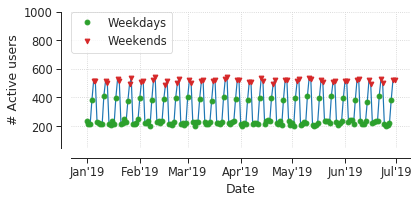

In [286]:
def plot_fig1(df,fn, col='active_users', context="paper"):
    # set background param
    if context == 'paper':
        plt.rc('pdf', fonttype=42)
        sns.set(style="ticks")
        sns.set_context(context, font_scale=1.3)
        fig, ax1 = plt.subplots(figsize=(6, 3))
        c1, c2, c3 = plt.cm.tab10(0), plt.cm.tab10(2), plt.cm.tab10(3)
    else:
        plt.rc('pdf')
        sns.set(style="whitegrid")
        sns.set_context(context)
        fig, ax1 = plt.subplots(figsize=(12, 6))
        c1, c2, c3 = sns.color_palette()[0], sns.color_palette()[2], sns.color_palette()[3]

    # data for plot
    data1 = df[col]
    t = pd.to_datetime(df['dts'])

    # plot line
    ax1.plot(t, data1, color=c1, label='Active users')

    # plot points
    mask = df[df['weekday'] < 6].index
    mask2 = df[df['weekday'] >= 6].index
    if context == 'paper':
        green_dot, = ax1.plot_date(np.array(t)[mask], np.array(data1)[mask],
                                   marker='o', color=c2, label='Weekdays')
        red_dot, = ax1.plot_date(np.array(t)[mask2], np.array(data1)[mask2],
                                 marker='v', color=c3, label='Weekends')
        ax1.grid(ls="dotted")
        ax1.set_ylim(top=1000, bottom=50)
        plt.legend(handles=[green_dot, red_dot], loc='upper left', borderaxespad=0., frameon=True)
    else:
        green_dot, = ax1.plot_date(np.array(t)[mask], np.array(data1)[mask],
                                   marker='o', color=c2, ms=8, label='Weekdays')
        red_dot, = ax1.plot_date(np.array(t)[mask2], np.array(data1)[mask2],
                                 marker='v', color=c3, ms=8, label='Weekends')
        ax1.grid(axis='x')
        ax1.set_ylim(top=1000, bottom=60)
        plt.legend(handles=[green_dot, red_dot], loc='upper left', borderaxespad=0., frameon=True)

    sns.despine(offset=10)

    # ticks & legend
    ax1.set_xlabel('Date')
    ax1.set_ylabel('# Active users')
    months = mdates.MonthLocator()  # every month
    ax1.xaxis.set_major_locator(months)
    monthFmt = mdates.DateFormatter("%b'%y")
    ax1.xaxis.set_major_formatter(monthFmt)

    # save figure
    fig.tight_layout()
    if context == "paper":
        figure_name = os.path.join(FIG_DIR, 'paper_fig_'+fn+'.png')
    else:
        figure_name = os.path.join(FIG_DIR, 'fig_'+fn+'.png')
    plt.savefig(figure_name, dpi=200, transparent=False)
    plt.show()
    
plot_fig1(df_viz, '1')

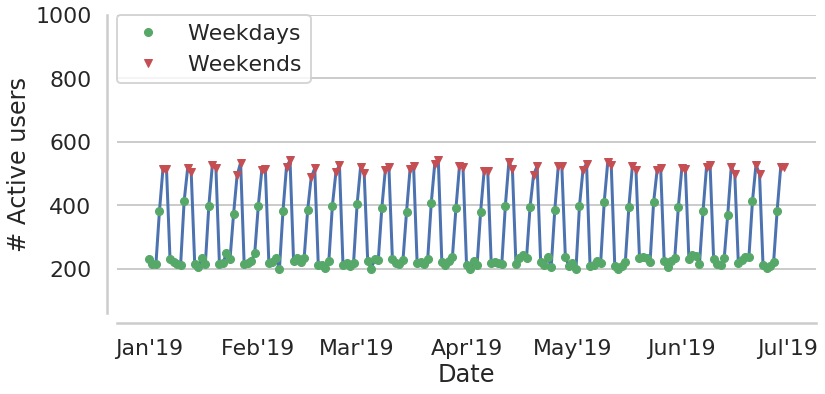

In [287]:
plot_fig1(df_viz,'1', context="poster")

As we see from above plot shows that weekends days Sales of food higher that weekdays sales, yes it is obvious because many of the customers likes to eat of restaurent food on weekends only on the celebration of holiday and most of the people free from work on weekends only.

In [288]:
df_new.groupby([df_new['dts'],df_new['menu_item']]).sum()[0:10]

weekday  party_size  item_price  item_qty
dts                 menu_item                                                 
2019-01-01 11:30:00 KADAHI PANEER          2           1        16.0         2
                    RASMALAI               2           4         6.0         2
                    RICE                   2           3         5.0         1
                    YELLOW DAL FRY         2           3        15.0         1
2019-01-01 11:35:00 GOBI MANCHURIAN        2           4        14.0         1
                    MALAI KOFTA            2           1        16.0         2
2019-01-01 11:40:00 GARLIC NAAN            2           1         3.5         2
                    MALAI KOFTA            2           5        16.0         2
                    YELLOW DAL FRY         2           5        15.0         1
2019-01-01 11:45:00 GARLIC NAAN            2           5         3.5         2

In [289]:
df_new[['item_price', 'item_qty']].describe()

,item_price,item_qty
count,59909.000000,59909.000000
mean,10.610906,1.429385
std,5.918763,0.605616
min,2.750000,1.000000
25%,5.000000,1.000000
50%,11.000000,1.000000
75%,16.000000,2.000000
max,19.000000,4.000000


Analyzing `menu_category` and `menu_item` data fields using groupby with sum operation on `item_qty` which shows total sales by each categorical values

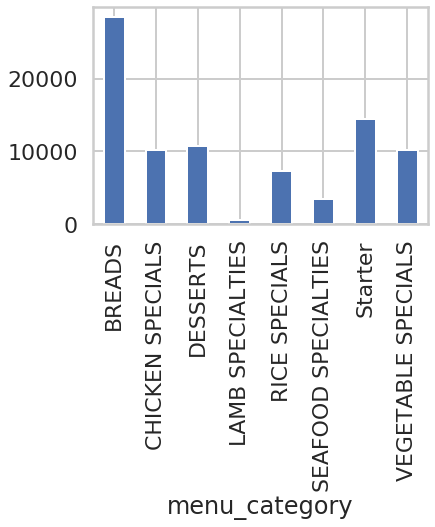

In [290]:
df_new.groupby(['menu_category'])['item_qty'].sum().plot.bar()

We see from the above graph that `Breads` sales are comparatively higher than all other categories and `LAMP SPECIALITIES` are of much lower sales so we can give a hypothesis that in future trend breads will sale more and Lamb Specialities sales less. 

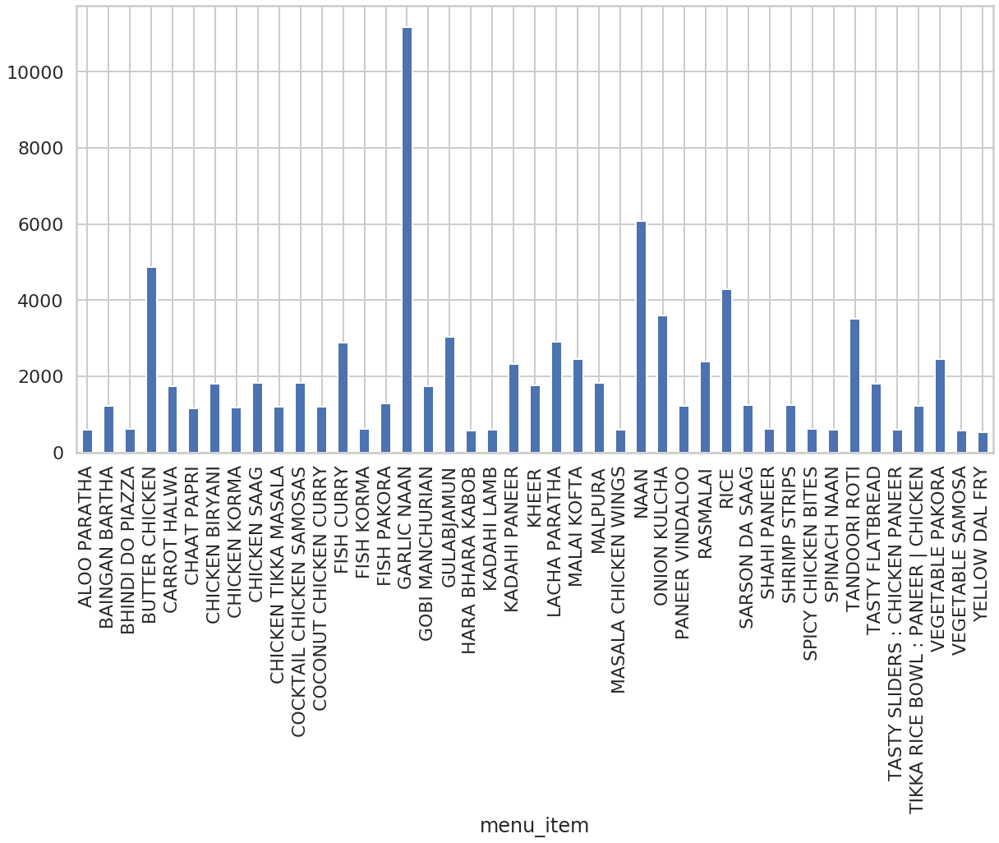

In [291]:
plt.figure(figsize=(20,10))
df_new.groupby(['menu_item'])['item_qty'].sum().plot.bar()

We see from the above graph that `Garlic Naan` sales are comparatively higher than all other menu items and some of items like `yellow dal fry`, `aloo paratha`, `fish lamba` etc are of much lower sales so we can give a hypothesis that in future trend Garlic Naan will sale more compare to other menu items. 

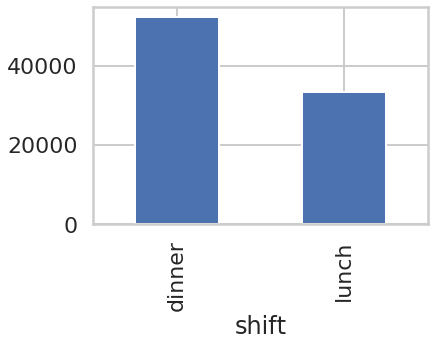

In [292]:
df_new.groupby(['shift'])['item_qty'].sum().plot.bar()

Customers likes to eat food most in dinner shift only than lunch timing seems interesting

### Correlation coefficients of numeric features

The correlation matrix shows some multicollinearity between variables, as well as many weak correlations.

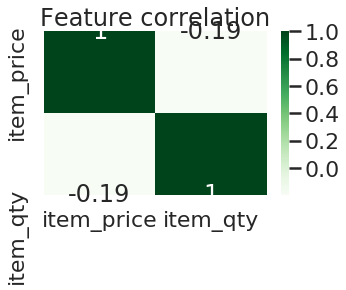

In [293]:
# Feature correlation for all features
plt.figure(figsize=(5, 3))
sns.heatmap(df_new[['item_price','item_qty']].corr(), cmap='Greens', annot=True)
plt.title('Feature correlation');

As their is a negetive coorelation between `item_price` and `item_qty` with value 0.19 Let's apply it while building model.

## Applying Linear Regression

In [294]:
import pandas as pd
from sklearn import preprocessing
import sklearn.model_selection as ms
from sklearn import linear_model
import sklearn.metrics as sklm
import numpy as np
import numpy.random as nr
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as ss
import math

%matplotlib inline

## Prepare the model matrix.

All scikit-learn models require a numpy array of numeric only values for the features. The resulting array is often referred to as the **model matrix**. 

To create a model matrix from cases with both numeric and categorical variables requires two steps. First, the numeric features must be rescaled. Second, the categorical variables must be converted to a set of **dummy variables** to encode the presence or not of each category.  

### Create dummy variables from categorical features

Now, you must create dummy variables for the categorical features. Dummy variables encode categorical features as a set of binary variables. There is one dummy variable for each possible category. For each case all of the values in the dummy variables are set to zero, except the one corresponding to the category value, which is set to one. In this way, a categorical variable with any number of categories can be encoded as series of numeric features which scikit-learn can operate on. This process is referred to as **one hot encoding** since only one dummy variable is coded as 1 (hot) per case. 

The `sklearn.preprocessing` package contains functions to encode categorical features as dummy variables in two steps;
1. The categories are  encoded as numbers starting with 0. For example, if there are 5 categories, they are encoded as the set $\{ 0,1,2,3,4 \}$.
2. The numeric categories are then encoded as dummy variables. 

The following example will give you a feel for how this process works. The code in the cell below computes the numeric representation of the categories for the `shift` feature by the following steps:

1. An encoder object is created using the `LabelEncoder` method.
2. The encoder is `fit` to the unique string values of the feature. 
3. The `transformation` method then applies the numeric encoding to the original feature. 

Execute the code in the cell below and examine the result. 

In [295]:
print(df_new['shift'].unique())
Features = df_new['shift']
enc = preprocessing.LabelEncoder()
enc.fit(Features)
Features = enc.transform(Features)
print(Features)

['lunch' 'dinner']
[1 1 1 ... 0 0 0]


In [296]:
ohe = preprocessing.OneHotEncoder()
encoded = ohe.fit(Features.reshape(-1,1))
print(Features.reshape(-1,1))
Features = encoded.transform(Features.reshape(-1,1)).toarray()
Features[:10,:]

/home/ins/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


[[1]
 [1]
 [1]
 ...
 [0]
 [0]
 [0]]


array([[0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.]])

Now, you need to one hot encode all three categorical variables and append them as columns to the model matrix with the scaled numeric variables. The code in the cell below executes a `for` loop that calls the `encode_string` function and uses the numpy `concatenate` function to add the dummy variables to the model matrix. The `encode_string` function uses the same process discussed above.

In [297]:
def encode_string(cat_feature):
    ## First encode the strings to numeric categories
    enc = preprocessing.LabelEncoder()
    enc.fit(cat_feature)
    enc_cat_feature = enc.transform(cat_feature)
    ## Now, apply one hot encoding
    ohe = preprocessing.OneHotEncoder()
    encoded = ohe.fit(enc_cat_feature.reshape(-1,1))
    return encoded.transform(enc_cat_feature.reshape(-1,1)).toarray()
    

categorical_columns = ['weekday', 'party_size','menu_item']

for col in categorical_columns:
    temp = encode_string(df_new[col])
    Features = np.concatenate([Features, temp], axis = 1)
    #print(Features)

print(Features.shape)
print(Features[:2, :])    

(59909, 57)
[[0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 1.]]


/home/ins/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
/home/ins/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In c

### Add the numeric features

To complete the model matrix, execute the code in the cell below to concatenate the one numeric features.

In [298]:
Features = np.concatenate([Features, np.array(df_new[["item_price"]])], axis = 1)
Features[:2,:]

array([[ 0.,  1.,  0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  5.],
       [ 0.,  1.,  0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  1., 15.]])

## Split the dataset

With the model matrix constructed, you must now create randomly sampled training and test data sets. The code in the cell below uses the `train_test_split` function from the `sklearn.model_selection` module to Bernoulli sample the cases in the original dataset into the two subsets. Since this data set contains enough data having 25% cases will be included in the test dataset. Execute this code. 

In [299]:
## Randomly sample cases to create independent training and test data
nr.seed(9922)
labels = np.array(df_new['item_qty'])
indx = range(Features.shape[0])
indx = ms.train_test_split(indx, test_size = 0.25)
# print(indx)
x_train = Features[indx[0],:]
y_train = np.ravel(labels[indx[0]])
x_test = Features[indx[1],:]
y_test = np.ravel(labels[indx[1]])

In [300]:
x_test.shape

(14978, 58)

## Rescale the numeric features

In [301]:
scaler = preprocessing.StandardScaler().fit(x_train[:,57:])
x_train[:,57:] = scaler.transform(x_train[:,57:])
x_test[:,57:] = scaler.transform(x_test[:,57:])
print(x_train.shape)
x_train[:57,:]

# scaler = preprocessing.StandardScaler().fit(x_train)
# x_train = scaler.transform(x_train)
# x_test = scaler.transform(x_test)
# print(x_train.shape)
# x_train[:5,:]

(44931, 58)


array([[ 1.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  1.41902518],
       [ 0.        ,  1.        ,  0.        , ...,  0.        ,
         0.        ,  0.91235814],
       [ 1.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.57458011],
       ...,
       [ 1.        ,  0.        ,  0.        , ...,  0.        ,
         0.        , -1.19875453],
       [ 0.        ,  1.        ,  0.        , ...,  0.        ,
         0.        ,  1.25013617],
       [ 0.        ,  1.        ,  0.        , ...,  0.        ,
         0.        , -0.43875397]])

In [302]:
## define and fit the linear regression model
lin_mod = linear_model.LinearRegression(fit_intercept = False)
lin_mod.fit(x_train, y_train)

LinearRegression(copy_X=True, fit_intercept=False, n_jobs=None, normalize=False)

## Intially empty your model folder

In [303]:
import os
for x in os.listdir('./models'):
    os.remove('./models/'+x)

In [304]:
from sklearn.externals import joblib 
  
filename = str(int(time.time())) + '_model_' + 'linear_mod.pkl'  
# Save the model as a pickle in a file 
joblib.dump(lin_mod, './models/'+filename) 

['./models/1588744772_model_linear_mod.pkl']

In [305]:
print(lin_mod.intercept_)
print(lin_mod.coef_)

0.0
[ 2.32689737e+12  2.32689737e+12 -2.22717345e+11 -2.22717345e+11
 -2.22717345e+11 -2.22717345e+11 -2.22717345e+11 -2.22717345e+11
 -2.22717345e+11 -1.83048459e+12 -1.83048459e+12 -1.83048459e+12
 -1.83048459e+12 -1.83048459e+12 -4.10248494e+11 -1.41917840e+11
 -1.41917840e+11 -9.31304477e+10 -3.61461103e+11 -2.63886319e+11
 -6.87367518e+10 -9.31304477e+10 -9.31304477e+10 -9.31304477e+10
 -1.90705231e+11 -9.31304477e+10 -6.87367518e+10 -6.87367518e+10
 -1.90705231e+11 -4.46839038e+11 -1.90705231e+11 -3.85854799e+11
 -1.41917840e+11 -6.87367518e+10 -1.41917840e+11 -3.61461103e+11
 -4.10248494e+11 -1.41917840e+11 -3.37067407e+11 -1.90705231e+11
 -4.65134310e+11 -4.10248494e+11 -1.41917840e+11 -3.85854799e+11
 -4.10248494e+11 -1.66311535e+11 -1.41917840e+11 -1.66311535e+11
 -1.90705231e+11 -3.85854799e+11 -4.65134310e+11 -2.63886319e+11
 -1.66311535e+11 -9.31304477e+10 -2.63886319e+11 -2.63886319e+11
 -1.66311535e+11 -1.44436251e+11]


In [306]:
def print_metrics(y_true, y_predicted, n_parameters):
    ## First compute R^2 and the adjusted R^2
    r2 = sklm.r2_score(y_true, y_predicted)
    r2_adj = r2 - (n_parameters - 1)/(y_true.shape[0] - n_parameters) * (1 - r2)
    
    
    ## Print the usual metrics and the R^2 values
    print('Mean Square Error      = ' + str(sklm.mean_squared_error(y_true, y_predicted)))
    print('Root Mean Square Error = ' + str(math.sqrt(sklm.mean_squared_error(y_true, y_predicted))))
    print('Mean Absolute Error    = ' + str(sklm.mean_absolute_error(y_true, y_predicted)))
    print('Median Absolute Error  = ' + str(sklm.median_absolute_error(y_true, y_predicted)))
    print('R^2                    = ' + str(r2))
    print('Adjusted R^2           = ' + str(r2_adj))
    
    return sklm.mean_squared_error(y_true, y_predicted), r2
   
y_score = lin_mod.predict(x_test) 
y_score = [x if x > 0 else 0 for x in y_score]
(rmse, r2) = print_metrics(y_test, y_score, 28)    

Mean Square Error      = 0.15446199483163242
Root Mean Square Error = 0.3930165325169317
Mean Absolute Error    = 0.2725856226569447
Median Absolute Error  = 0.16845703125
R^2                    = 0.5733417944064966
Adjusted R^2           = 0.5725712411254916


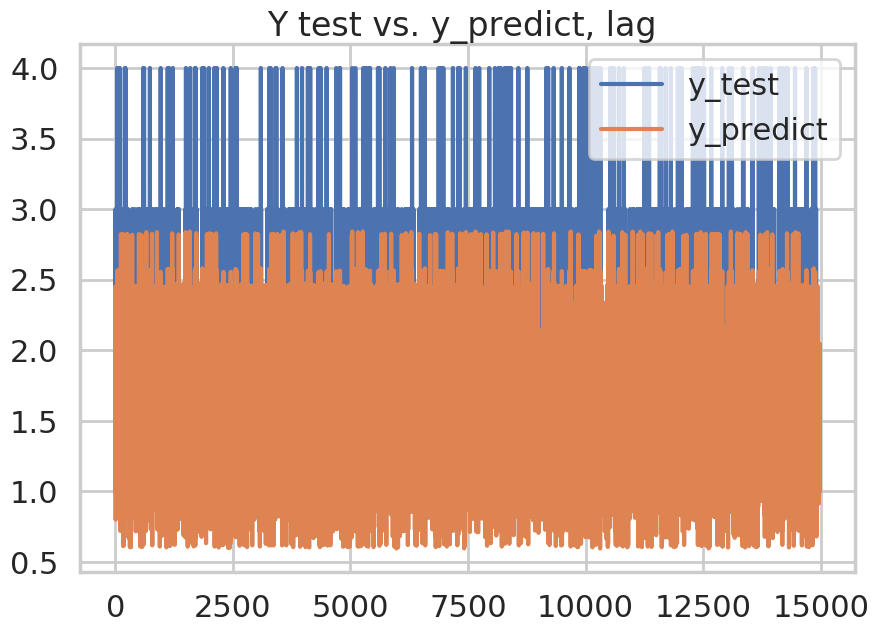

In [307]:
def plot_res(y_test, y_score, label_test, label_score, dpi=100):
    plt.figure(figsize=(10,7), dpi=dpi)
    plt.plot(y_test, label=label_test)
    plt.plot(y_score, label=label_score)
    plt.legend(loc=1)
    plt.title('Y test vs. y_predict, lag ' )
    plt.show()
    
plot_res(y_test, y_score, label_test = 'y_test', label_score='y_predict')

This visual said that it y_test and y_predict are of similar kind of trend seems good.

In [308]:
round_score = [round(num) for num in y_score]
round_score

[2.0,
 2.0,
 2.0,
 2.0,
 1.0,
 1.0,
 1.0,
 2.0,
 1.0,
 1.0,
 1.0,
 2.0,
 2.0,
 2.0,
 1.0,
 1.0,
 2.0,
 1.0,
 2.0,
 1.0,
 2.0,
 1.0,
 1.0,
 2.0,
 1.0,
 1.0,
 1.0,
 1.0,
 2.0,
 1.0,
 1.0,
 1.0,
 1.0,
 2.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 3.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 2.0,
 1.0,
 1.0,
 1.0,
 1.0,
 2.0,
 2.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 3.0,
 1.0,
 2.0,
 2.0,
 2.0,
 2.0,
 1.0,
 1.0,
 2.0,
 2.0,
 1.0,
 2.0,
 2.0,
 2.0,
 1.0,
 1.0,
 2.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 2.0,
 1.0,
 1.0,
 2.0,
 2.0,
 2.0,
 2.0,
 1.0,
 1.0,
 1.0,
 2.0,
 3.0,
 1.0,
 1.0,
 2.0,
 2.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 2.0,
 1.0,
 1.0,
 2.0,
 1.0,
 1.0,
 1.0,
 2.0,
 2.0,
 1.0,
 2.0,
 1.0,
 1.0,
 3.0,
 1.0,
 2.0,
 2.0,
 1.0,
 1.0,
 2.0,
 1.0,
 1.0,
 1.0,
 1.0,
 2.0,
 1.0,
 1.0,
 2.0,
 1.0,
 1.0,
 1.0,
 2.0,
 1.0,
 2.0,
 1.0,
 1.0,
 2.0,
 1.0,
 1.0,
 1.0,
 2.0,
 2.0,
 1.0,
 1.0,
 2.0,
 2.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 2.0,
 1.0,
 1.0,
 2.0,
 1.0,
 2.0,
 2.0,
 2.0,
 1.0

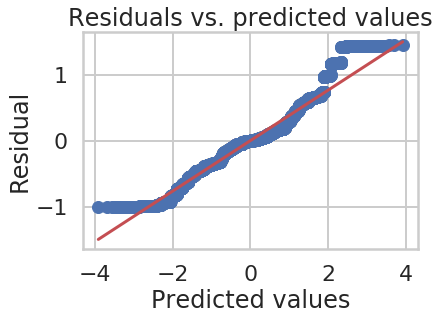

In [309]:
def resid_qq(y_test, round_score):
    ## first compute vector of residuals. 
    resids = np.subtract(y_test, y_score)
    ## now make the residual plots
    ss.probplot(resids.flatten(), plot = plt)
    plt.title('Residuals vs. predicted values')
    plt.xlabel('Predicted values')
    plt.ylabel('Residual')
    
resid_qq(y_test, round_score)   

The Q-Q Normal plot indicates the residuals are close to Normally distributed, show some skew (deviation from the straight line). This is particularly for large residuals. 

In [310]:
model_results = []

In [311]:
# Save all the results
    
model_results_dict = {}
    
model_results_dict['Algo'] = 'Linear Regression'
model_results_dict['lag'] = 'NA'
model_results_dict['dropout'] = 'NA'
model_results_dict['epochs'] = 'NA'
model_results_dict['batch_size'] = 'NA'
model_results_dict['loss'] = 'NA'
model_results_dict['rmse'] = rmse
model_results_dict['power_gen_rmse'] = math.sqrt(rmse)
model_results_dict['r2'] = r2
model_results_dict['model_filename'] = filename
model_results_dict['time_ran'] = int(time.time())
model_results.append(model_results_dict)

In [312]:
new_res_df = pd.DataFrame(model_results)
new_res_df.to_csv('./result/result.csv')

In [313]:
shift = df_new['shift'].unique()
menu = df_new['menu_item'].unique()
menu

array(['RICE', 'YELLOW DAL FRY', 'KADAHI PANEER', 'RASMALAI',
       'GOBI MANCHURIAN', 'MALAI KOFTA', 'GARLIC NAAN', 'GULABJAMUN',
       'ONION KULCHA', 'COCKTAIL CHICKEN SAMOSAS', 'BUTTER CHICKEN',
       'TASTY FLATBREAD', 'FISH CURRY', 'CARROT HALWA',
       'CHICKEN TIKKA MASALA', 'COCONUT CHICKEN CURRY', 'CHICKEN KORMA',
       'BAINGAN BARTHA', 'SPINACH NAAN', 'SHRIMP STRIPS', 'TANDOORI ROTI',
       'SHAHI PANEER', 'SARSON DA SAAG', 'NAAN',
       'TIKKA RICE BOWL : PANEER | CHICKEN', 'MALPURA', 'LACHA PARATHA',
       'KHEER', 'CHICKEN BIRYANI', 'MASALA CHICKEN WINGS',
       'BHINDI DO PIAZZA', 'FISH PAKORA', 'VEGETABLE PAKORA',
       'FISH KORMA', 'ALOO PARATHA', 'TASTY SLIDERS : CHICKEN PANEER',
       'PANEER VINDALOO', 'SPICY CHICKEN BITES', 'CHAAT PAPRI',
       'CHICKEN SAAG', 'KADAHI LAMB', 'VEGETABLE SAMOSA',
       'HARA BHARA KABOB'], dtype=object)

This all distinct menu item which is key role to predict item quantity

### Predicting menu_item and item_qty for the test dataset

In [314]:
res_rows = []
for row,r_score in zip(x_test,round_score):
    res_row = []
    if row[0] == 1:
        res_row.append(shift[1])
    else:
        res_row.append(shift[0])
    
    for i in range(len(menu)):
        if row[i+14] == 1:
            res_row.append(menu[i])
    
    res_row.append(r_score)
    res_rows.append(res_row)
        
res_rows        

[['dinner', 'TANDOORI ROTI', 2.0],
 ['dinner', 'ONION KULCHA', 2.0],
 ['lunch', 'GARLIC NAAN', 2.0],
 ['lunch', 'COCONUT CHICKEN CURRY', 2.0],
 ['lunch', 'TASTY SLIDERS : CHICKEN PANEER', 1.0],
 ['dinner', 'TIKKA RICE BOWL : PANEER | CHICKEN', 1.0],
 ['lunch', 'KHEER', 1.0],
 ['dinner', 'COCONUT CHICKEN CURRY', 2.0],
 ['dinner', 'RASMALAI', 1.0],
 ['lunch', 'FISH PAKORA', 1.0],
 ['dinner', 'COCKTAIL CHICKEN SAMOSAS', 1.0],
 ['dinner', 'CHICKEN SAAG', 2.0],
 ['dinner', 'MALAI KOFTA', 2.0],
 ['dinner', 'FISH KORMA', 2.0],
 ['dinner', 'TASTY FLATBREAD', 1.0],
 ['dinner', 'BHINDI DO PIAZZA', 1.0],
 ['dinner', 'SPICY CHICKEN BITES', 2.0],
 ['dinner', 'BAINGAN BARTHA', 1.0],
 ['lunch', 'CHICKEN TIKKA MASALA', 2.0],
 ['dinner', 'CHICKEN KORMA', 1.0],
 ['dinner', 'CHICKEN TIKKA MASALA', 2.0],
 ['dinner', 'COCKTAIL CHICKEN SAMOSAS', 1.0],
 ['lunch', 'KADAHI LAMB', 1.0],
 ['dinner', 'LACHA PARATHA', 2.0],
 ['dinner', 'RASMALAI', 1.0],
 ['dinner', 'TIKKA RICE BOWL : PANEER | CHICKEN', 1.0],
 ['lu

In [315]:
print(len(res_rows))
print(len(round_score))

14978
14978


In [316]:
res_df = pd.DataFrame(res_rows, columns=['shift', 'menu_item', 'item_qty'])
res_df
pvt = res_df.pivot_table(values='item_qty', index='menu_item', columns='shift',aggfunc=sum)
pvt.sort_values(by=['dinner'], ascending=False)

shift,dinner,lunch
menu_item,,
COCONUT CHICKEN CURRY,1744.0,1182.0
LACHA PARATHA,918.0,651.0
BHINDI DO PIAZZA,769.0,456.0
RASMALAI,701.0,386.0
KHEER,496.0,276.0
PANEER VINDALOO,485.0,275.0
SARSON DA SAAG,424.0,320.0
FISH CURRY,421.0,278.0
NAAN,406.0,258.0


## Expansion and Randomization of data for initial Jul month of 2019 from 01-Jul-2019 to 07-Jul-2019

The `df_TC_to_IQTY2` Dataframe is used to prepare training dataset by random sampling of the dataset `df`

In [317]:
df_TC_to_IQTY2 = df[['ticket_code','party_size','menu_category','menu_item', 'item_price']]
df_TC_to_IQTY2

,ticket_code,party_size,menu_category,menu_item,item_price
0,YALE0001,4,Starter,GOBI MANCHURIAN,14.00
1,YALE0001,4,Starter,TASTY FLATBREAD,11.00
2,YALE0001,4,VEGETABLE SPECIALS,SARSON DA SAAG,15.00
3,YALE0001,4,VEGETABLE SPECIALS,PANEER VINDALOO,16.00
4,YALE0001,4,BREADS,GARLIC NAAN,3.50
5,YALE0001,4,BREADS,NAAN,2.75
6,YALE0002,3,Starter,MASALA CHICKEN WINGS,14.00
7,YALE0002,3,Starter,COCKTAIL CHICKEN SAMOSAS,14.00
8,YALE0002,3,CHICKEN SPECIALS,CHICKEN KORMA,18.00
9,YALE0002,3,RICE SPECIALS,CHICKEN BIRYANI,19.00


In [318]:
random.seed(2021)
start_date = datetime.strptime('2019-07-01 00:00:00', '%Y-%m-%d %H:%M:%S')
end_date = datetime.strptime('2019-07-07 23:00:00', '%Y-%m-%d %H:%M:%S')
date = datetime.strptime('2019-07-01 00:00:00', '%Y-%m-%d %H:%M:%S')
final_rows_list = expansion_randomize_data(start_date, end_date, date, df_TC_to_IQTY2)
final_rows_list

[datetime.datetime(2019, 7, 1, 11, 30), 'lunch', 1, 'UBER004', 'na', 'Starter', 'COCKTAIL CHICKEN SAMOSAS', 14.0]
[datetime.datetime(2019, 7, 1, 11, 30), 'lunch', 1, 'YALE0009', '5', 'BREADS', 'TANDOORI ROTI', 2.75]
[datetime.datetime(2019, 7, 1, 11, 35), 'lunch', 1, 'YALE0006', '3', 'VEGETABLE SPECIALS', 'YELLOW DAL FRY', 15.0]
[datetime.datetime(2019, 7, 1, 11, 40), 'lunch', 1, 'YALE0002', '3', 'Starter', 'COCKTAIL CHICKEN SAMOSAS', 14.0]
[datetime.datetime(2019, 7, 1, 11, 40), 'lunch', 1, 'YALE0017', '5', 'BREADS', 'TANDOORI ROTI', 2.75]
[datetime.datetime(2019, 7, 1, 11, 45), 'lunch', 1, 'YALE0015', '3', 'Starter', 'TASTY FLATBREAD', 11.0]
[datetime.datetime(2019, 7, 1, 11, 45), 'lunch', 1, 'UBER002', 'na', 'BREADS', 'TANDOORI ROTI', 2.75]
[datetime.datetime(2019, 7, 1, 11, 45), 'lunch', 1, 'YALE0017', '5', 'DESSERTS', 'KHEER', 7.0]
[datetime.datetime(2019, 7, 1, 11, 45), 'lunch', 1, 'GRHUB002', 'na', 'CHICKEN SPECIALS', 'CHICKEN SAAG', 18.0]
[datetime.datetime(2019, 7, 1, 11, 50),

[datetime.datetime(2019, 7, 3, 21, 5), 'dinner', 3, 'YALE0006', '3', 'RICE SPECIALS', 'RICE', 5.0]
[datetime.datetime(2019, 7, 3, 21, 5), 'dinner', 3, 'YALE0002', '3', 'CHICKEN SPECIALS', 'CHICKEN KORMA', 18.0]
[datetime.datetime(2019, 7, 3, 21, 10), 'dinner', 3, 'YALE0006', '3', 'RICE SPECIALS', 'RICE', 5.0]
[datetime.datetime(2019, 7, 3, 21, 10), 'dinner', 3, 'YALE0005', '2', 'BREADS', 'ALOO PARATHA', 5.0]
[datetime.datetime(2019, 7, 3, 21, 10), 'dinner', 3, 'YALE0016', '3', 'Starter', 'VEGETABLE PAKORA', 11.0]
[datetime.datetime(2019, 7, 3, 21, 10), 'dinner', 3, 'YALE0009', '5', 'Starter', 'TASTY SLIDERS : CHICKEN PANEER', 15.0]
[datetime.datetime(2019, 7, 3, 21, 15), 'dinner', 3, 'UBER003', 'na', 'BREADS', 'GARLIC NAAN', 3.5]
[datetime.datetime(2019, 7, 3, 21, 15), 'dinner', 3, 'YALE0019', '5', 'Starter', 'MASALA CHICKEN WINGS', 14.0]
[datetime.datetime(2019, 7, 3, 21, 15), 'dinner', 3, 'UBER001', 'na', 'RICE SPECIALS', 'CHICKEN BIRYANI', 19.0]
[datetime.datetime(2019, 7, 3, 21, 15

[datetime.datetime(2019, 7, 5, 20, 50), 'dinner', 5, 'YALE0014', '5', 'DESSERTS', 'GULABJAMUN', 6.0]
[datetime.datetime(2019, 7, 5, 20, 50), 'dinner', 5, 'YALE0006', '3', 'VEGETABLE SPECIALS', 'SHAHI PANEER', 16.0]
[datetime.datetime(2019, 7, 5, 20, 50), 'dinner', 5, 'YALE0004', '5', 'DESSERTS', 'CARROT HALWA', 7.0]
[datetime.datetime(2019, 7, 5, 20, 50), 'dinner', 5, 'YALE0002', '3', 'CHICKEN SPECIALS', 'CHICKEN KORMA', 18.0]
[datetime.datetime(2019, 7, 5, 20, 55), 'dinner', 5, 'YALE0009', '5', 'CHICKEN SPECIALS', 'CHICKEN TIKKA MASALA', 18.0]
[datetime.datetime(2019, 7, 5, 20, 55), 'dinner', 5, 'YALE0010', '2', 'Starter', 'VEGETABLE PAKORA', 11.0]
[datetime.datetime(2019, 7, 5, 20, 55), 'dinner', 5, 'YALE0014', '5', 'DESSERTS', 'CARROT HALWA', 7.0]
[datetime.datetime(2019, 7, 5, 20, 55), 'dinner', 5, 'YALE0008', '3', 'BREADS', 'GARLIC NAAN', 3.5]
[datetime.datetime(2019, 7, 5, 20, 55), 'dinner', 5, 'UBER005', 'na', 'BREADS', 'ONION KULCHA', 5.0]
[datetime.datetime(2019, 7, 5, 21, 0),

[datetime.datetime(2019, 7, 7, 20, 30), 'dinner', 7, 'YALE0010', '2', 'BREADS', 'GARLIC NAAN', 3.5]
[datetime.datetime(2019, 7, 7, 20, 30), 'dinner', 7, 'YALE0017', '5', 'DESSERTS', 'KHEER', 7.0]
[datetime.datetime(2019, 7, 7, 20, 30), 'dinner', 7, 'YALE0005', '2', 'LAMB SPECIALTIES', 'KADAHI LAMB', 19.0]
[datetime.datetime(2019, 7, 7, 20, 30), 'dinner', 7, 'YALE0013', '3', 'DESSERTS', 'RASMALAI', 6.0]
[datetime.datetime(2019, 7, 7, 20, 30), 'dinner', 7, 'YALE0010', '2', 'CHICKEN SPECIALS', 'BUTTER CHICKEN', 18.0]
[datetime.datetime(2019, 7, 7, 20, 35), 'dinner', 7, 'YALE0017', '5', 'BREADS', 'ALOO PARATHA', 5.0]
[datetime.datetime(2019, 7, 7, 20, 35), 'dinner', 7, 'YALE0009', '5', 'DESSERTS', 'CARROT HALWA', 7.0]
[datetime.datetime(2019, 7, 7, 20, 35), 'dinner', 7, 'YALE0020', '2', 'VEGETABLE SPECIALS', 'SARSON DA SAAG', 15.0]
[datetime.datetime(2019, 7, 7, 20, 35), 'dinner', 7, 'YALE0002', '3', 'RICE SPECIALS', 'CHICKEN BIRYANI', 19.0]
[datetime.datetime(2019, 7, 7, 20, 35), 'dinner'

[[datetime.datetime(2019, 7, 1, 11, 30),
  'lunch',
  1,
  'UBER004',
  'na',
  'Starter',
  'COCKTAIL CHICKEN SAMOSAS',
  14.0],
 [datetime.datetime(2019, 7, 1, 11, 30),
  'lunch',
  1,
  'YALE0009',
  '5',
  'BREADS',
  'TANDOORI ROTI',
  2.75],
 [datetime.datetime(2019, 7, 1, 11, 35),
  'lunch',
  1,
  'YALE0006',
  '3',
  'VEGETABLE SPECIALS',
  'YELLOW DAL FRY',
  15.0],
 [datetime.datetime(2019, 7, 1, 11, 40),
  'lunch',
  1,
  'YALE0002',
  '3',
  'Starter',
  'COCKTAIL CHICKEN SAMOSAS',
  14.0],
 [datetime.datetime(2019, 7, 1, 11, 40),
  'lunch',
  1,
  'YALE0017',
  '5',
  'BREADS',
  'TANDOORI ROTI',
  2.75],
 [datetime.datetime(2019, 7, 1, 11, 45),
  'lunch',
  1,
  'YALE0015',
  '3',
  'Starter',
  'TASTY FLATBREAD',
  11.0],
 [datetime.datetime(2019, 7, 1, 11, 45),
  'lunch',
  1,
  'UBER002',
  'na',
  'BREADS',
  'TANDOORI ROTI',
  2.75],
 [datetime.datetime(2019, 7, 1, 11, 45),
  'lunch',
  1,
  'YALE0017',
  '5',
  'DESSERTS',
  'KHEER',
  7.0],
 [datetime.datetime(201

In [319]:
final_df = pd.DataFrame(final_rows_list, columns=['dts','shift','weekday','ticket_code','party_size','menu_category','menu_item', 'item_price'])
final_df

,dts,shift,weekday,ticket_code,party_size,menu_category,menu_item,item_price
0,2019-07-01 11:30:00,lunch,1,UBER004,na,Starter,COCKTAIL CHICKEN SAMOSAS,14.00
1,2019-07-01 11:30:00,lunch,1,YALE0009,5,BREADS,TANDOORI ROTI,2.75
2,2019-07-01 11:35:00,lunch,1,YALE0006,3,VEGETABLE SPECIALS,YELLOW DAL FRY,15.00
3,2019-07-01 11:40:00,lunch,1,YALE0002,3,Starter,COCKTAIL CHICKEN SAMOSAS,14.00
4,2019-07-01 11:40:00,lunch,1,YALE0017,5,BREADS,TANDOORI ROTI,2.75
5,2019-07-01 11:45:00,lunch,1,YALE0015,3,Starter,TASTY FLATBREAD,11.00
6,2019-07-01 11:45:00,lunch,1,UBER002,na,BREADS,TANDOORI ROTI,2.75
7,2019-07-01 11:45:00,lunch,1,YALE0017,5,DESSERTS,KHEER,7.00
8,2019-07-01 11:45:00,lunch,1,GRHUB002,na,CHICKEN SPECIALS,CHICKEN SAAG,18.00
9,2019-07-01 11:50:00,lunch,1,YALE0009,5,DESSERTS,MALPURA,8.00


Removing null values from dataset that you want to predict

In [320]:
final_df['party_size'] = final_df['party_size'].apply(lambda x: 1 if x=='na' else int(x))
final_df[:100]

,dts,shift,weekday,ticket_code,party_size,menu_category,menu_item,item_price
0,2019-07-01 11:30:00,lunch,1,UBER004,1,Starter,COCKTAIL CHICKEN SAMOSAS,14.00
1,2019-07-01 11:30:00,lunch,1,YALE0009,5,BREADS,TANDOORI ROTI,2.75
2,2019-07-01 11:35:00,lunch,1,YALE0006,3,VEGETABLE SPECIALS,YELLOW DAL FRY,15.00
3,2019-07-01 11:40:00,lunch,1,YALE0002,3,Starter,COCKTAIL CHICKEN SAMOSAS,14.00
4,2019-07-01 11:40:00,lunch,1,YALE0017,5,BREADS,TANDOORI ROTI,2.75
5,2019-07-01 11:45:00,lunch,1,YALE0015,3,Starter,TASTY FLATBREAD,11.00
6,2019-07-01 11:45:00,lunch,1,UBER002,1,BREADS,TANDOORI ROTI,2.75
7,2019-07-01 11:45:00,lunch,1,YALE0017,5,DESSERTS,KHEER,7.00
8,2019-07-01 11:45:00,lunch,1,GRHUB002,1,CHICKEN SPECIALS,CHICKEN SAAG,18.00
9,2019-07-01 11:50:00,lunch,1,YALE0009,5,DESSERTS,MALPURA,8.00


`final_df_total` dataframe is all rows from `01-Jan-2019` to `07-Jul-2019` by concanating data of Training and Resultant dataset. After preparing this df we are going to apply model on the rows to predict `item_qty` values. 
- Why we do this?
- The model was fully learned on Training dataset and the data was prepared based on those features in Training dataset so, for not getting unpredictable result we need to prepare data for Resultant dataset as we did for Training dataset to make continous dataset.

In [321]:
final_df_total = pd.concat([df_new[['dts','shift','weekday','ticket_code','party_size','menu_category','menu_item', 'item_price']], final_df], axis=0, sort=False).reset_index(drop=True)
final_df_total.tail(10)

,dts,shift,weekday,ticket_code,party_size,menu_category,menu_item,item_price
62201,2019-07-07 21:55:00,dinner,7,GRHUB001,1,CHICKEN SPECIALS,COCONUT CHICKEN CURRY,18.0
62202,2019-07-07 21:55:00,dinner,7,YALE0011,3,BREADS,ONION KULCHA,5.0
62203,2019-07-07 22:00:00,dinner,7,YALE0014,5,SEAFOOD SPECIALTIES,FISH CURRY,19.0
62204,2019-07-07 22:00:00,dinner,7,YALE0020,2,VEGETABLE SPECIALS,KADAHI PANEER,16.0
62205,2019-07-07 22:00:00,dinner,7,YALE0018,4,VEGETABLE SPECIALS,PANEER VINDALOO,16.0
62206,2019-07-07 22:00:00,dinner,7,UBER004,1,Starter,VEGETABLE PAKORA,11.0
62207,2019-07-07 22:00:00,dinner,7,YALE0016,3,DESSERTS,MALPURA,8.0
62208,2019-07-07 22:00:00,dinner,7,YALE0020,2,CHICKEN SPECIALS,CHICKEN TIKKA MASALA,18.0
62209,2019-07-07 22:00:00,dinner,7,GRHUB001,1,VEGETABLE SPECIALS,KADAHI PANEER,16.0
62210,2019-07-07 22:00:00,dinner,7,UBER004,1,Starter,VEGETABLE PAKORA,11.0


In [322]:
# final_df_total.to_csv('FinalDataFrame.csv')

## Result

In [352]:
final_df_total = pd.read_csv('FinalDataFrame.csv', parse_dates=['dts'])

## Prepare the model matrix.

In [353]:
print(final_df_total['shift'].unique())
Final_Features = final_df_total['shift']
enc = preprocessing.LabelEncoder()
enc.fit(Final_Features)
Final_Features = enc.transform(Final_Features)
print(Final_Features)

['lunch' 'dinner']
[1 1 1 ... 0 0 0]


In [354]:
ohe = preprocessing.OneHotEncoder()
encoded = ohe.fit(Final_Features.reshape(-1,1))
print(Final_Features.reshape(-1,1))
Final_Features = encoded.transform(Final_Features.reshape(-1,1)).toarray()
Final_Features[:10,:]

/home/ins/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


[[1]
 [1]
 [1]
 ...
 [0]
 [0]
 [0]]


array([[0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.]])

In [355]:
def encode_string(cat_feature):
    ## First encode the strings to numeric categories
    enc = preprocessing.LabelEncoder()
    enc.fit(cat_feature)
    enc_cat_feature = enc.transform(cat_feature)
    ## Now, apply one hot encoding
    ohe = preprocessing.OneHotEncoder()
    encoded = ohe.fit(enc_cat_feature.reshape(-1,1))
    return encoded.transform(enc_cat_feature.reshape(-1,1)).toarray()
    

categorical_columns = ['weekday', 'party_size','menu_item']

for col in categorical_columns:
    temp = encode_string(final_df_total[col])
    Final_Features = np.concatenate([Final_Features, temp], axis = 1)
    #print(Features)

print(Final_Features.shape)
print(Final_Features[:2, :])    

(62211, 57)
[[0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 1.]]


/home/ins/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
/home/ins/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In c

In [356]:
Final_Features = np.concatenate([Final_Features, np.array(final_df_total[["item_price"]])], axis = 1)
Final_Features[:2,:]

array([[ 0.,  1.,  0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  5.],
       [ 0.,  1.,  0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  1., 15.]])

In [357]:
scaler = preprocessing.StandardScaler().fit(Final_Features[:,57:])
Final_Features[:,57:] = scaler.transform(Final_Features[:,57:])
print(Final_Features.shape)
Final_Features[:57,:]

# scaler = preprocessing.StandardScaler().fit(x_train)
# x_train = scaler.transform(x_train)
# x_test = scaler.transform(x_test)
# print(x_train.shape)
# x_train[:5,:]

(62211, 58)


array([[ 0.        ,  1.        ,  0.        , ...,  0.        ,
         0.        , -0.9486666 ],
       [ 0.        ,  1.        ,  0.        , ...,  0.        ,
         1.        ,  0.74122555],
       [ 0.        ,  1.        ,  0.        , ...,  0.        ,
         0.        ,  0.91021477],
       ...,
       [ 0.        ,  1.        ,  0.        , ...,  0.        ,
         0.        , -0.9486666 ],
       [ 0.        ,  1.        ,  0.        , ...,  0.        ,
         0.        ,  1.41718241],
       [ 0.        ,  1.        ,  0.        , ...,  0.        ,
         0.        ,  0.91021477]])

In [358]:
res = lin_mod.predict(Final_Features) 
res = [x if x > 0 else 0 for x in res]
res

[468780654.6777344,
 324053483.11743164,
 309580766.8792114,
 454307938.0341797,
 338526200.7578125,
 309580767.34069824,
 309580766.7064209,
 490489731.97854614,
 324053483.2196045,
 454307937.9449463,
 490489731.3442688,
 468780655.7864075,
 468780654.74658203,
 338526201.24072266,
 490489731.3442688,
 490489731.97854614,
 280635332.0336914,
 381944352.2573242,
 324053483.2196045,
 266162615.67370605,
 439835220.46533203,
 280635331.56591797,
 280635332.0307312,
 266162614.7680664,
 280635332.0386658,
 468780654.78015137,
 454307937.9658203,
 468780655.0498047,
 280635332.0675354,
 309580765.95288086,
 280635332.0675354,
 490489731.3442688,
 468780655.7864075,
 454307937.61502075,
 324053484.1694336,
 468780655.4144287,
 309580765.95288086,
 501344268.7446289,
 266162615.67370605,
 439835220.4316406,
 501344269.37890625,
 454307937.9658203,
 338526200.79125977,
 309580766.00927734,
 490489731.3442688,
 280635332.70181274,
 324053483.24365234,
 280635332.70181274,
 501344269.0515137,


As wee see that above result using the linear regression is giving unexpected result as we know that `item_qty` varies as `1,2,3,4` but wee see some predicted output as 0, 487835.... and very large value which is inconvenient result. To resolve this let's apply LSTM model      
- Why LSTM?
- As we see that each row of restaurent data Shows the sales of each day for lunch and dinner respectively. So we can determine that it is time series kind of data since weekend saler are more than weekday sales so that we will get the similar trends of data for each week.

See the below trend of data as we get from `df_viz` dataframe above
![](Figure/paper_fig_1.png)

## Applying LSTM

https://towardsdatascience.com/illustrated-guide-to-lstms-and-gru-s-a-step-by-step-explanation-44e9eb85bf21

In [330]:
x_train.shape

(44931, 58)

The input to every LSTM layer must be three-dimensional.

The three dimensions of this input are:

1. Samples. One sequence is one sample. A batch is comprised of one or more samples.
2. Time Steps. One time step is one point of observation in the sample.
3. Features. One feature is one observation at a time step.

In [331]:
X_train = x_train.reshape((x_train.shape[0], 1, x_train.shape[1]))
X_test = x_test.reshape((x_test.shape[0], 1, x_test.shape[1]))
X_train.shape

(44931, 1, 58)

Train on 44931 samples, validate on 14978 samples
Epoch 1/10
44931/44931 [==============================] - 49s 1ms/sample - loss: 0.2055 - val_loss: 0.0819
Epoch 2/10
44931/44931 [==============================] - 42s 937us/sample - loss: 0.0904 - val_loss: 0.0606
Epoch 3/10
44931/44931 [==============================] - 43s 960us/sample - loss: 0.0741 - val_loss: 0.0584
Epoch 4/10
44931/44931 [==============================] - 38s 856us/sample - loss: 0.0701 - val_loss: 0.0583
Epoch 5/10
44931/44931 [==============================] - 42s 927us/sample - loss: 0.0686 - val_loss: 0.0580
Epoch 6/10
44931/44931 [==============================] - 42s 930us/sample - loss: 0.0674 - val_loss: 0.0577
Epoch 7/10
44931/44931 [==============================] - 43s 956us/sample - loss: 0.0675 - val_loss: 0.0578
Epoch 8/10
44931/44931 [==============================] - 41s 910us/sample - loss: 0.0676 - val_loss: 0.0575
Epoch 9/10
44931/44931 [==============================] - 45s 999us/sample - los

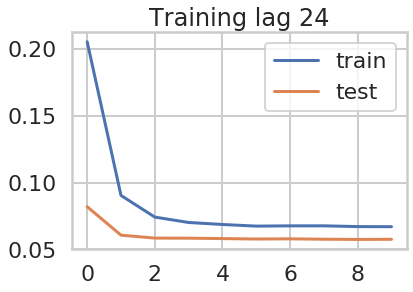

Mean Square Error      = 0.05748328509368642
Root Mean Square Error = 0.23975672064341894
Mean Absolute Error    = 0.11881422751783004
Median Absolute Error  = 0.02291005849838257
R^2                    = 0.8412184479656262
Adjusted R^2           = 0.8409316852964002


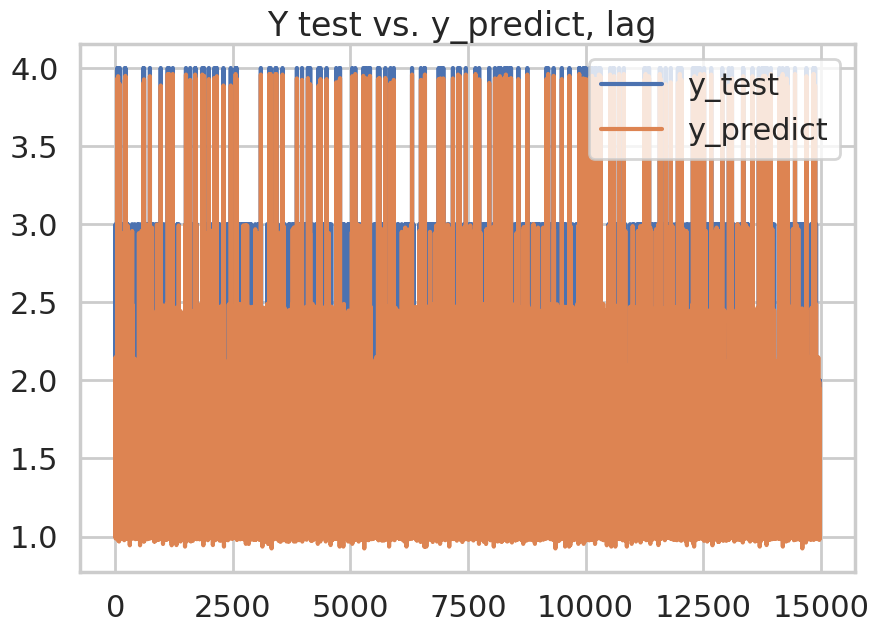

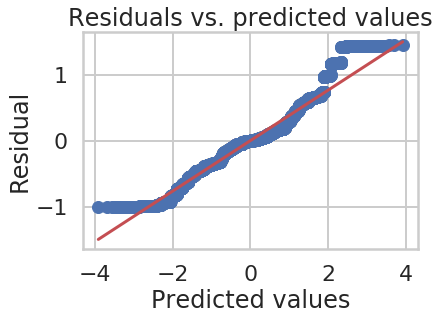

In [332]:
def LSTM_model(X_train, y_train, X_test, y_test,batch_size_= 12, dropout_=.3,epochs_=10, samples=24):
    

    # comment out this box and uncomment load_model to load saved model
    #################################################################################
                                                                                    #
    # design network                                                                #
    model = Sequential()                                                            #
    model.add(LSTM(int(samples), input_shape=(X_train.shape[1], X_train.shape[2]))) #
    model.add(Dropout(dropout_))                                                    #
    model.add(Dense(1))                                                             #
    model.compile(loss='mean_squared_error', optimizer='adam')                      #
                                                                                    #
    # fit network                                                                   #
    history = model.fit(X_train,                                                    #
                        y_train,                                                    #
                        epochs=epochs_,                                             #
                        batch_size=batch_size_,                                     #
                        validation_data=(X_test, y_test),                           #
                        verbose=1,                                                  #
                        shuffle=False)                                              #
                                                                                    #
    # Save model for later                                                          #
    filename = str(int(time.time())) + '_model_' + str(samples) + '_lag.h5'         #
    model.save('./models/' + filename)                                              #
                                                                                    #
    #################################################################################

    # uncomment to load 
    #model = load_model('./models/1539911055_model_672_lag.h5')

    # plot history
    plt.plot(history.history['loss'], label='train')
    plt.plot(history.history['val_loss'], label='test')
    plt.legend()
    plt.title('Training lag ' + str(samples))
    plt.show()
    
    y_score = model.predict(X_test) 
    y_score = [x[0] if x > 0 else 0 for x in y_score]
    round_score = [round(num) for num in y_score]
    (rmse, r2) = print_metrics(y_test, y_score, 28)
    plot_res(y_test, y_score, label_test = 'y_test', label_score='y_predict')
    resid_qq(y_test, round_score)   
    
    # Save all the results
    
    model_results_dict = {}

    model_results_dict['Algo'] = 'LSTM'
    model_results_dict['lag'] = samples
    model_results_dict['dropout'] = dropout_
    model_results_dict['epochs'] = epochs_
    model_results_dict['batch_size'] = batch_size_
    model_results_dict['loss'] = history.history
    model_results_dict['rmse'] = rmse
    model_results_dict['power_gen_rmse'] = math.sqrt(rmse)
    model_results_dict['r2'] = r2
    model_results_dict['model_filename'] = filename
    model_results_dict['time_ran'] = int(time.time())
    model_results.append(model_results_dict)
    
    return model
    

model = LSTM_model(X_train,y_train, X_test,y_test)

At first glance, these metrics look promising. The RMSE, MAE are all small and in a similar range. However, notice that the $R^2$ and $R^2_{adj}$ are also same. Also MSE is of very low value we can say that it is good model

The Q-Q Normal plot indicates the residuals are close to Normally distributed, show some skew (deviation from the straight line). This is particularly for large residuals. 

Train on 44931 samples, validate on 14978 samples
Epoch 1/10
44931/44931 [==============================] - 59s 1ms/sample - loss: 0.1396 - val_loss: 0.0628
Epoch 2/10
44931/44931 [==============================] - 48s 1ms/sample - loss: 0.0731 - val_loss: 0.0585
Epoch 3/10
44931/44931 [==============================] - 44s 981us/sample - loss: 0.0686 - val_loss: 0.0587
Epoch 4/10
44931/44931 [==============================] - 53s 1ms/sample - loss: 0.0657 - val_loss: 0.0582
Epoch 5/10
44931/44931 [==============================] - 53s 1ms/sample - loss: 0.0644 - val_loss: 0.0578
Epoch 6/10
44931/44931 [==============================] - 55s 1ms/sample - loss: 0.0636 - val_loss: 0.0583
Epoch 7/10
44931/44931 [==============================] - 52s 1ms/sample - loss: 0.0623 - val_loss: 0.0577
Epoch 8/10
44931/44931 [==============================] - 63s 1ms/sample - loss: 0.0618 - val_loss: 0.0579
Epoch 9/10
44931/44931 [==============================] - 57s 1ms/sample - loss: 0.0614 - va

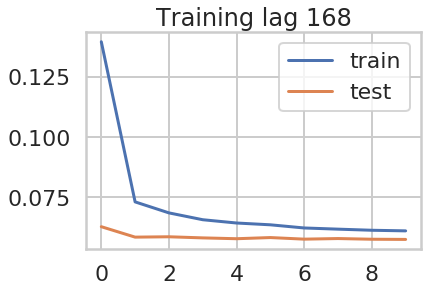

Mean Square Error      = 0.05755678288606387
Root Mean Square Error = 0.23990994745125485
Mean Absolute Error    = 0.11752028991119425
Median Absolute Error  = 0.020020365715026855
R^2                    = 0.8410154308011448
Adjusted R^2           = 0.8407283014788459


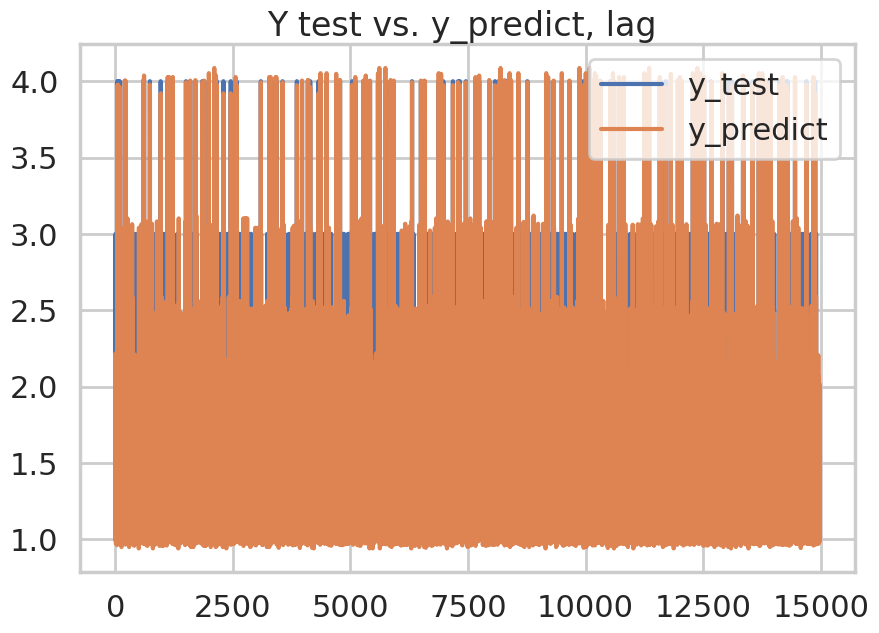

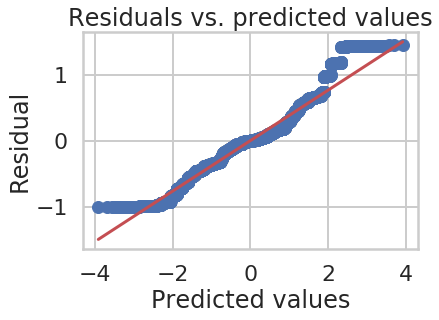

In [345]:
batch_size_ = 12
dropout_ =0.33
epochs_ = 10
samples = 168

LSTM_model(X_train,y_train, X_test,y_test, batch_size_, dropout_, epochs_, samples)

In [346]:
model_results

[{'Algo': 'Linear Regression',
  'lag': 'NA',
  'dropout': 'NA',
  'epochs': 'NA',
  'batch_size': 'NA',
  'loss': 'NA',
  'rmse': 0.15446199483163242,
  'power_gen_rmse': 0.3930165325169317,
  'r2': 0.5733417944064966,
  'model_filename': '1588744772_model_linear_mod.pkl',
  'time_ran': 1588744788},
 {'Algo': 'LSTM',
  'lag': 24,
  'dropout': 0.3,
  'epochs': 10,
  'batch_size': 12,
  'loss': {'loss': [0.20551582305146973,
    0.09036519439668239,
    0.074116501129018,
    0.07008197017253683,
    0.06857681665728733,
    0.06735894022781944,
    0.067549746795166,
    0.06756773284395974,
    0.06700109319605688,
    0.06691941948460935],
   'val_loss': [0.08189828879245188,
    0.06056823084110799,
    0.058377916671437734,
    0.05831110482248534,
    0.05800990448939883,
    0.05768402661280208,
    0.05782505971949172,
    0.05753562682447492,
    0.05738880481678576,
    0.05748328506921583]},
  'rmse': 0.05748328509368642,
  'power_gen_rmse': 0.23975672064341894,
  'r2': 0.841

In [347]:
new_res_df = pd.DataFrame(model_results)
# old_res_df = pd.read_csv('./result/result.csv', index_col=0)
# res_df = pd.concat([old_res_df, new_res_df], axis=0, sort=False).reset_index(drop=True)
new_res_df.to_csv('./result/result.csv')

In [348]:
models_by_r2 = new_res_df.sort_values(by='r2', ascending=False)
models_by_r2.head()

,Algo,lag,dropout,epochs,batch_size,loss,rmse,power_gen_rmse,r2,model_filename,time_ran
1,LSTM,24,0.3,10,12,"{'loss': [0.20551582305146973, 0.0903651943966...",0.057483,0.239757,0.841218,1588745268_model_24_lag.h5,1588745282
3,LSTM,168,0.33,10,12,"{'loss': [0.13961095864411774, 0.0731341225616...",0.057557,0.239910,0.841015,1588747204_model_168_lag.h5,1588747213
2,LSTM,672,0.33,10,12,"{'loss': [0.11655625849468186, 0.0684846930509...",0.058054,0.240943,0.839643,1588746375_model_672_lag.h5,1588746384
0,Linear Regression,NA,NA,NA,NA,NA,0.154462,0.393017,0.573342,1588744772_model_linear_mod.pkl,1588744788


In [349]:
model_filename = models_by_r2['model_filename'].iloc[0]  ## get the best model to predict
if(model_filename.endswith('.pkl')):
    model = joblib.load('./models/'+ model_filename)
else:
    model = load_model('./models/'+ model_filename)

In [359]:
if(model_filename.endswith('.h5')):
    Final_Features = Final_Features.reshape((Final_Features.shape[0], 1,Final_Features.shape[1]))
    # make a prediction
    res = model.predict(Final_Features)
    # print(res)
    # sets floor for res
    res = [x[0] if x > 0 else 0 for x in res]
else:
    # make a prediction
    res = model.predict(Final_Features)
    # print(res)
    # sets floor for res
    res = [x if x > 0 else 0 for x in res]

In [360]:
final_round_score = [round(num) for num in res]
final_round_score

[1.0,
 1.0,
 2.0,
 2.0,
 1.0,
 2.0,
 2.0,
 2.0,
 1.0,
 1.0,
 2.0,
 2.0,
 1.0,
 2.0,
 2.0,
 2.0,
 1.0,
 1.0,
 1.0,
 2.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 2.0,
 2.0,
 1.0,
 2.0,
 1.0,
 1.0,
 2.0,
 2.0,
 1.0,
 1.0,
 1.0,
 2.0,
 1.0,
 2.0,
 2.0,
 1.0,
 2.0,
 1.0,
 2.0,
 1.0,
 2.0,
 2.0,
 1.0,
 2.0,
 2.0,
 2.0,
 2.0,
 1.0,
 1.0,
 2.0,
 2.0,
 2.0,
 2.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 2.0,
 1.0,
 1.0,
 1.0,
 1.0,
 2.0,
 1.0,
 1.0,
 2.0,
 1.0,
 2.0,
 1.0,
 2.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 2.0,
 2.0,
 1.0,
 2.0,
 1.0,
 1.0,
 1.0,
 2.0,
 1.0,
 1.0,
 2.0,
 1.0,
 1.0,
 1.0,
 1.0,
 2.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 2.0,
 1.0,
 2.0,
 1.0,
 1.0,
 2.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 2.0,
 2.0,
 1.0,
 1.0,
 2.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 2.0,
 1.0,
 1.0,
 1.0,
 2.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 2.0,
 1.0,
 1.0,
 1.0,
 2.0,
 1.0,
 1.0,
 1.0,
 2.0,
 1.0,
 4.0,
 2.0,
 2.0,
 2.0,
 2.0,
 1.0,
 1.0,
 1.0,
 2.0,
 1.0,
 1.0,
 1.0,
 1.0,
 2.0

In [361]:
start_date = '2019-07-01'
end_date = '2019-07-31'
mask = (final_df_total.dts >= start_date) & (final_df_total.dts <= end_date)
df_mask = final_df_total.loc[mask]
df_mask

,Unnamed: 0,dts,shift,weekday,ticket_code,party_size,menu_category,menu_item,item_price
59909,59909,2019-07-01 11:30:00,lunch,1,UBER004,1,Starter,COCKTAIL CHICKEN SAMOSAS,14.00
59910,59910,2019-07-01 11:30:00,lunch,1,YALE0009,5,BREADS,TANDOORI ROTI,2.75
59911,59911,2019-07-01 11:35:00,lunch,1,YALE0006,3,VEGETABLE SPECIALS,YELLOW DAL FRY,15.00
59912,59912,2019-07-01 11:40:00,lunch,1,YALE0002,3,Starter,COCKTAIL CHICKEN SAMOSAS,14.00
59913,59913,2019-07-01 11:40:00,lunch,1,YALE0017,5,BREADS,TANDOORI ROTI,2.75
59914,59914,2019-07-01 11:45:00,lunch,1,YALE0015,3,Starter,TASTY FLATBREAD,11.00
59915,59915,2019-07-01 11:45:00,lunch,1,UBER002,1,BREADS,TANDOORI ROTI,2.75
59916,59916,2019-07-01 11:45:00,lunch,1,YALE0017,5,DESSERTS,KHEER,7.00
59917,59917,2019-07-01 11:45:00,lunch,1,GRHUB002,1,CHICKEN SPECIALS,CHICKEN SAAG,18.00
59918,59918,2019-07-01 11:50:00,lunch,1,YALE0009,5,DESSERTS,MALPURA,8.00


In [362]:
# df_mask.index[0]

df_mask['item_qty'] = final_round_score[df_mask.index[0]:]
df_mask

/home/ins/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


,Unnamed: 0,dts,shift,weekday,ticket_code,party_size,menu_category,menu_item,item_price,item_qty
59909,59909,2019-07-01 11:30:00,lunch,1,UBER004,1,Starter,COCKTAIL CHICKEN SAMOSAS,14.00,2.0
59910,59910,2019-07-01 11:30:00,lunch,1,YALE0009,5,BREADS,TANDOORI ROTI,2.75,2.0
59911,59911,2019-07-01 11:35:00,lunch,1,YALE0006,3,VEGETABLE SPECIALS,YELLOW DAL FRY,15.00,1.0
59912,59912,2019-07-01 11:40:00,lunch,1,YALE0002,3,Starter,COCKTAIL CHICKEN SAMOSAS,14.00,1.0
59913,59913,2019-07-01 11:40:00,lunch,1,YALE0017,5,BREADS,TANDOORI ROTI,2.75,2.0
59914,59914,2019-07-01 11:45:00,lunch,1,YALE0015,3,Starter,TASTY FLATBREAD,11.00,1.0
59915,59915,2019-07-01 11:45:00,lunch,1,UBER002,1,BREADS,TANDOORI ROTI,2.75,1.0
59916,59916,2019-07-01 11:45:00,lunch,1,YALE0017,5,DESSERTS,KHEER,7.00,1.0
59917,59917,2019-07-01 11:45:00,lunch,1,GRHUB002,1,CHICKEN SPECIALS,CHICKEN SAAG,18.00,2.0
59918,59918,2019-07-01 11:50:00,lunch,1,YALE0009,5,DESSERTS,MALPURA,8.00,1.0


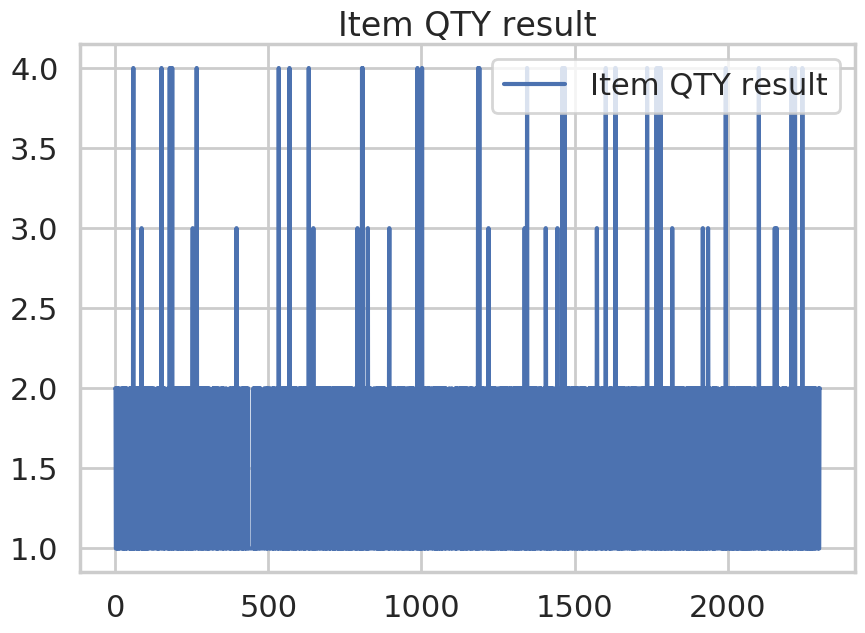

In [363]:
plt.figure(figsize=(10,7), dpi=100)
plt.plot(final_round_score[df_mask.index[0]:], label='Item QTY result')
plt.legend(loc=1)
plt.title('Item QTY result')
plt.show()

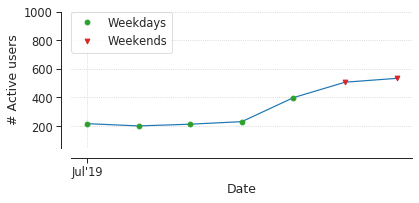

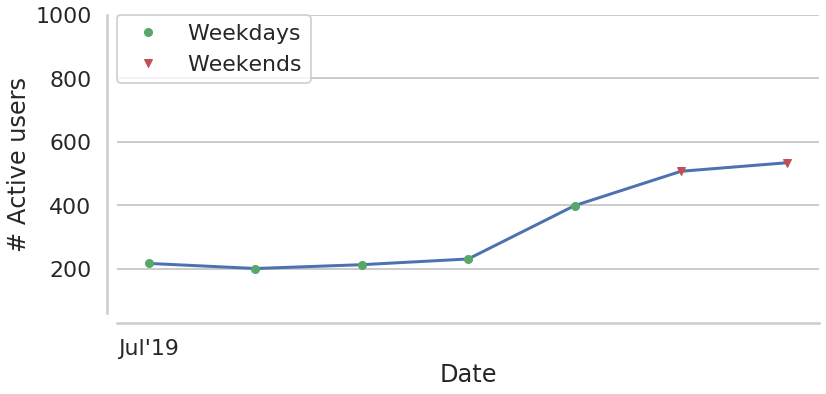

In [364]:
df_viz = viz_data(df_mask)
plot_fig1(df_viz, '2')
plot_fig1(df_viz,'2', context="poster")

In [365]:
pvt = df_mask.pivot_table(values='item_qty', index='menu_item', columns='shift',aggfunc=sum)
pvt.sort_values(by=['dinner','lunch'], ascending=False)

shift,dinner,lunch
menu_item,,
GARLIC NAAN,263.0,135.0
NAAN,145.0,98.0
BUTTER CHICKEN,104.0,58.0
TANDOORI ROTI,91.0,53.0
RICE,89.0,60.0
FISH CURRY,75.0,53.0
MALAI KOFTA,72.0,28.0
GULABJAMUN,65.0,35.0
ONION KULCHA,57.0,49.0


So, this is the above final result of predicted `menu_item` and `item_quantity` with top salling menu's as `Garlic naan`, `naan`, `Butten Chicken`, `Rice` etc with respective 
dinner sales as `274,150,119,104` and lunch sales `136,91,66,67` etc

## Summary

In this notebook I have done the following in the process of constructing and evaluating linear regression and LSTM model for predicting `item_qty` based on various features:   
1. Rename the fields name for easy access to dataframe.
2. Expansion and random sampling of data from 01-Jan to 30-Jun 2019 as per instruction given to prepare the data. 
3. Replacing null values with 1 from part_size to make a seperate category value.
4. EDA for Analysing volume forecasting of customers for each month based on shift(lunch/dinner)
5. Applying Linear regression model and Evaluated the performance of the model using both numeric and graphical methods and save the model.
6. Get a prediction item qty using Linear Regression model and get to know that it is not useful model to predict item quantity.
7. Applying LSTM model and Evaluated the performance of the model using both numeric and graphical methods and save the model.
8. Get the best model from result.csv 
9. Evaluated the performance of the model using both numeric and graphical methods. 
10. Estimated above final result of predicted `menu_item` and `item_quantity` by applying pivoting the df_mask dataframe
